# DAR Heatmap

In [1]:
from sklearn.preprocessing import minmax_scale

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%load_ext lab_black

In [3]:
import glob

In [4]:
{x.split("/")[-1]: x for x in glob.glob("downstream_analysis/DARs/*/*DARs.bed")}

{'EPF_hydrop_2.FIXEDCELLS__CD14+_monocyte__DARs.bed': 'downstream_analysis/DARs/EPF_hydrop_2.FIXEDCELLS/EPF_hydrop_2.FIXEDCELLS__CD14+_monocyte__DARs.bed',
 'EPF_hydrop_2.FIXEDCELLS__Natural_killer_cell__DARs.bed': 'downstream_analysis/DARs/EPF_hydrop_2.FIXEDCELLS/EPF_hydrop_2.FIXEDCELLS__Natural_killer_cell__DARs.bed',
 'EPF_hydrop_2.FIXEDCELLS__CD4+_T_cell__DARs.bed': 'downstream_analysis/DARs/EPF_hydrop_2.FIXEDCELLS/EPF_hydrop_2.FIXEDCELLS__CD4+_T_cell__DARs.bed',
 'EPF_hydrop_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.bed': 'downstream_analysis/DARs/EPF_hydrop_2.FIXEDCELLS/EPF_hydrop_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.bed',
 'EPF_hydrop_2.FIXEDCELLS__B_cell__DARs.bed': 'downstream_analysis/DARs/EPF_hydrop_2.FIXEDCELLS/EPF_hydrop_2.FIXEDCELLS__B_cell__DARs.bed',
 'CNA_10xv11_3.FIXEDCELLS__Cytotoxic_T_cell__DARs.bed': 'downstream_analysis/DARs/CNA_10xv11_3.FIXEDCELLS/CNA_10xv11_3.FIXEDCELLS__Cytotoxic_T_cell__DARs.bed',
 'CNA_10xv11_3.FIXEDCELLS__Natural_killer_cell__DARs.bed': 'downstre

In [5]:
dar_path_df = pd.DataFrame(
    glob.glob("downstream_analysis/DARs/*/*DARs.bed"),
    index=[x.split("/")[-1] for x in glob.glob("downstream_analysis/DARs/*/*DARs.bed")],
)
for dar_path in dar_path_df.index:
    dar_df = pd.read_csv(
        dar_path_df.loc[dar_path][0],
        sep="\t",
        header=None,
    )
    n_dars = len(dar_df)
    print(n_dars)
    dar_path_df.at[dar_path, "n_dars"] = n_dars

23336
2892
5873
6588
4079
14276
10414
12654
33016
14539
31705
2427
5469
9010
21271
20125
6833
5557
31150
28716
11251
8388
13879
12133
26188
8534
10197
8114
11168
29671
29637
3458
3370
12586
12405
5237
3084
14057
32505
10472
13552
33915
11138
8946
9628
7966
11431
20966
24403
24006
10221
7786
8323
7912
21389
25724
4528
16403
6305
3269
14896
3852
32491
14992
13099
12311
11903
32320
22388
25257
28875
25778
10153
26677
26793
9977
9882
7935
33714
5128
9338
7967
10001
19478
29169
11640
29453
11438
10347
5331
30632
5838
7699
21255
7132
7449
32289
9756
27322
29564
6903
10733
11005
29890
4660
9544
18145
4066
28661
10843
8542
29208
9108
8907
24039
9074
27203
27164
9984
8306
14461
34297
312
25305
19310
8177
13127
30763
8094
2985
6367
28396
28288
10381
14176
14288
11780
10178
21489
8734
14264
920
15848
9876
8029
11556
7114
24867
7941
11068
32202
14935
15735
25733
11589
35362
10938
28961
28707
13610
11568
9228
23018
31223
10453
12714
31796
12595
9317
26268
6755
10365
25082
8955
10007
13689
9957
1020

In [6]:
dar_path_df["sample"] = [x.split("__")[0] for x in dar_path_df.index]
dar_path_df["sample"] = [
    x.replace("CNA_10xv11_4", "CNA_10xv11c_1")
    .replace("CNA_10xv11_5", "CNA_10xv11c_2")
    .replace("BRO_mtscatac", "BRO_mtscatacfacs")
    for x in dar_path_df["sample"]
]
dar_path_df["tech"] = [x.split("__")[0].split("_")[1] for x in dar_path_df["sample"]]

In [7]:
dar_path_df["cell_type"] = [x.split("__")[1] for x in dar_path_df.index]

In [8]:
n_dars_df = dar_path_df.pivot(index="sample", columns="cell_type", values="n_dars")

In [9]:
n_dars_df = n_dars_df.assign(replicate=[x.split(".")[0] for x in n_dars_df.index])
n_dars_df = n_dars_df.assign(
    tech=[x.split(".")[0].split("_")[1] for x in n_dars_df.index]
)

In [10]:
n_dars_df = n_dars_df.sort_values(by=["tech", "replicate"])

In [11]:
list(n_dars_df.index)

['CNA_10xmultiome_1.FIXEDCELLS',
 'CNA_10xmultiome_2.FIXEDCELLS',
 'SAN_10xmultiome_1.FIXEDCELLS',
 'SAN_10xmultiome_2.FIXEDCELLS',
 'VIB_10xmultiome_1.FIXEDCELLS',
 'VIB_10xmultiome_2.FIXEDCELLS',
 'VIB_10xv1_1.FIXEDCELLS',
 'VIB_10xv1_2.FIXEDCELLS',
 'CNA_10xv11_1.FIXEDCELLS',
 'CNA_10xv11_2.FIXEDCELLS',
 'CNA_10xv11_3.FIXEDCELLS',
 'STA_10xv11_1.FIXEDCELLS',
 'STA_10xv11_2.FIXEDCELLS',
 'TXG_10xv11_1.FIXEDCELLS',
 'CNA_10xv11c_1.FIXEDCELLS',
 'CNA_10xv11c_2.FIXEDCELLS',
 'CNA_10xv2_1.FIXEDCELLS',
 'CNA_10xv2_2.FIXEDCELLS',
 'TXG_10xv2_1.FIXEDCELLS',
 'TXG_10xv2_2.FIXEDCELLS',
 'VIB_10xv2_1.FIXEDCELLS',
 'VIB_10xv2_2.FIXEDCELLS',
 'BIO_ddseq_1.FIXEDCELLS',
 'BIO_ddseq_2.FIXEDCELLS',
 'BIO_ddseq_3.FIXEDCELLS',
 'BIO_ddseq_4.FIXEDCELLS',
 'HAR_ddseq_1.FIXEDCELLS',
 'HAR_ddseq_2.FIXEDCELLS',
 'UCS_ddseq_1.FIXEDCELLS',
 'UCS_ddseq_2.FIXEDCELLS',
 'CNA_hydrop_1.FIXEDCELLS',
 'CNA_hydrop_2.FIXEDCELLS',
 'CNA_hydrop_3.FIXEDCELLS',
 'EPF_hydrop_1.FIXEDCELLS',
 'EPF_hydrop_2.FIXEDCELLS',
 'EP

In [12]:
n_dars_df = n_dars_df[
    [
        "B_cell",
        "CD4+_T_cell",
        "Cytotoxic_T_cell",
        "Natural_killer_cell",
        "CD14+_monocyte",
        "CD16+_monocyte",
        "Dendritic_cell",
    ]
]

In [13]:
n_dars_df_normalized = n_dars_df.transform(lambda x: minmax_scale(x.astype(float)))

In [14]:
n_dars_df_normalized

cell_type,B_cell,CD4+_T_cell,Cytotoxic_T_cell,Natural_killer_cell,CD14+_monocyte,CD16+_monocyte,Dendritic_cell
sample,,,,,,,
CNA_10xmultiome_1.FIXEDCELLS,0.244959,0.417459,0.379526,0.435484,0.665457,NaN,0.762327
CNA_10xmultiome_2.FIXEDCELLS,0.170431,0.416341,0.249038,0.364801,0.702811,NaN,0.868311
SAN_10xmultiome_1.FIXEDCELLS,0.199992,0.388206,0.321291,0.470588,0.737404,0.706706,NaN
SAN_10xmultiome_2.FIXEDCELLS,0.202815,0.462223,0.337509,0.483476,0.743981,0.721993,NaN
VIB_10xmultiome_1.FIXEDCELLS,0.122399,0.495435,0.299576,0.442916,0.609301,NaN,NaN
VIB_10xmultiome_2.FIXEDCELLS,0.196645,0.439957,0.380704,0.342188,0.615972,NaN,0.742276
VIB_10xv1_1.FIXEDCELLS,0.196282,0.489612,0.365821,0.437935,0.594906,0.490942,0.539778
VIB_10xv1_2.FIXEDCELLS,0.240603,0.582635,0.439017,0.515101,0.731974,0.692808,0.848528
CNA_10xv11_1.FIXEDCELLS,0.310574,0.617477,0.548810,0.628874,0.718789,0.703479,NaN


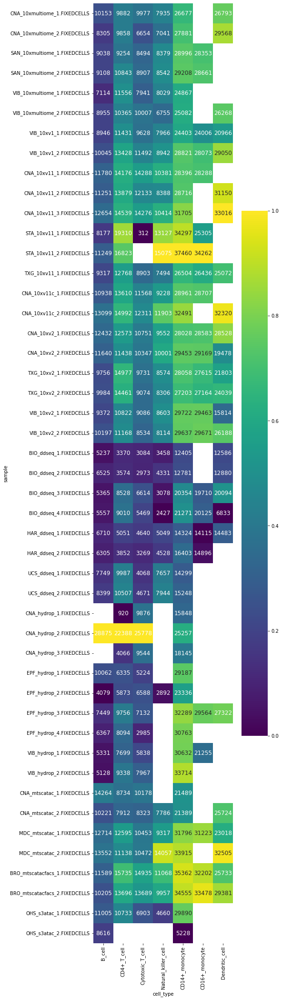

In [15]:
n_rows = len(n_dars_df)
n_cols = len(n_dars_df.columns)

f, ax = plt.subplots(figsize=(n_cols * 1.25, n_rows * 1.25))
sns.heatmap(n_dars_df_normalized, ax=ax, square=True, cmap="viridis")
sns.set(font_scale=1)
sns.heatmap(
    n_dars_df.round(0),
    annot=True,
    ax=ax,
    fmt="g",
    square=True,
    cmap=None,
    cbar=False,
    alpha=0,
)
sns.set(font_scale=2)

plt.tight_layout()
plt.savefig("plots_pub/DAR_count_bysample.png", dpi=300, facecolor="white")

### bytech

In [16]:
n_dars_df = dar_path_df.pivot_table(
    index="tech", columns="cell_type", values="n_dars", aggfunc="mean"
)

In [17]:
n_dars_df

cell_type,B_cell,CD14+_monocyte,CD16+_monocyte,CD4+_T_cell,Cytotoxic_T_cell,Dendritic_cell,Natural_killer_cell
tech,,,,,,,
10xmultiome,8778.833333,27118.500000,28507.000000,10293.000000,8663.333333,27543.000000,7780.166667
10xv1,9495.500000,26612.000000,26039.500000,12429.500000,10560.000000,25008.000000,8454.000000
10xv11,10738.000000,31179.666667,28572.750000,15249.166667,9982.400000,29746.000000,10813.166667
10xv11c,12018.500000,30726.000000,28707.000000,14301.000000,11939.500000,32320.000000,10565.500000
10xv2,10563.500000,28683.500000,28610.833333,12573.166667,9587.166667,22641.666667,8858.333333
ddseq,6480.875000,15885.625000,17211.500000,6734.875000,4348.500000,13375.200000,4809.000000
hydrop,9613.000000,26574.555556,25409.500000,8274.333333,8992.444444,27322.000000,2892.000000
mtscatac,12687.750000,27147.250000,31223.000000,10094.750000,9856.500000,27082.333333,10386.666667
mtscatacfacs,10897.000000,34958.500000,32840.000000,14715.500000,14312.000000,27557.000000,10512.500000


In [18]:
n_dars_df = n_dars_df.loc[
    [
        "10xv2",
        "10xv1",
        "10xv11",
        "10xv11c",
        "10xmultiome",
        "mtscatac",
        "mtscatacfacs",
        "ddseq",
        "s3atac",
        "hydrop",
    ]
]

In [19]:
cell_type_alias_dict = {
    "Cytotoxic T cell": "Cytotoxic T cell",
    "CD4+ T cell": "Naive T cell",
    "CD14+ monocyte": "CD14+ monocyte",
    "B cell": "B cell",
    "Natural killer cell": "Natural killer cell",
    "CD16+ monocyte": "CD16+ monocyte",
    "Dendritic cell": "Dendritic cell",
}

In [20]:
cell_order = [cell_type_alias_dict[x] for x in cell_type_alias_dict]

In [21]:
n_dars_df.columns = [
    cell_type_alias_dict[x.replace("_", " ")] for x in n_dars_df.columns
]

In [22]:
n_dars_df = n_dars_df[cell_order]

In [23]:
tech_alias_dict = {
    "10xmultiome": "10x Multiome",
    "10xv1": "10x v1",
    "10xv11": "10x v1.1",
    "10xv11c": "10x v1.1 (control)",
    "10xv2": "10x v2",
    "ddseq": "Bio-Rad ddSEQ SureCell",
    "hydrop": "HyDrop",
    "mtscatac": "mtscATAC-seq",
    "mtscatacfacs": "mtscATAC-seq (FACS)",
    "s3atac": "s3-ATAC",
}

In [24]:
n_dars_df.index = [tech_alias_dict[x] for x in n_dars_df.index]

In [25]:
n_dars_df

,Cytotoxic T cell,Naive T cell,CD14+ monocyte,B cell,Natural killer cell,CD16+ monocyte,Dendritic cell
10x v2,9587.166667,12573.166667,28683.500000,10563.500000,8858.333333,28610.833333,22641.666667
10x v1,10560.000000,12429.500000,26612.000000,9495.500000,8454.000000,26039.500000,25008.000000
10x v1.1,9982.400000,15249.166667,31179.666667,10738.000000,10813.166667,28572.750000,29746.000000
10x v1.1 (control),11939.500000,14301.000000,30726.000000,12018.500000,10565.500000,28707.000000,32320.000000
10x Multiome,8663.333333,10293.000000,27118.500000,8778.833333,7780.166667,28507.000000,27543.000000
mtscATAC-seq,9856.500000,10094.750000,27147.250000,12687.750000,10386.666667,31223.000000,27082.333333
mtscATAC-seq (FACS),14312.000000,14715.500000,34958.500000,10897.000000,10512.500000,32840.000000,27557.000000
Bio-Rad ddSEQ SureCell,4348.500000,6734.875000,15885.625000,6480.875000,4809.000000,17211.500000,13375.200000
s3-ATAC,6903.000000,10733.000000,17559.000000,9810.500000,4660.000000,NaN,NaN
HyDrop,8992.444444,8274.333333,26574.555556,9613.000000,2892.000000,25409.500000,27322.000000


In [26]:
from sklearn.preprocessing import minmax_scale

In [27]:
n_dars_df_normalized = n_dars_df.transform(lambda x: minmax_scale(x.astype(float)))

In [28]:
sns.set_context("notebook")
sns.set_style("darkgrid")

In [29]:
n_dars_df_k = n_dars_df / 1000

In [30]:
tech_order = [
    "10x v1",
    "10x v1.1",
    "10x v1.1 (control)",
    "10x v2",
    "10x Multiome",
    "mtscATAC-seq",
    "mtscATAC-seq (FACS)",
    "Bio-Rad ddSEQ SureCell",
    "s3-ATAC",
    "HyDrop",
]

In [31]:
n_dars_df_k = n_dars_df_k.loc[tech_order]
n_dars_df_normalized = n_dars_df_normalized.loc[tech_order]

In [32]:
ultrashort_index = "v1 v1.1 v1.1c v2 MO mt mt* ddS s3 Hy".split()

In [33]:
n_dars_df_k.index = ultrashort_index
n_dars_df_normalized.index = ultrashort_index

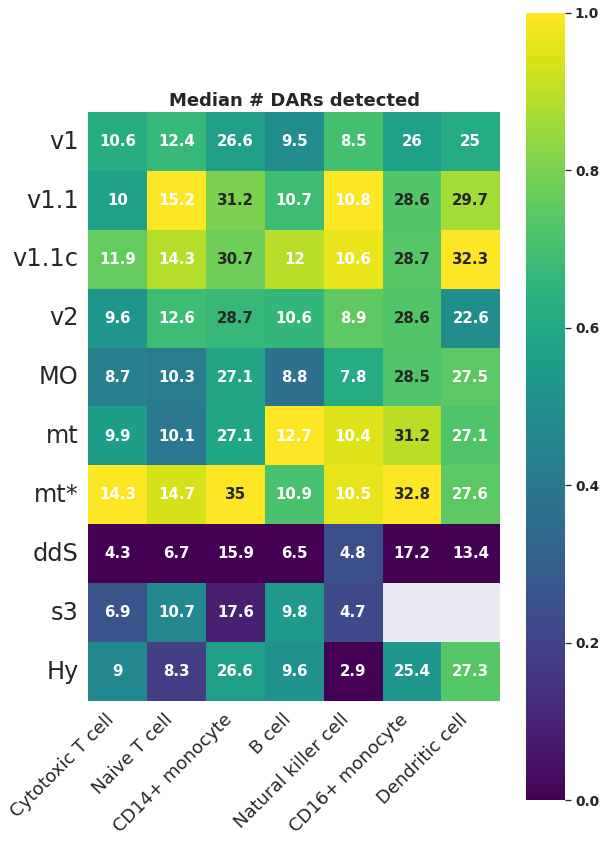

In [34]:
n_rows = len(n_dars_df)
n_cols = len(n_dars_df.columns)
sns.set(font_scale=1)
sns.set(font_scale=1.25)

sizefactor = 1.25
f, ax = plt.subplots(figsize=(n_cols * sizefactor, n_rows * sizefactor))
plt.rcParams["font.weight"] = "bold"
sns.heatmap(n_dars_df_normalized, ax=ax, square=True, cmap="viridis")
sns.heatmap(
    n_dars_df_k.round(1),
    annot=True,
    ax=ax,
    fmt="g",
    square=True,
    cmap=None,
    cbar=False,
    alpha=0,
)
plt.yticks(rotation=0, fontsize=24)
plt.xticks(rotation=45, fontsize=18, ha="right")
plt.tight_layout()
plt.title("Median # DARs detected", fontsize=18, fontweight="bold")
plt.savefig("plots_pub/DAR_count_mean_bytech.svg", dpi=600, facecolor="white")
plt.savefig("plots_pub/DAR_count_mean_bytech.png", dpi=600, facecolor="white")

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%load_ext lab_black

The lab_black extension is already loaded. To reload it, use:
  %reload_ext lab_black


In [36]:
df = pd.read_csv(
    "cistarget/fixedcells_3_cistopic_consensus_allsamples.NOMINNES.ctx", sep="\t"
)

In [37]:
df["sample"] = [x.split("__")[0] for x in df["#GeneSignatureID"]]

In [38]:
df["sample"] = [
    x.replace("CNA_10xv11_4", "CNA_10xv11c_1")
    .replace("CNA_10xv11_5", "CNA_10xv11c_2")
    .replace("BRO_mtscatac", "BRO_mtscatacfacs")
    for x in df["sample"]
]

In [39]:
df["cell_type"] = [x.split("__")[1] for x in df["#GeneSignatureID"]]

In [40]:
df["sample__cell_type"] = df["sample"] + "__" + df["cell_type"]

In [41]:
df["tech"] = [x.split("_")[1] for x in df["sample"]]

In [42]:
df["rank_within_GeneSignatureID"] = df.groupby("#GeneSignatureID")["NES"].rank(
    "dense", ascending=False
)

In [43]:
df["rank_within_GeneSignatureID"]

0             1.0
1             2.0
2             3.0
3             4.0
4             5.0
            ...  
2613970    8617.0
2613971    8618.0
2613972    8619.0
2613973    8620.0
2613974    8620.0
Name: rank_within_GeneSignatureID, Length: 2613975, dtype: float64

In [44]:
df_top50 = df[df["rank_within_GeneSignatureID"] <= 50]

In [45]:
df_top50

,#GeneSignatureID,Rank,FeatureID,FeatureDescription,FeatureAnnotations,FeatureDatabase,AUC,NES,CandidateTargetIDs,TopTargetIDs,TopTargetRanks,sample,cell_type,sample__cell_type,tech,rank_within_GeneSignatureID
0,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,1,taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,SPIB [ETS],SPIB,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.029930,13.902882,chr10:17771014-17771352;chr17:74809024-7480935...,chr10:17771014-17771352;chr17:74809024-7480935...,55;196;221;296;424;462;463;467;542;547;652;745...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,1.0
1,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,2,taipale_cyt_meth__SPIB_RAWWGRGGAAGTN_FL_meth,"SPIB [ETS, CpG-meth]",SPIB,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.027094,12.446126,chr17:74809024-74809352;chr10:17771014-1777135...,chr17:74809024-74809352;chr10:17771014-1777135...,139;154;210;311;349;389;408;452;557;610;641;73...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,2.0
2,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,3,cisbp__M6485,"SPIB[gene ID: ""ENSG00000142539"" species: ""Homo...",NaN,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.025550,11.653176,chr10:17771014-17771352;chr2:40450021-40450370...,chr10:17771014-17771352;chr2:40450021-40450370...,59;335;369;421;454;458;465;517;851;877;897;934...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,3.0
3,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,4,transfac_pro__M01203,V$SPI1_01: SPI1 (PU1),SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.025418,11.585805,chr10:17771014-17771352;chr4:73181276-73181619...,chr10:17771014-17771352;chr4:73181276-73181619...,28;130;141;146;181;261;346;359;462;554;901;947...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,4.0
4,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,5,cisbp__M6119,"SPI1[gene ID: ""ENSG00000066336"" species: ""Homo...",SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.025369,11.560518,chr4:73181276-73181619;chr8:60332971-60333311;...,chr4:73181276-73181619;chr8:60332971-60333311;...,124;190;314;324;498;500;522;609;694;728;817;91...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2604612,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,46,taipale_cyt_meth__ELF5_NANNAGGAAGTN_eDBD_meth,"ELF5 [ETS, CpG-meth]",ELF5,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.016181,8.093512,chr6:154341310-154341657;chr4:105014271-105014...,chr6:154341310-154341657;chr4:105014271-105014...,497;512;553;576;737;753;761;807;1044;1077;1168...,CNA_10xv11c_1.FIXEDCELLS,CD14+_monocyte,CNA_10xv11c_1.FIXEDCELLS__CD14+_monocyte,10xv11c,46.0
2604613,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,47,cisbp__M4631,"SPI1[gene ID: ""ENSG00000066336"" species: ""Homo...",SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.016146,8.072700,chr20:8271771-8272119;chr5:72937795-72938131;c...,chr20:8271771-8272119;chr5:72937795-72938131;c...,95;99;154;234;782;832;957;1115;1434;1702;1876;...,CNA_10xv11c_1.FIXEDCELLS,CD14+_monocyte,CNA_10xv11c_1.FIXEDCELLS__CD14+_monocyte,10xv11c,47.0
2604614,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,48,dbcorrdb__SPI1__ENCSR000BGW_1__m1,"SPI1 (ENCSR000BGW-1, motif 1)",SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.016090,8.039129,chr6:162712757-162712969;chr5:72937795-7293813...,chr6:162712757-162712969;chr5:72937795-7293813...,118;291;356;525;575;582;583;633;675;721;923;10...,CNA_10xv11c_1.FIXEDCELLS,CD14+_monocyte,CNA_10xv11c_1.FIXEDCELLS__CD14+_monocyte,10xv11c,48.0
2604615,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,49,hocomoco__NFIL3_HUMAN.H11MO.0.D,NFIL3_HUMAN,NFIL3,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.015958,7.9

In [46]:
df_top50_counts = (
    df_top50.groupby(["cell_type", "FeatureAnnotations"]).size().unstack(fill_value=0)
)
df_top50_counts

FeatureAnnotations,AR,ARID3A,ASCL1,"ASCL2,ASCL1",ASPSCR1,ATF3,"ATF5,NKX3-2",ATOH1,BACH1,BACH2,...,ZNF691,ZNF697,ZNF713,ZNF76,ZNF774,ZNF775,ZNF799,ZNF99,ZSCAN10,ZSCAN4
cell_type,,,,,,,,,,,,,,,,,,,,,
B_cell,0,0,1,1,1,0,16,0,0,0,...,0,0,1,0,0,0,1,1,0,0
CD14+_monocyte,0,0,0,0,0,1,1,1,1,1,...,1,1,0,0,0,0,0,0,0,1
CD16+_monocyte,0,0,0,0,0,0,3,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD4+_T_cell,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
Cytotoxic_T_cell,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,2,0,0,0,0
Dendritic_cell,0,0,0,0,0,0,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Natural_killer_cell,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


B_cell


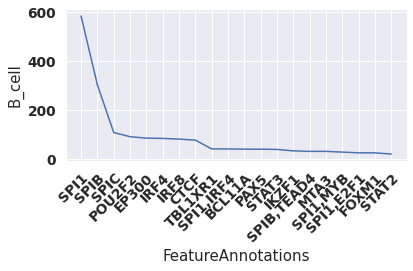

CD14+_monocyte


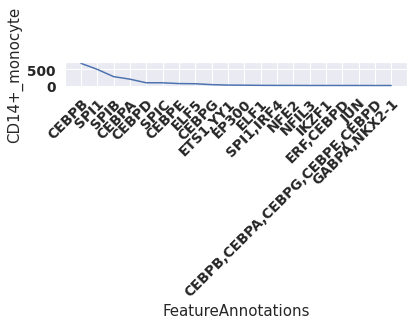

CD16+_monocyte


/tmp/ipykernel_640032/656010102.py:6: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


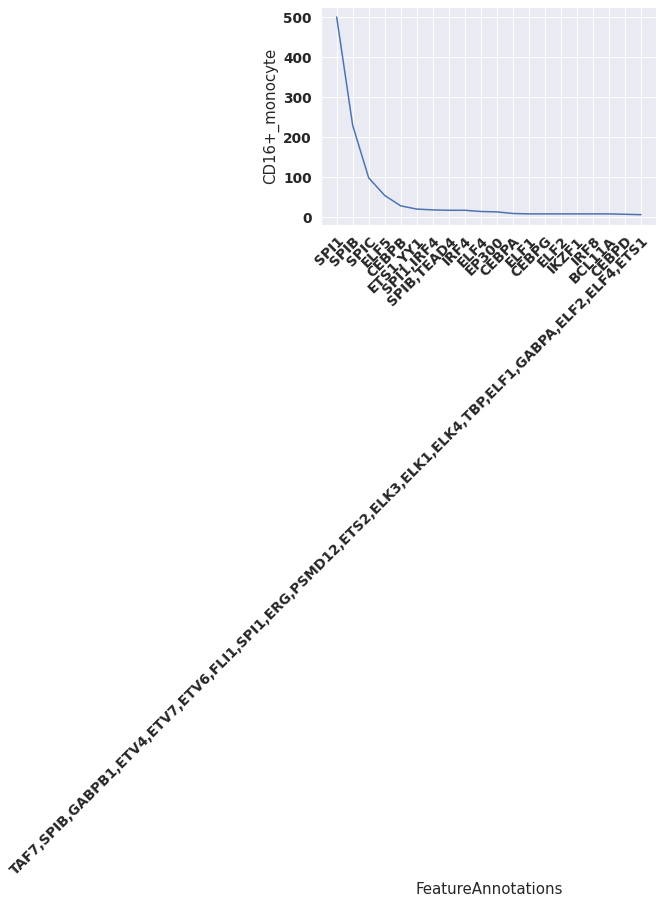

CD4+_T_cell


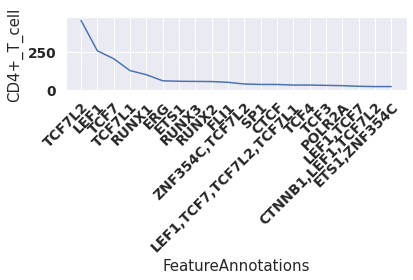

Cytotoxic_T_cell


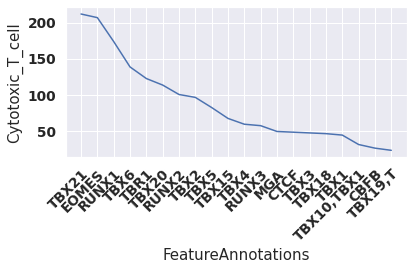

Dendritic_cell


/tmp/ipykernel_640032/656010102.py:6: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


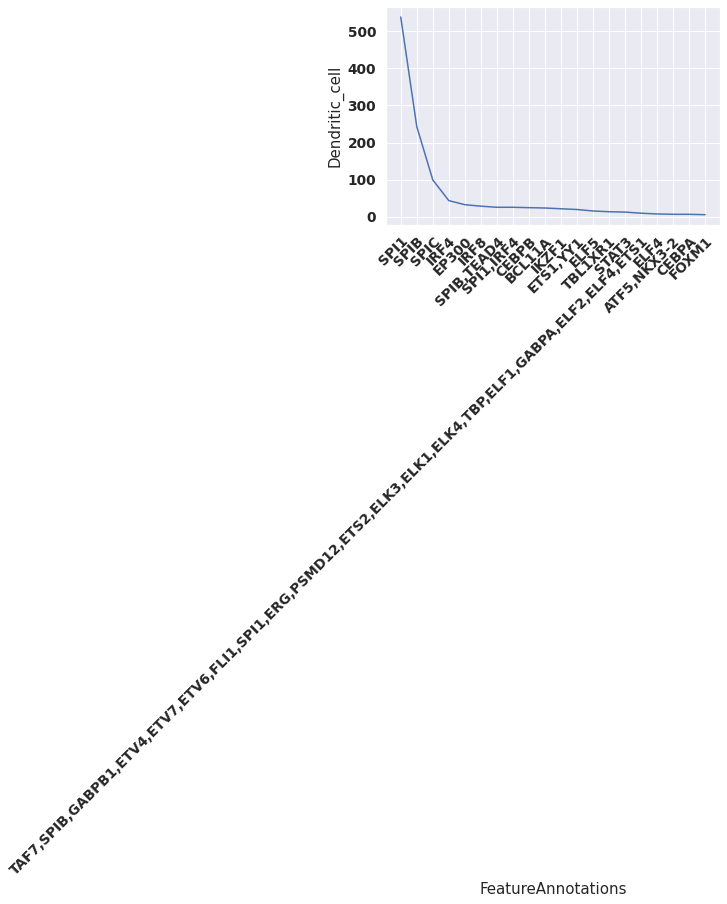

Natural_killer_cell


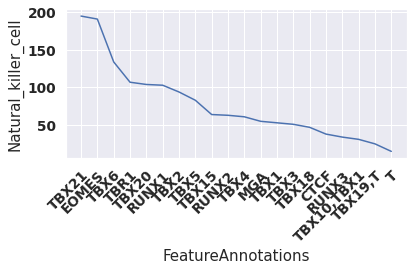

In [47]:
for cell_type in df_top50_counts.index:
    print(cell_type)
    df_sub = df_top50_counts.loc[cell_type].sort_values(ascending=False)
    g = sns.lineplot(data=df_sub[0:20])
    plt.xticks(rotation=45, rotation_mode="anchor", ha="right")
    plt.tight_layout()
    plt.savefig(
        f"cistarget/plots_cell_type/{cell_type}__TOP50MOTIFS__top20motifsbyoccurrence.png",
        dpi=150,
        facecolor="white",
    )
    plt.show()
    plt.close()

# counts per occurrence of motif

In [48]:
df_counts = (
    df.groupby(["#GeneSignatureID", "FeatureAnnotations"]).size().unstack(fill_value=0)
)
df_counts

FeatureAnnotations,A1CF,ABCF2,ABL1,ACAA1,ACO1,ADARB1,"ADNP,ZHX2,SIX5,ZHX1,SIX2,ZHX3,IRX5,IRX4",ADNP2,AEBP2,AFF4,...,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN5C,ZSCAN9,ZSWIM1,ZXDA,ZXDB,ZXDC,ZZZ3
#GeneSignatureID,,,,,,,,,,,,,,,,,,,,,
BIO_ddseq_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed,1,0,1,2,1,1,0,0,1,1,...,2,2,0,0,2,0,2,2,1,0
BIO_ddseq_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed,0,0,0,1,1,1,0,0,1,1,...,8,2,0,0,0,1,2,2,1,1
BIO_ddseq_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed,0,0,1,1,1,1,0,1,2,1,...,6,0,0,0,1,0,2,2,1,1
BIO_ddseq_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed,0,1,1,1,1,1,0,0,2,1,...,8,0,0,0,1,0,2,2,1,0
BIO_ddseq_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed,1,1,0,1,1,1,0,1,2,1,...,4,3,0,0,0,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VIB_hydrop_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed,1,0,1,1,1,1,0,1,1,0,...,7,0,1,0,2,0,1,1,0,0
VIB_hydrop_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed,1,0,1,0,1,0,0,0,1,1,...,10,1,0,0,1,0,2,2,1,0
VIB_hydrop_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed,0,0,1,1,1,1,0,0,2,1,...,9,2,0,0,2,0,0,0,0,0


BIO_ddseq_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


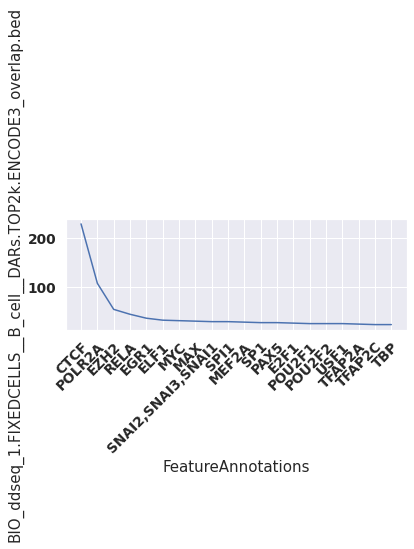

BIO_ddseq_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


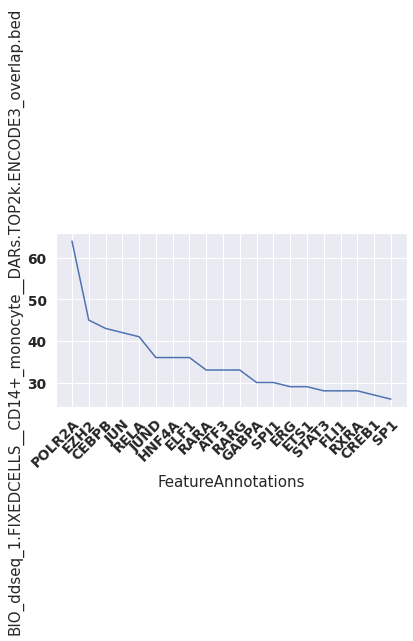

BIO_ddseq_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


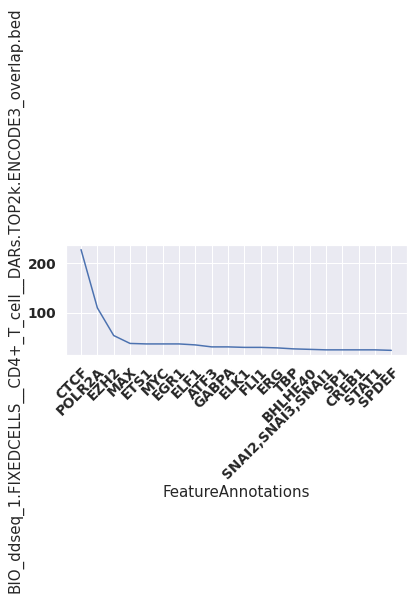

BIO_ddseq_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


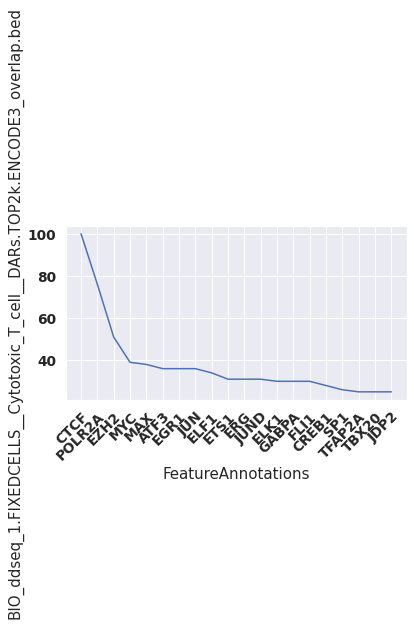

BIO_ddseq_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


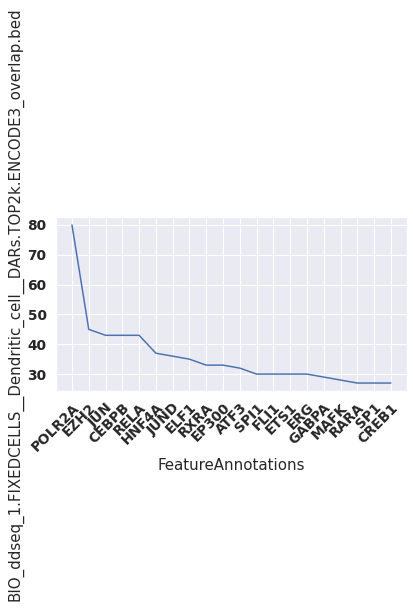

BIO_ddseq_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


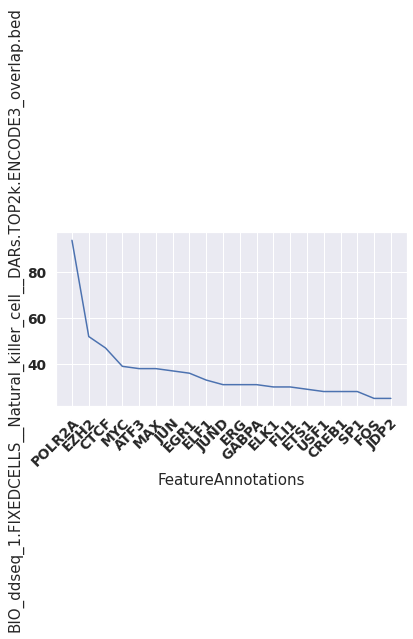

BIO_ddseq_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


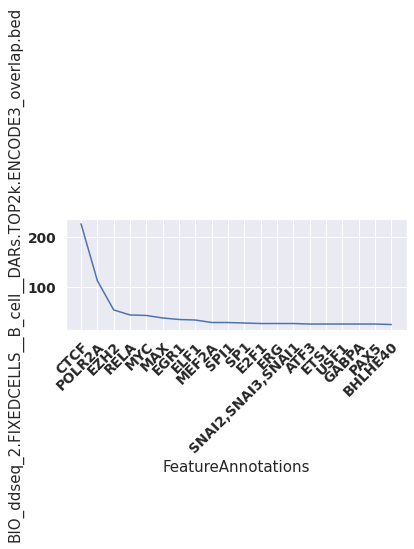

BIO_ddseq_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


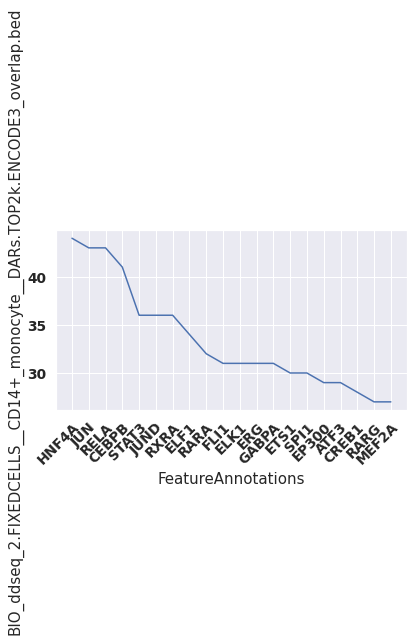

BIO_ddseq_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


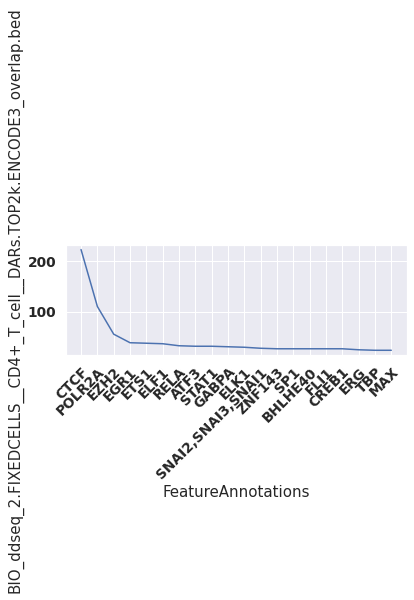

BIO_ddseq_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


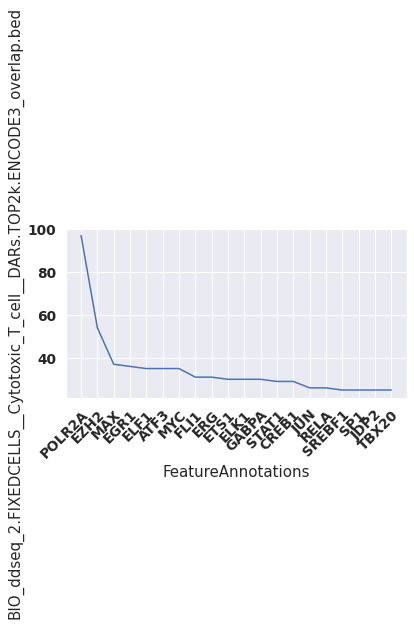

BIO_ddseq_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


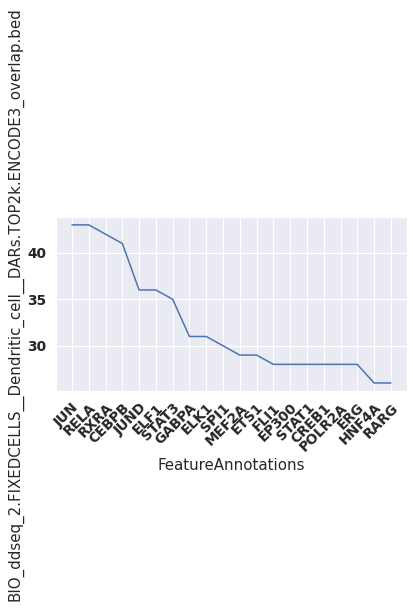

BIO_ddseq_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


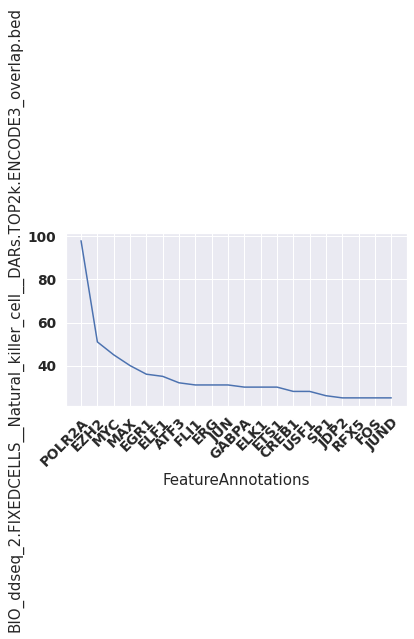

BIO_ddseq_3.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


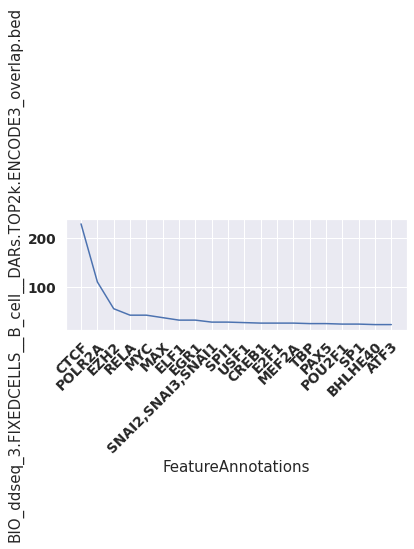

BIO_ddseq_3.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


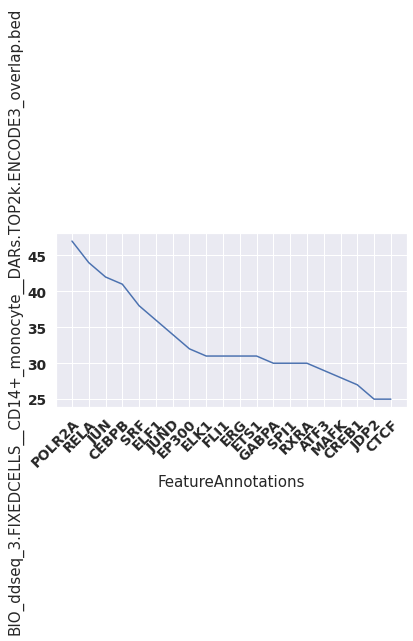

BIO_ddseq_3.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


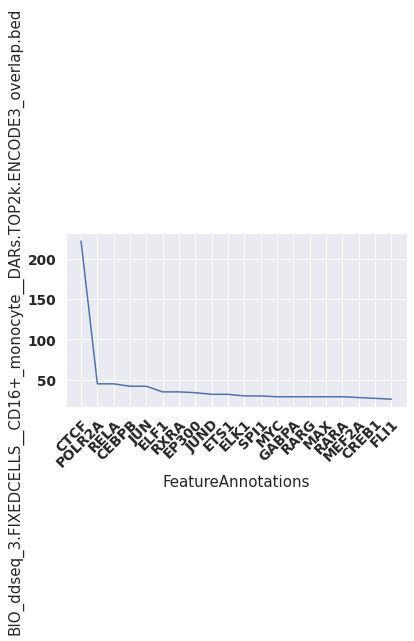

BIO_ddseq_3.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


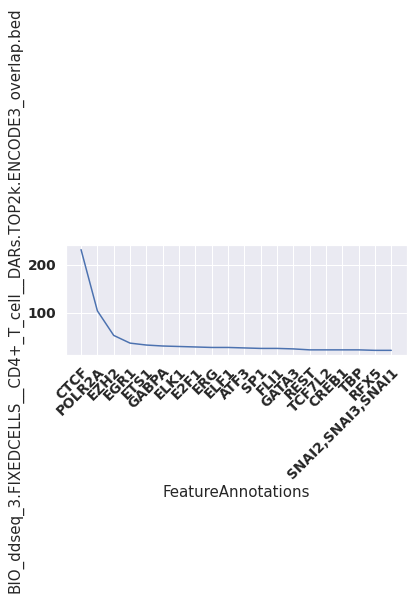

BIO_ddseq_3.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


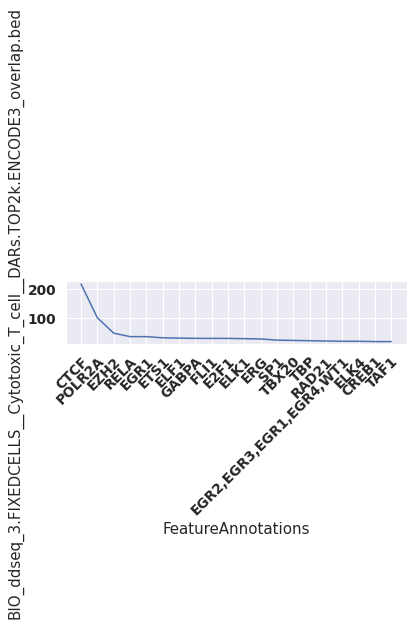

BIO_ddseq_3.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


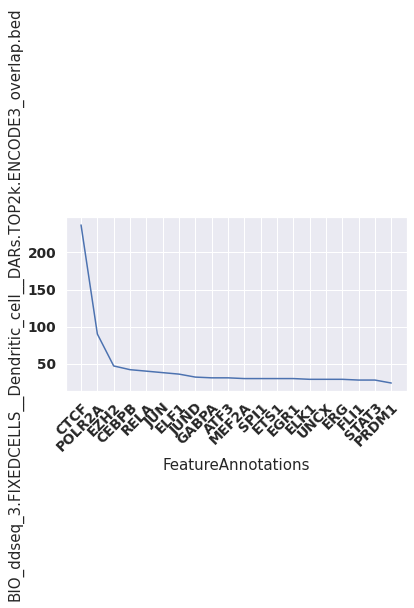

BIO_ddseq_3.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


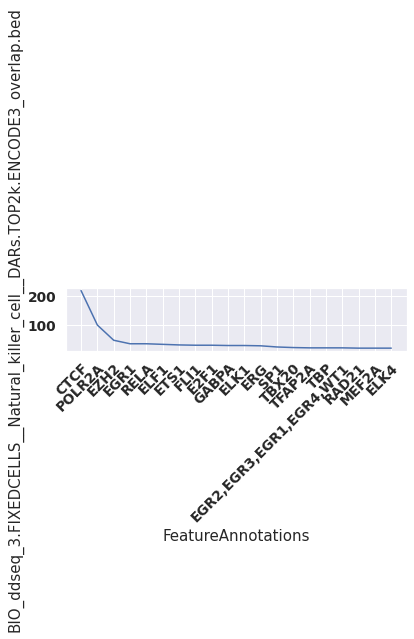

BIO_ddseq_4.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


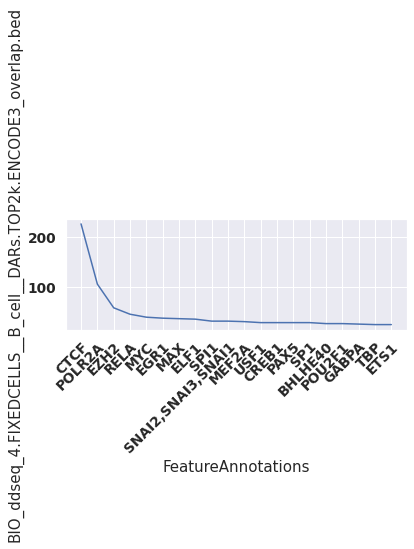

BIO_ddseq_4.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


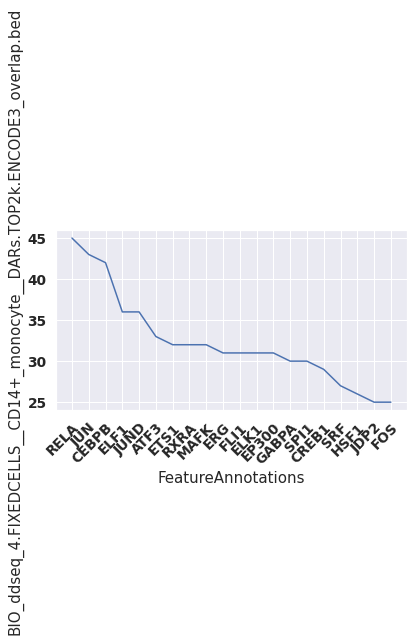

BIO_ddseq_4.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


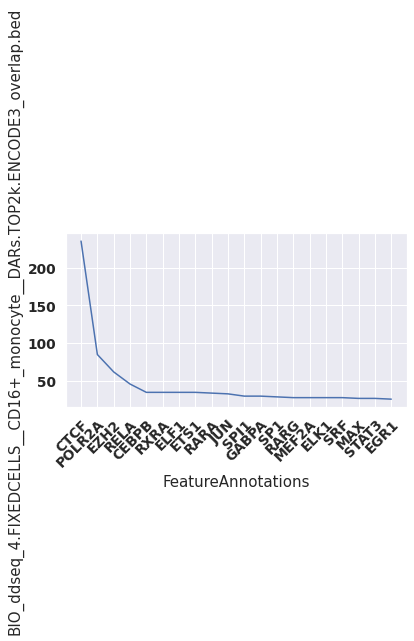

BIO_ddseq_4.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


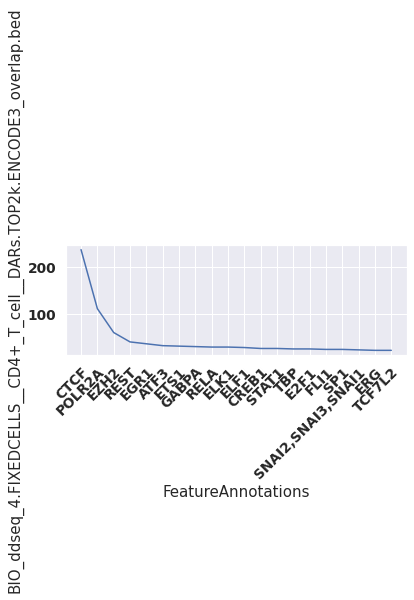

BIO_ddseq_4.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


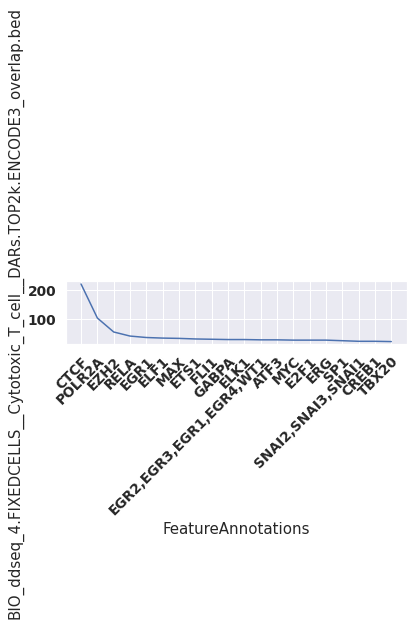

BIO_ddseq_4.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


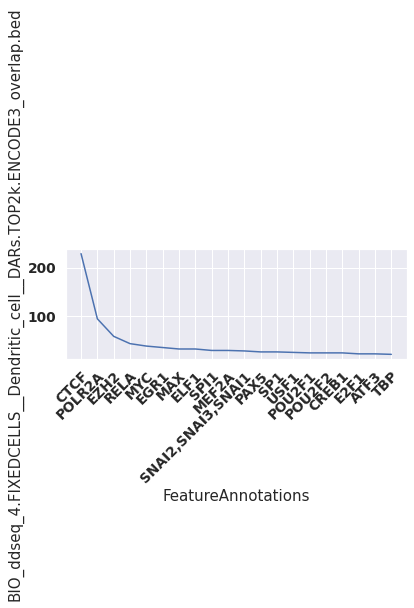

BIO_ddseq_4.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


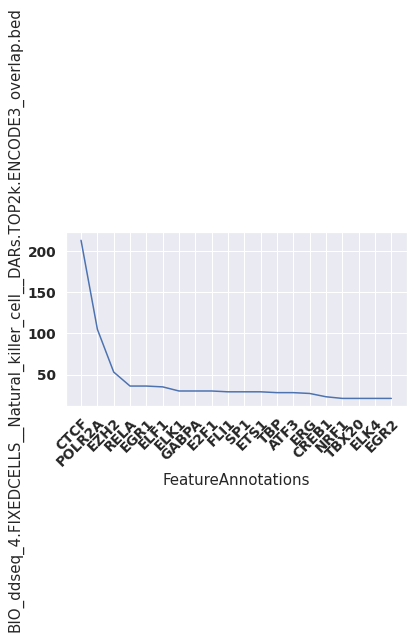

BRO_mtscatac_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


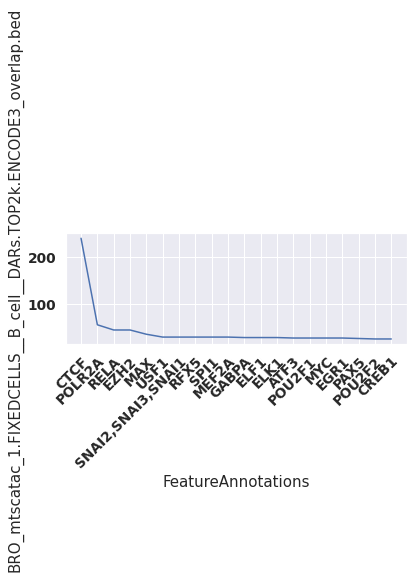

BRO_mtscatac_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


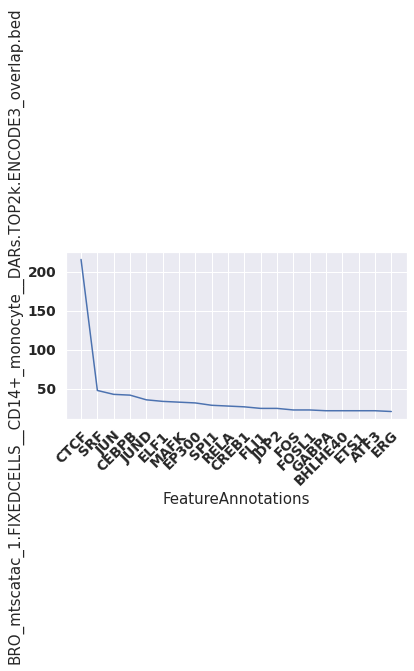

BRO_mtscatac_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


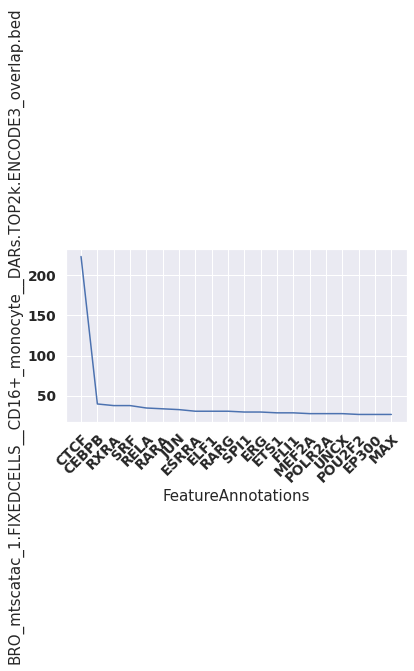

BRO_mtscatac_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


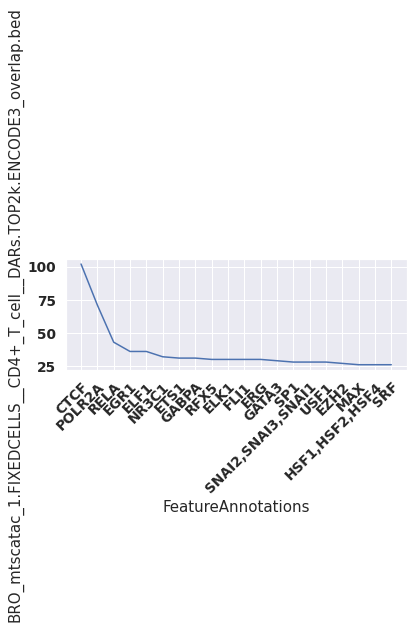

BRO_mtscatac_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


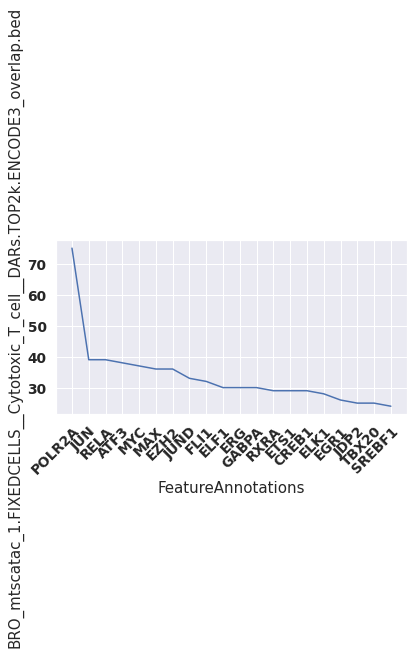

BRO_mtscatac_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


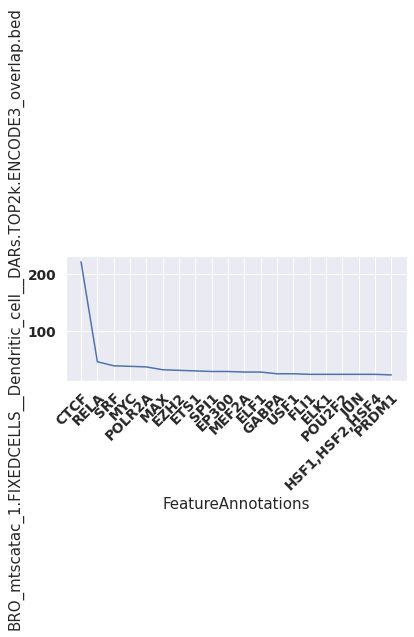

BRO_mtscatac_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


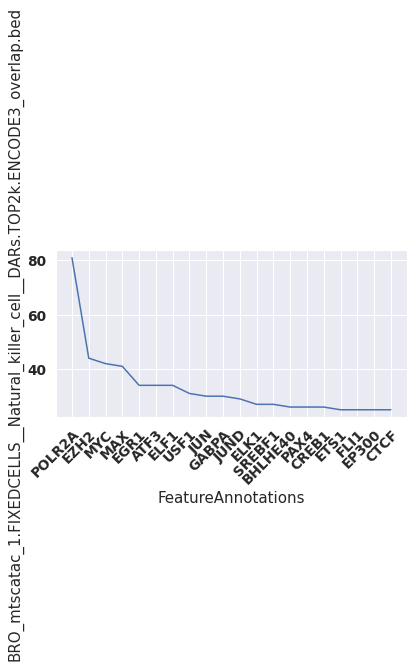

BRO_mtscatac_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


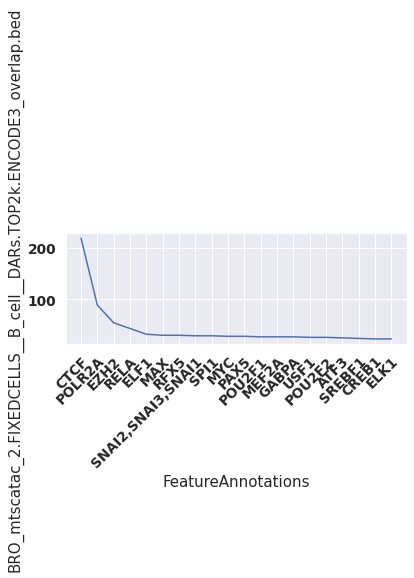

BRO_mtscatac_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


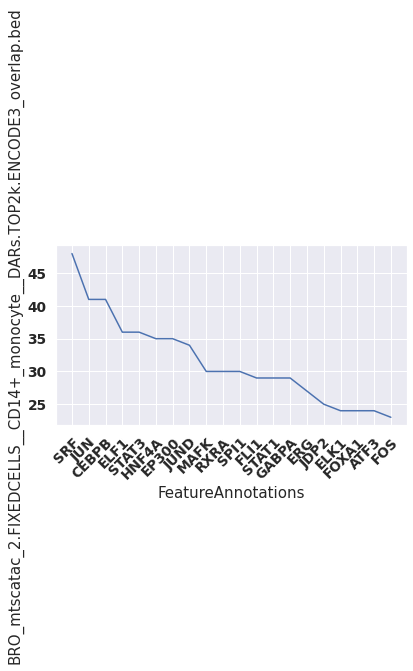

BRO_mtscatac_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


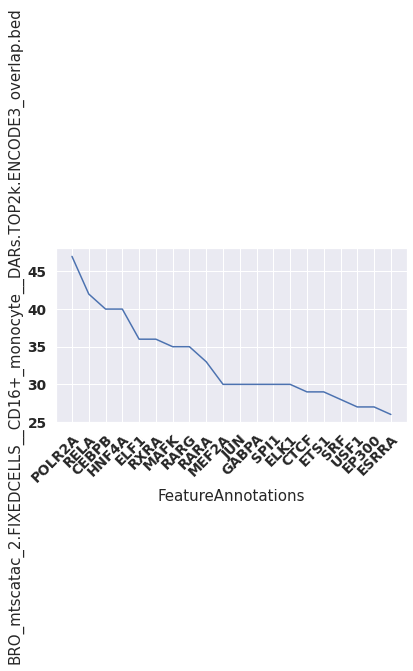

BRO_mtscatac_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


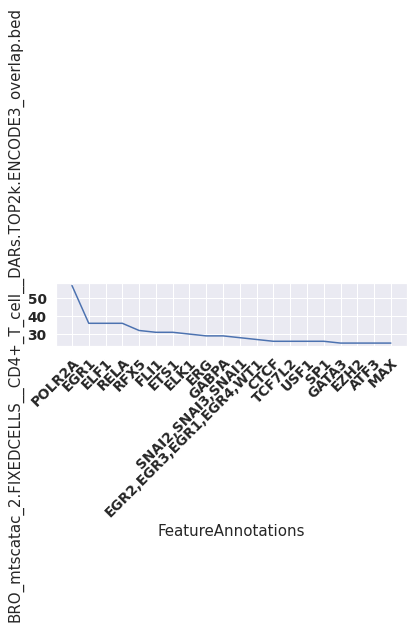

BRO_mtscatac_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


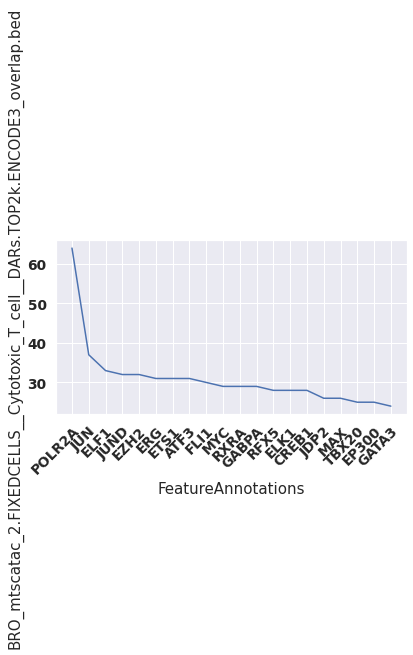

BRO_mtscatac_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


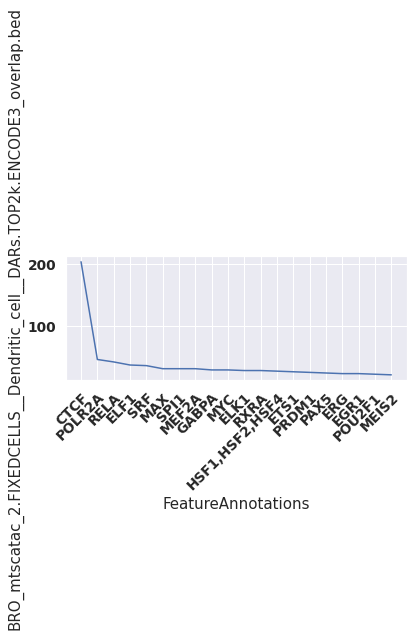

BRO_mtscatac_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


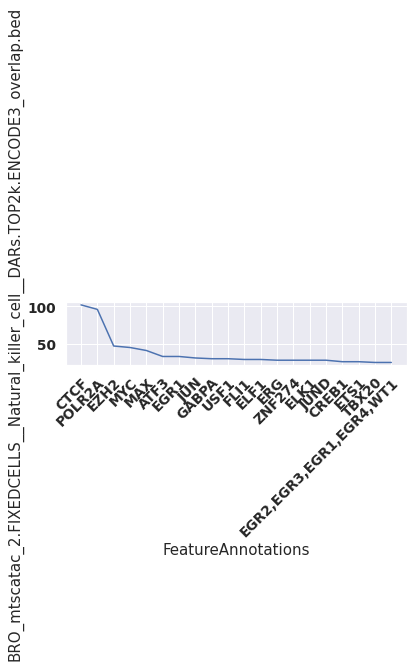

CNA_10xmultiome_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


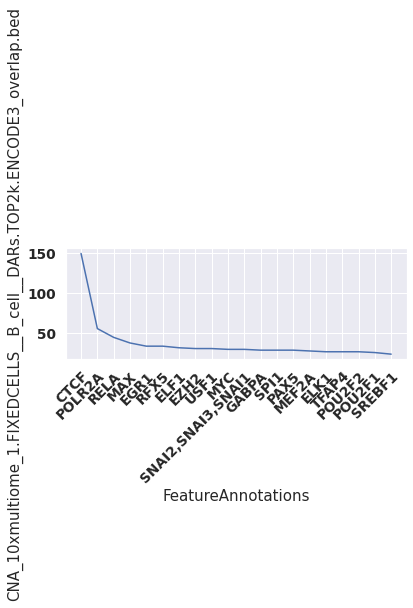

CNA_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


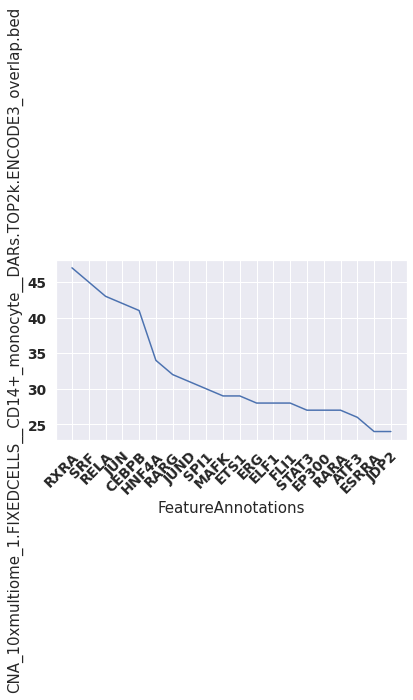

CNA_10xmultiome_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


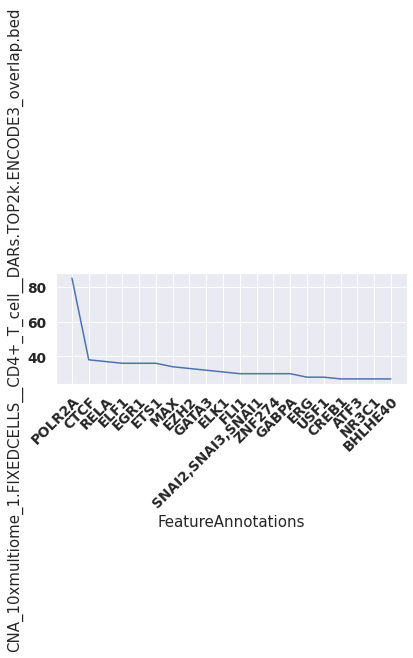

CNA_10xmultiome_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


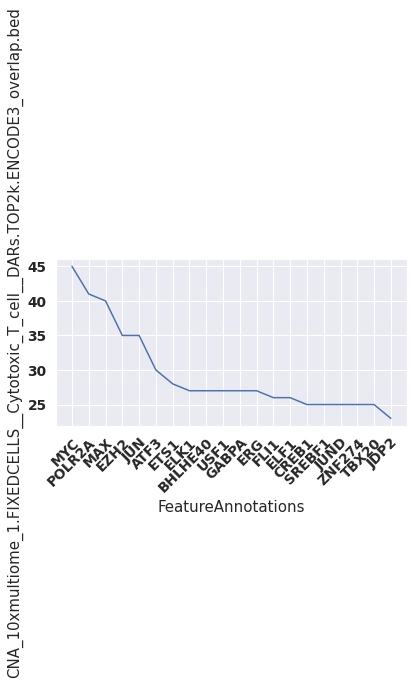

CNA_10xmultiome_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


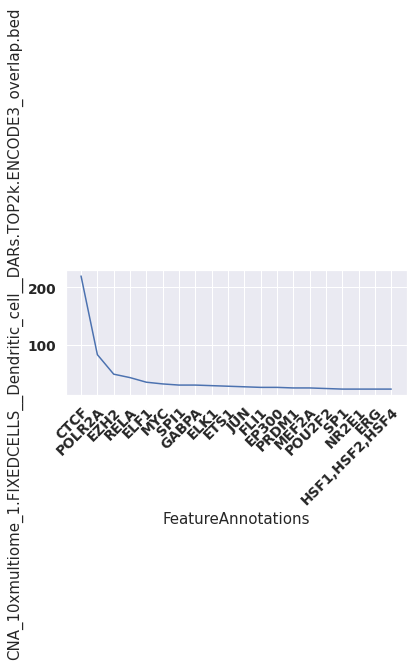

CNA_10xmultiome_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


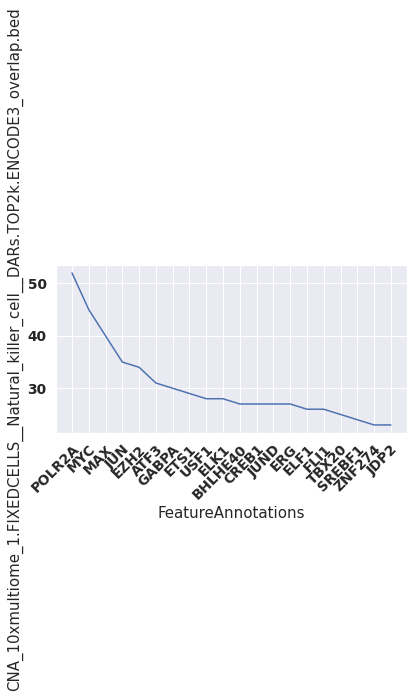

CNA_10xmultiome_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


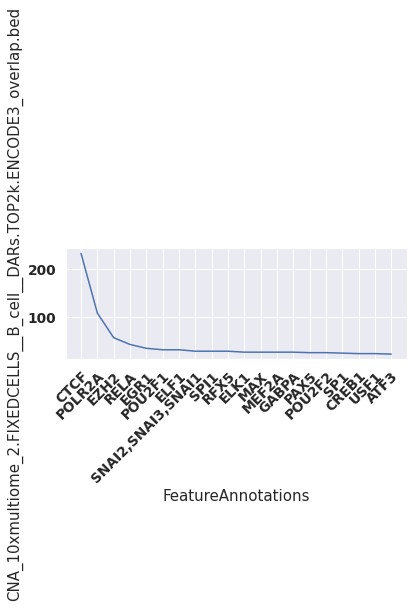

CNA_10xmultiome_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


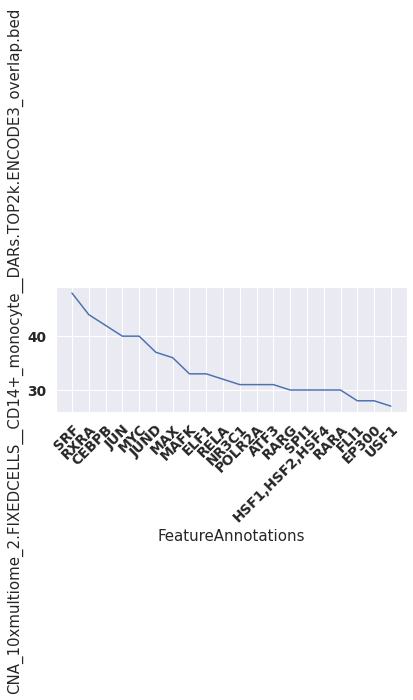

CNA_10xmultiome_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


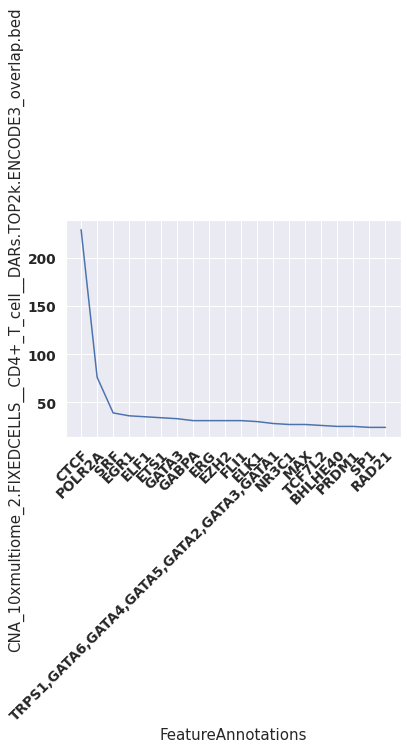

CNA_10xmultiome_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


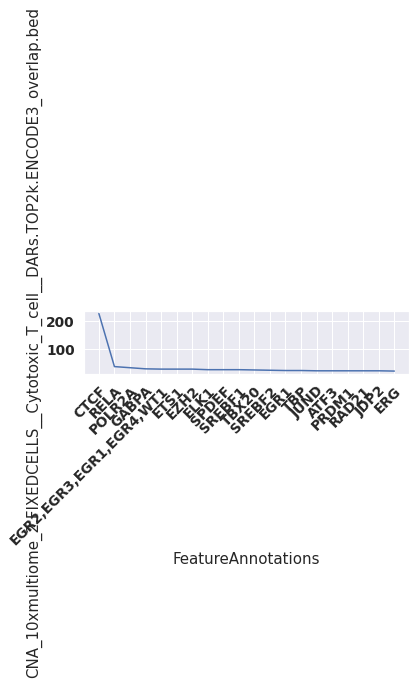

CNA_10xmultiome_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


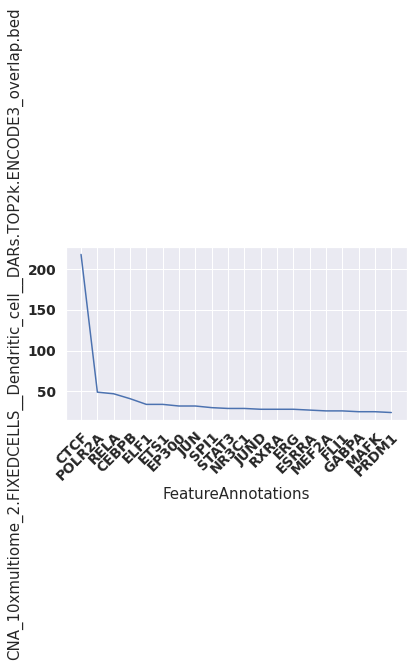

CNA_10xmultiome_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


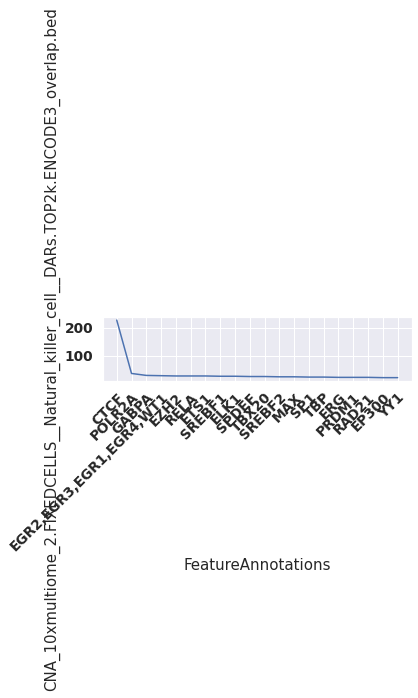

CNA_10xv11_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


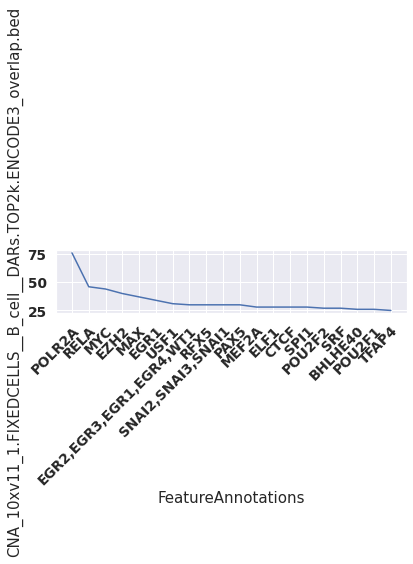

CNA_10xv11_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


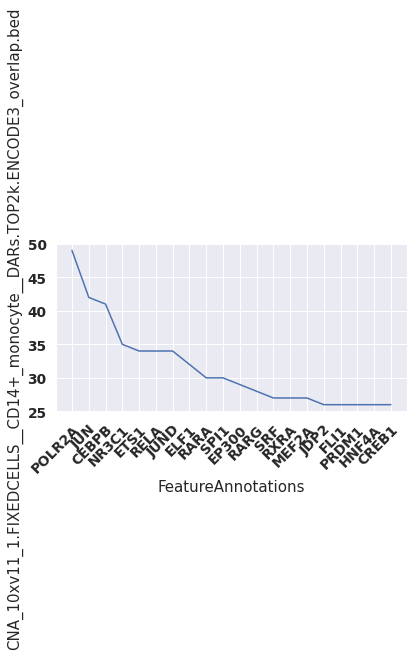

CNA_10xv11_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


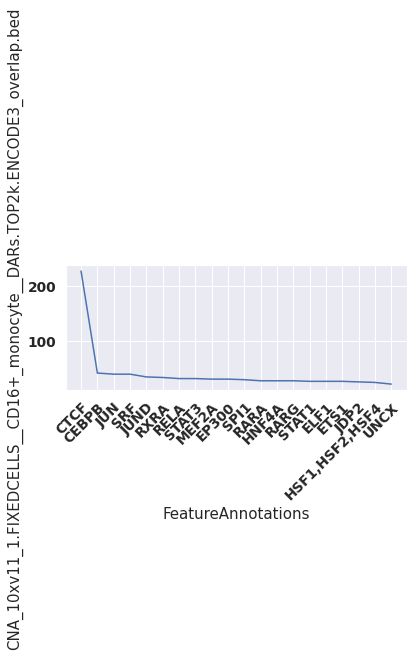

CNA_10xv11_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


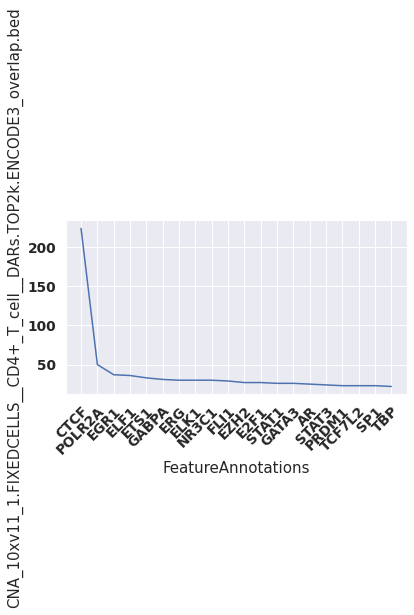

CNA_10xv11_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


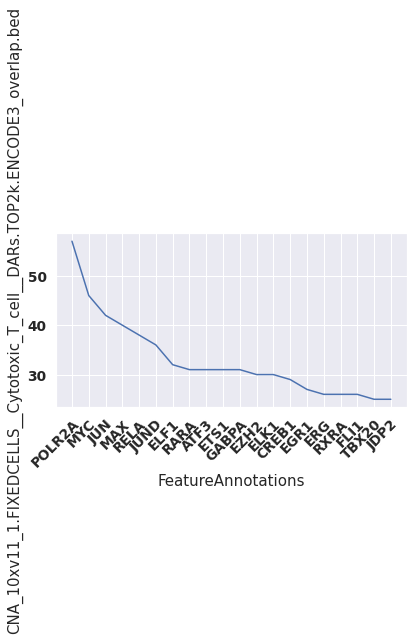

CNA_10xv11_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


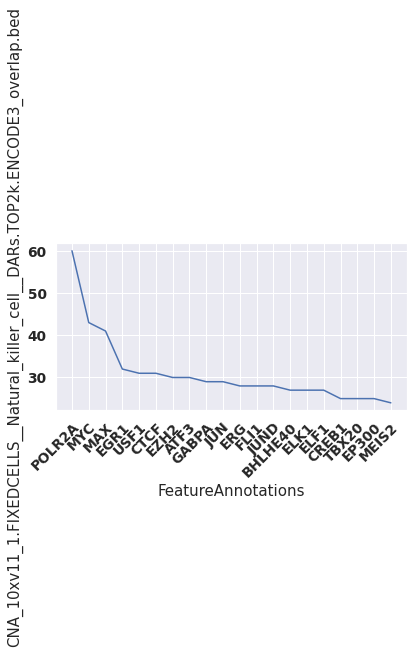

CNA_10xv11_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


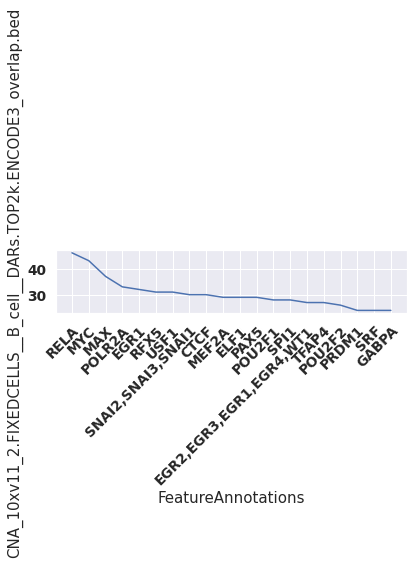

CNA_10xv11_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


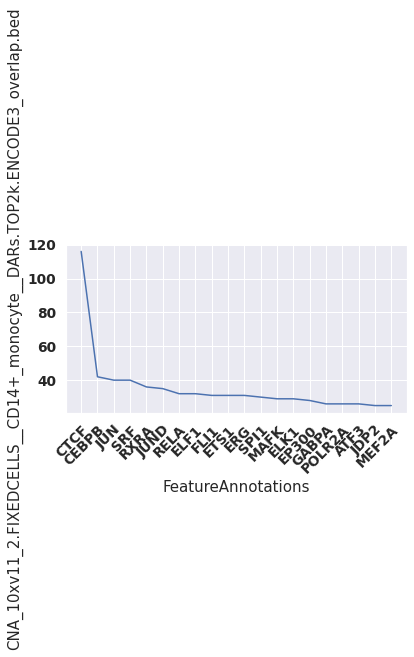

CNA_10xv11_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


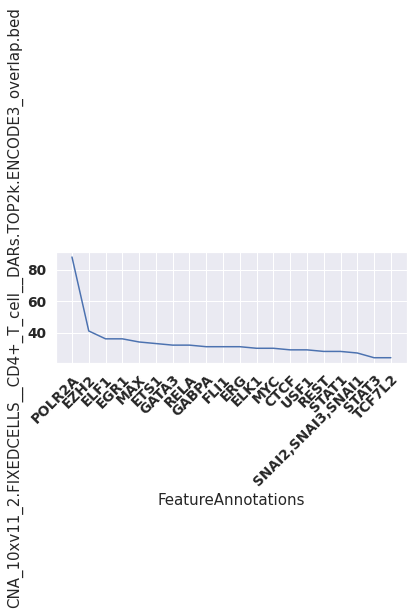

CNA_10xv11_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


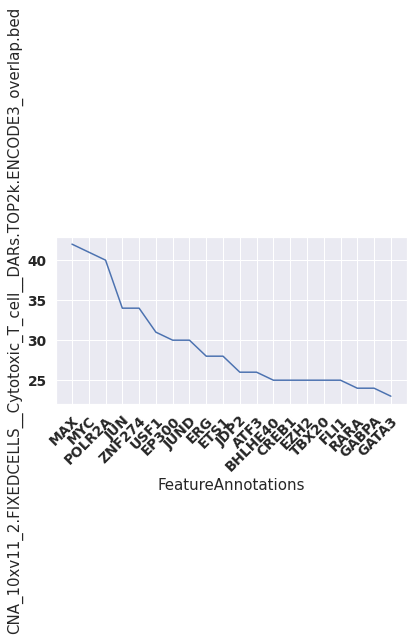

CNA_10xv11_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


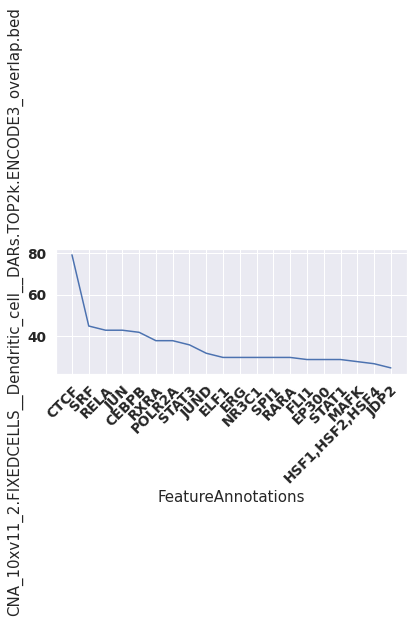

CNA_10xv11_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


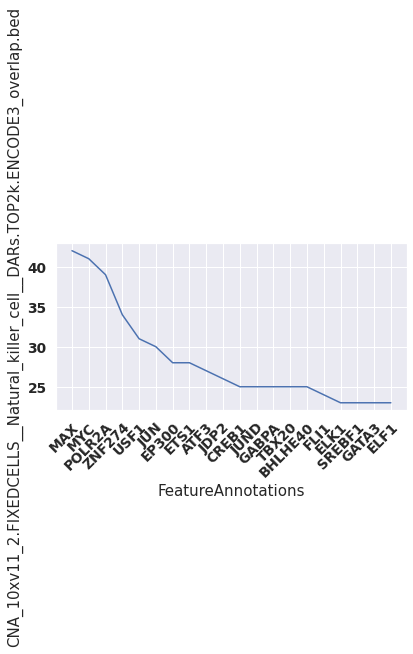

CNA_10xv11_3.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


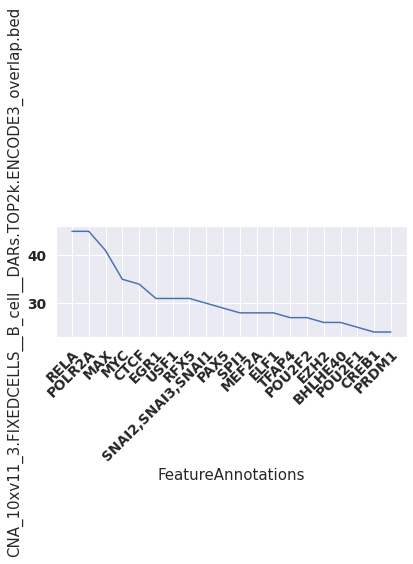

CNA_10xv11_3.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


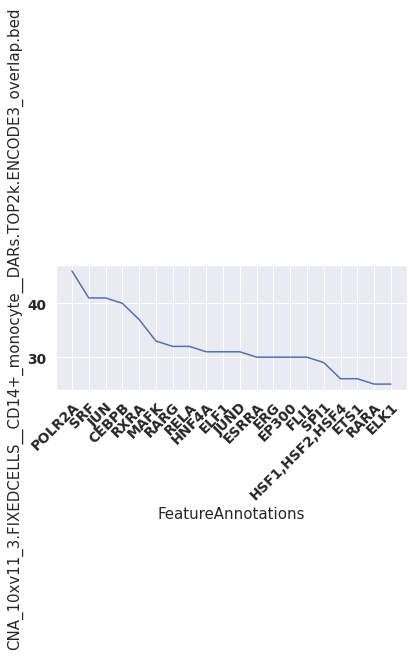

CNA_10xv11_3.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


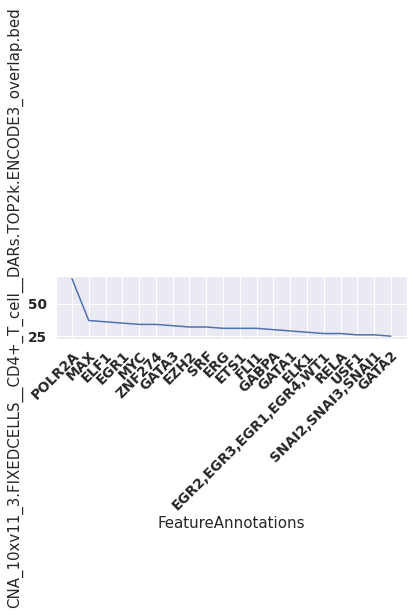

CNA_10xv11_3.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


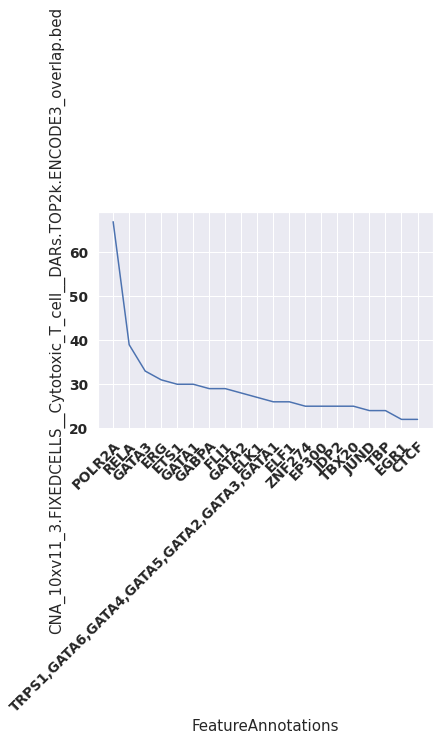

CNA_10xv11_3.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


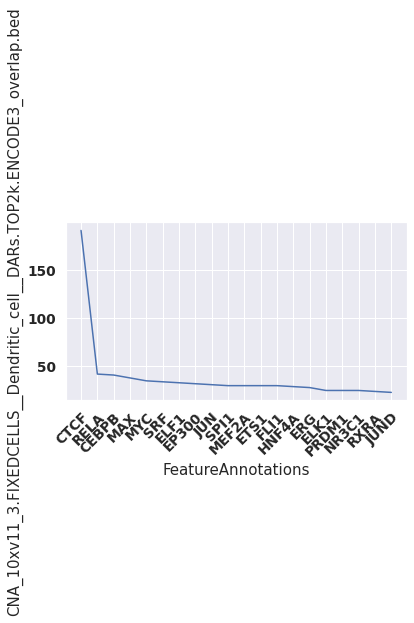

CNA_10xv11_3.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


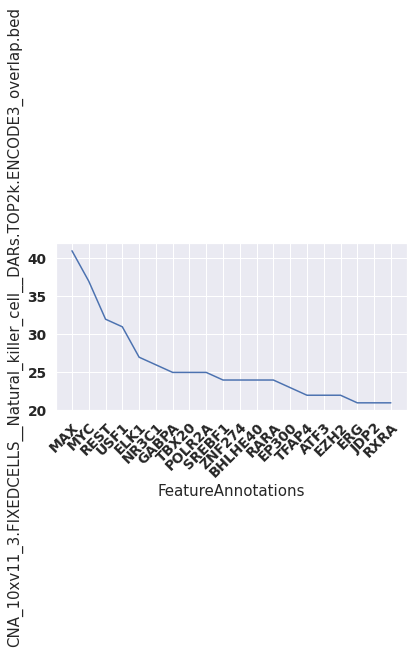

CNA_10xv11_4.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


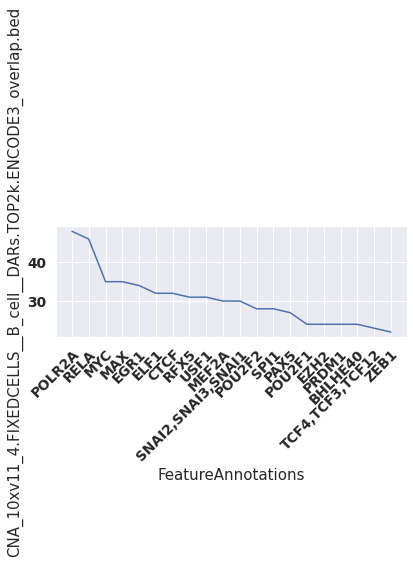

CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


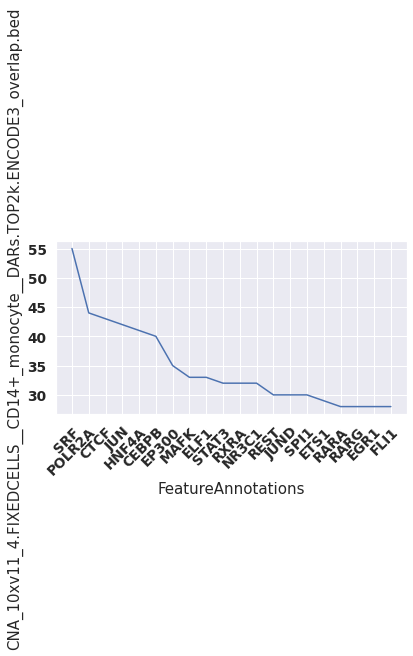

CNA_10xv11_4.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


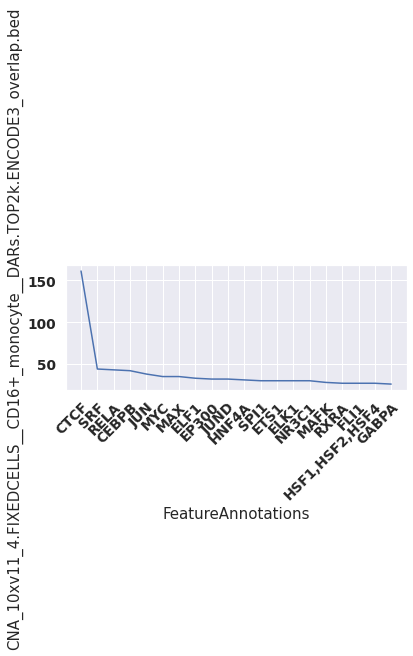

CNA_10xv11_4.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


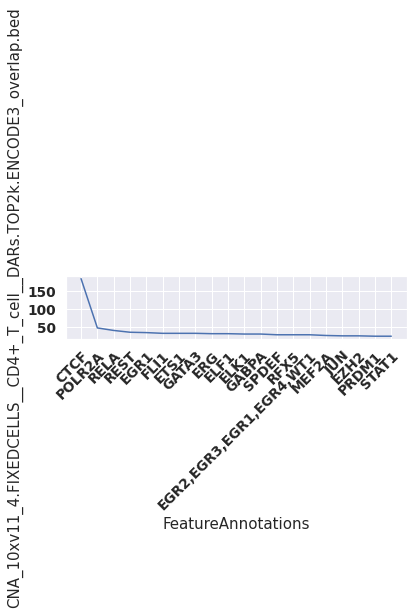

CNA_10xv11_4.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


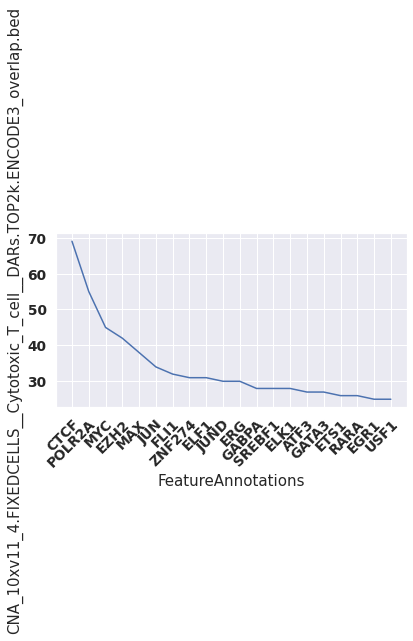

CNA_10xv11_4.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


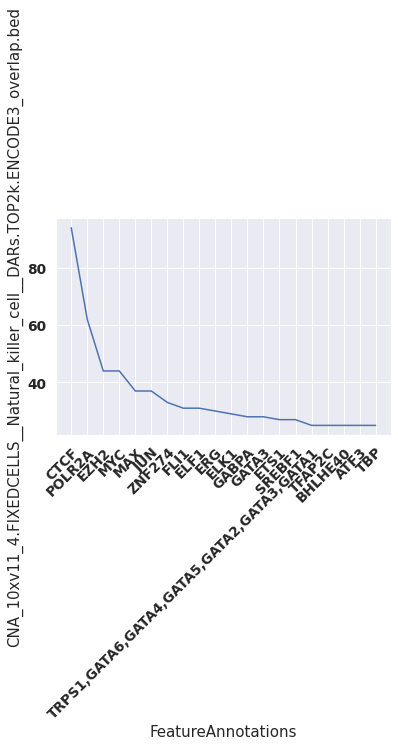

CNA_10xv11_5.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


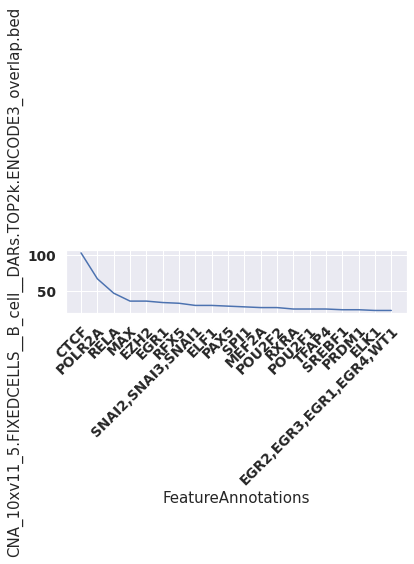

CNA_10xv11_5.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


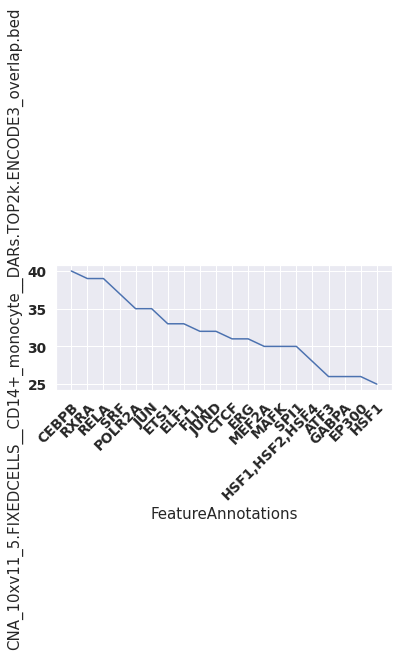

CNA_10xv11_5.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


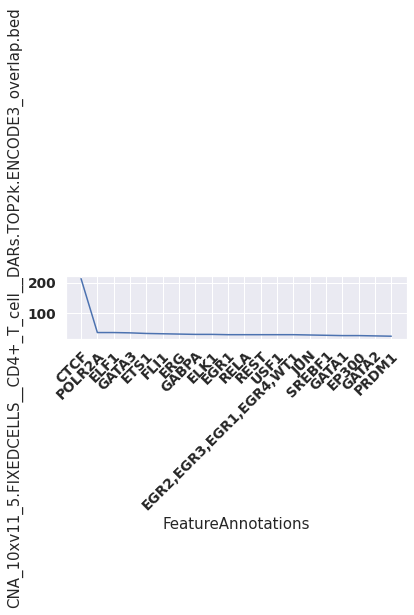

CNA_10xv11_5.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


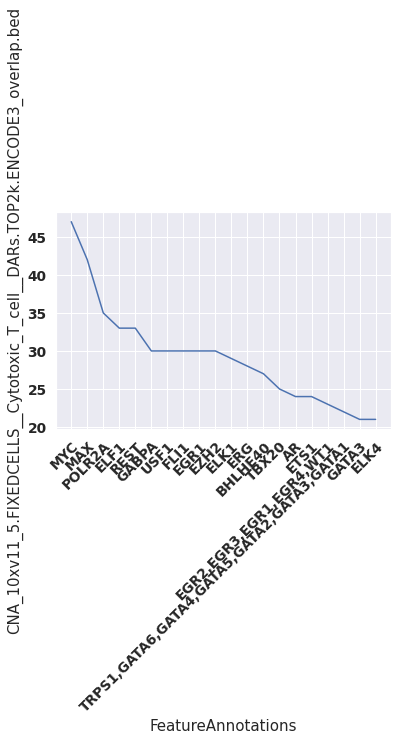

CNA_10xv11_5.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


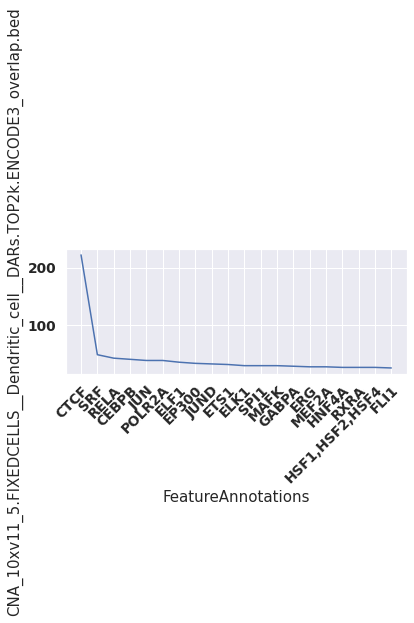

CNA_10xv11_5.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


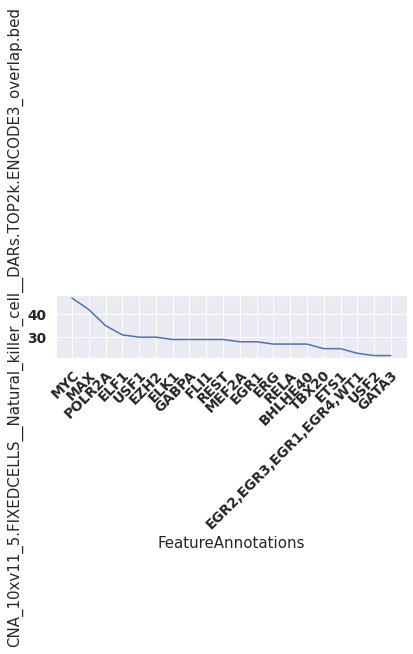

CNA_10xv2_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


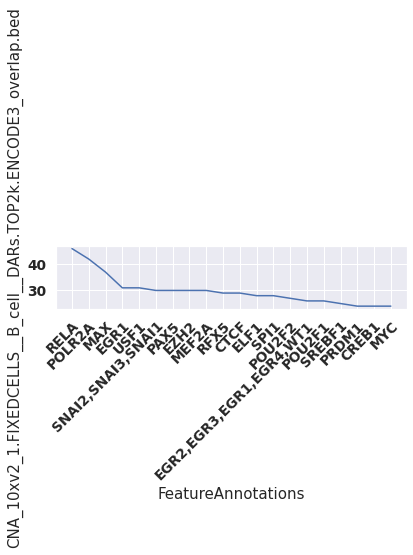

CNA_10xv2_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


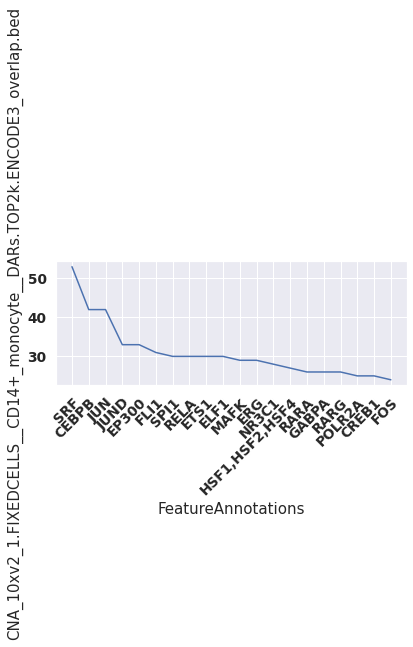

CNA_10xv2_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


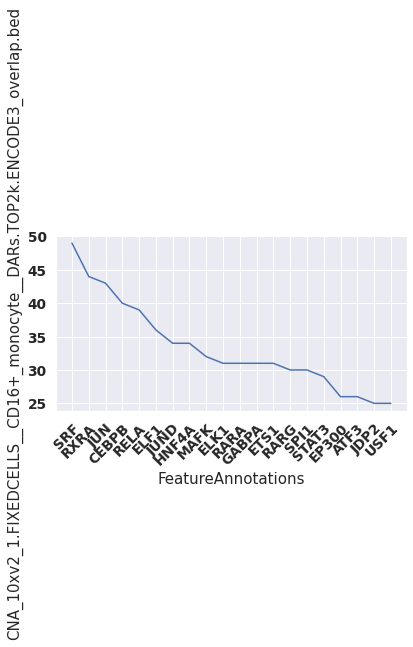

CNA_10xv2_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


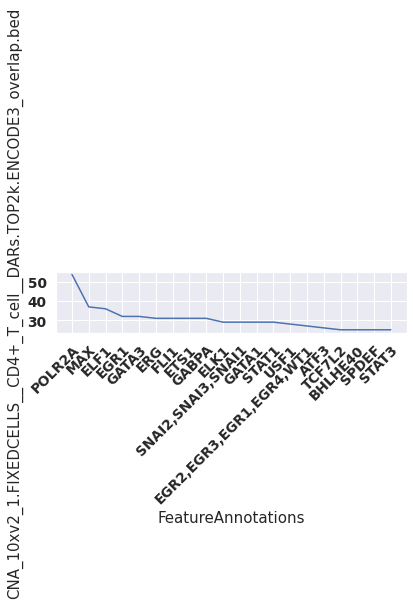

CNA_10xv2_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


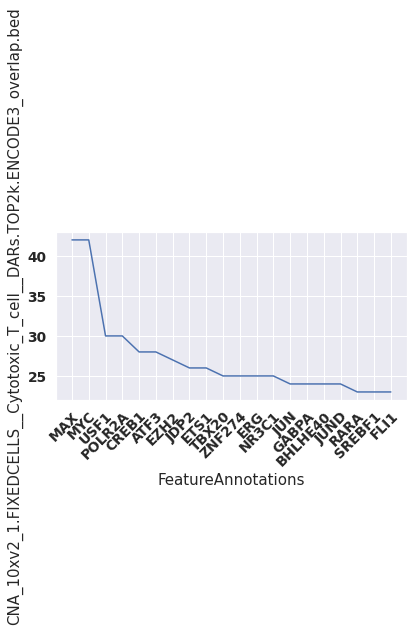

CNA_10xv2_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


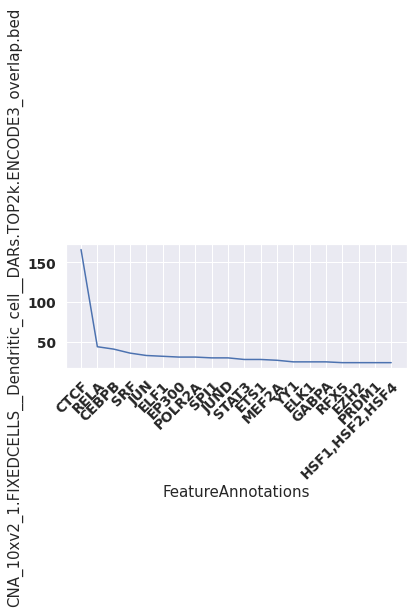

CNA_10xv2_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


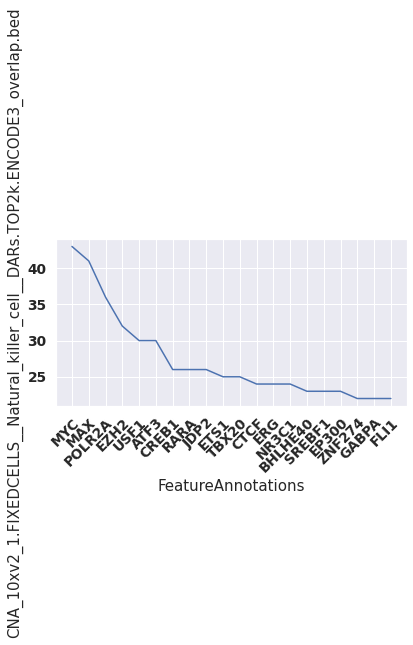

CNA_10xv2_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


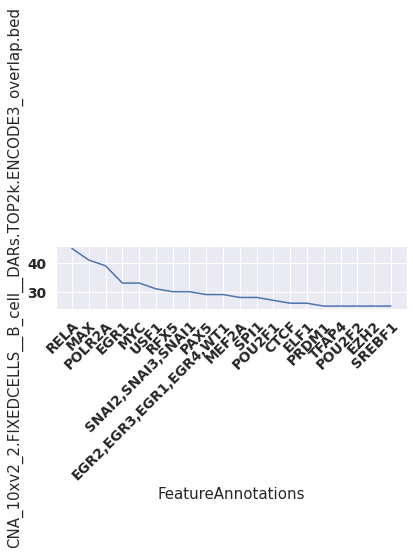

CNA_10xv2_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


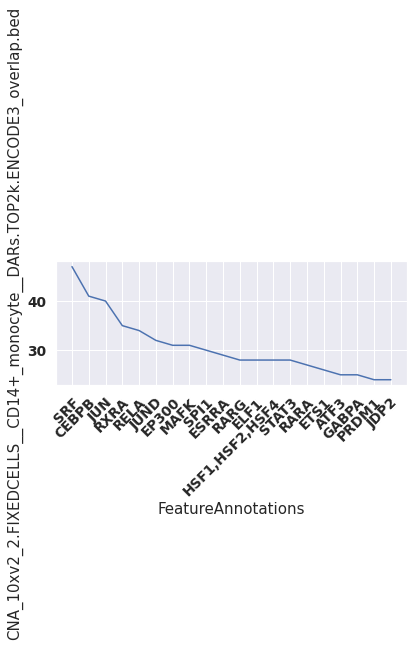

CNA_10xv2_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


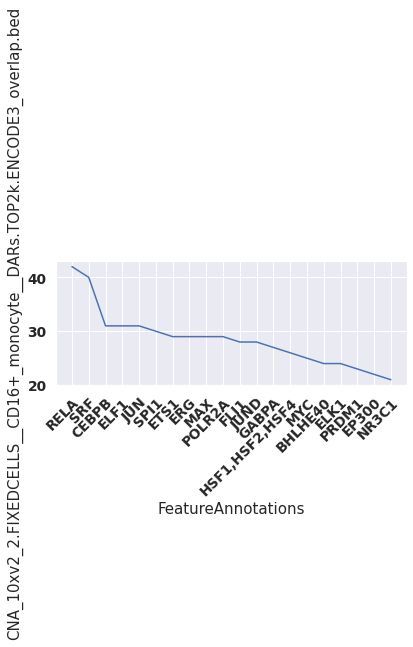

CNA_10xv2_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


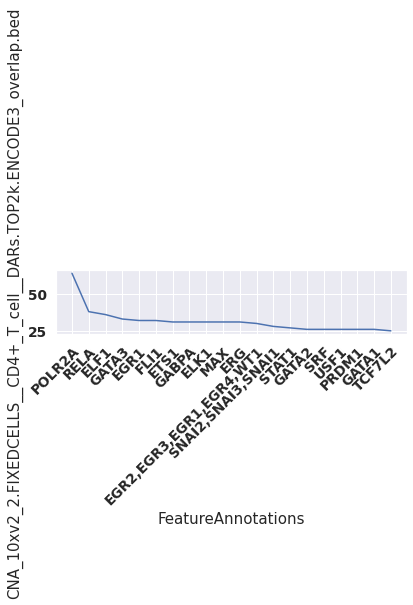

CNA_10xv2_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


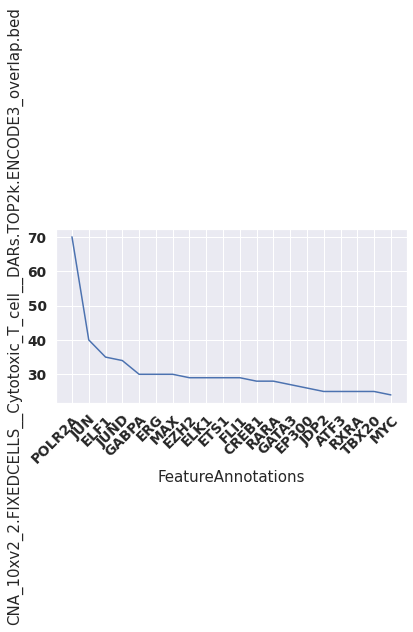

CNA_10xv2_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


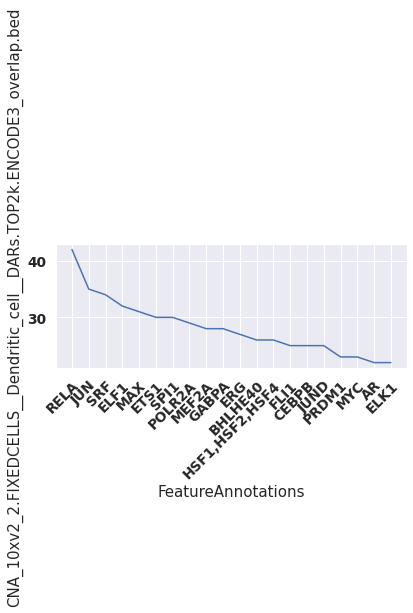

CNA_10xv2_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


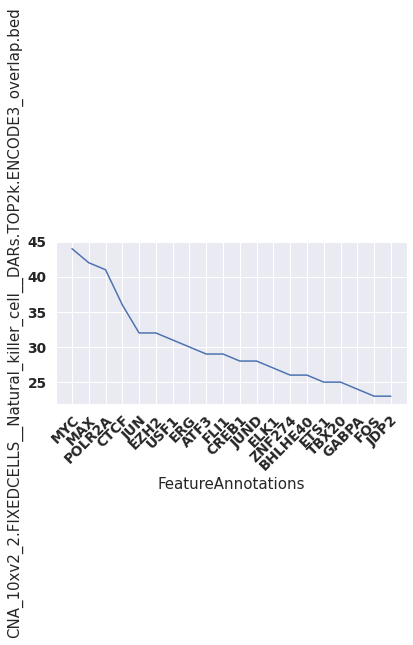

CNA_hydrop_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


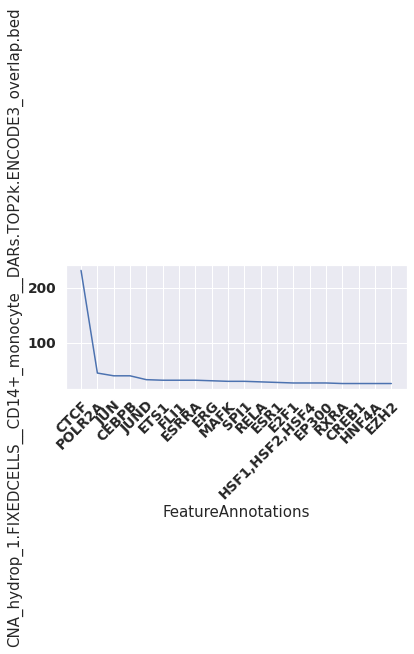

CNA_hydrop_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


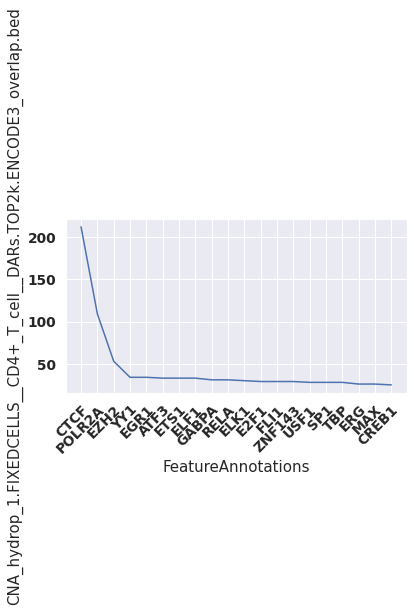

CNA_hydrop_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


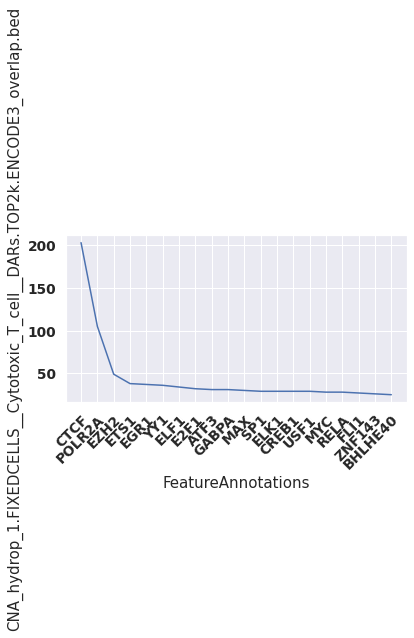

CNA_hydrop_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


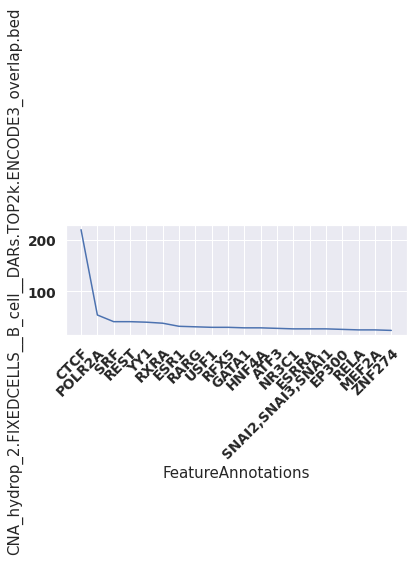

CNA_hydrop_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


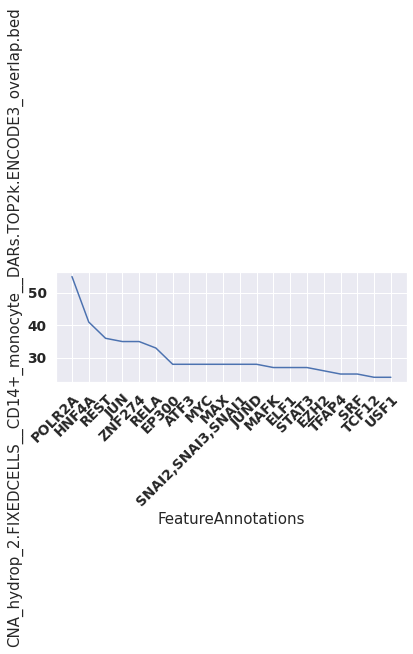

CNA_hydrop_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


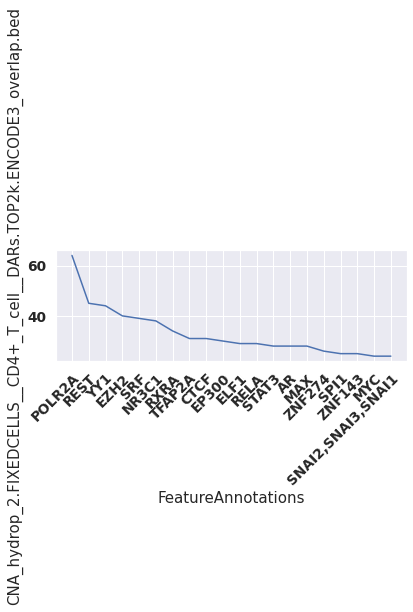

CNA_hydrop_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


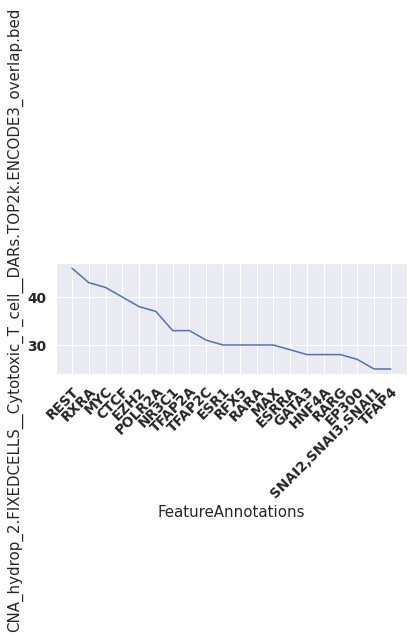

CNA_hydrop_3.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


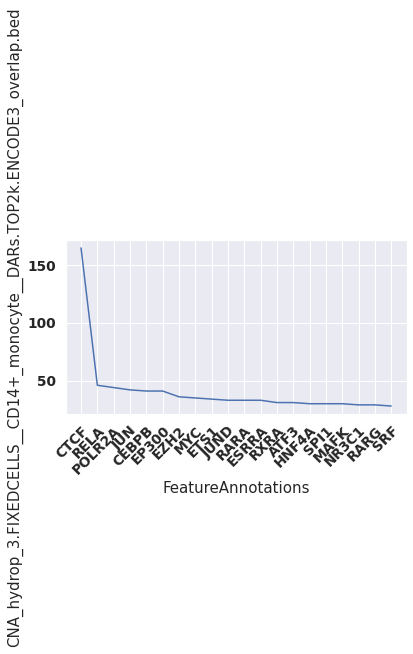

CNA_hydrop_3.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


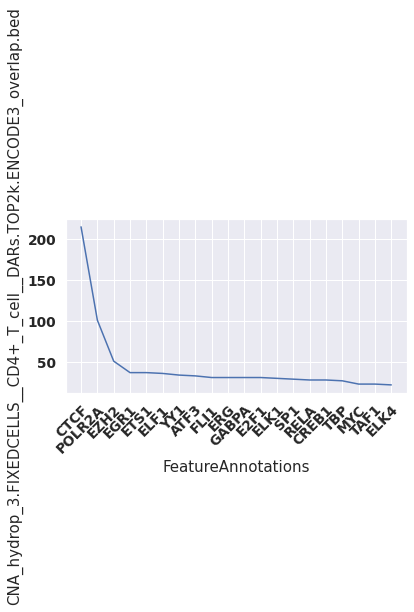

CNA_hydrop_3.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


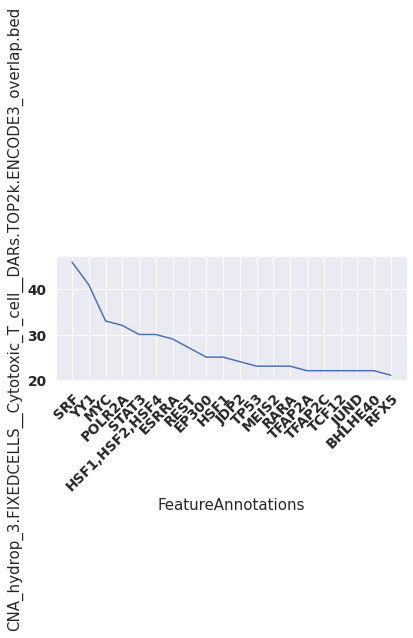

CNA_mtscatac_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


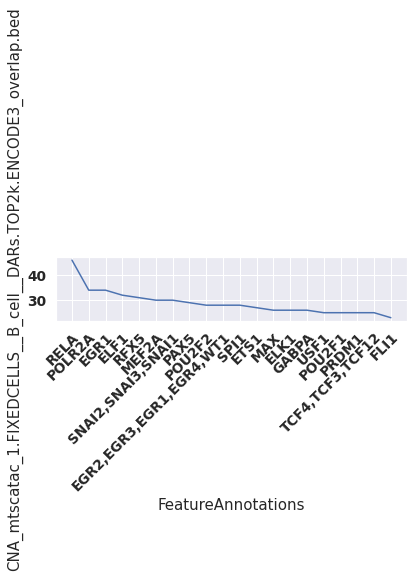

CNA_mtscatac_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


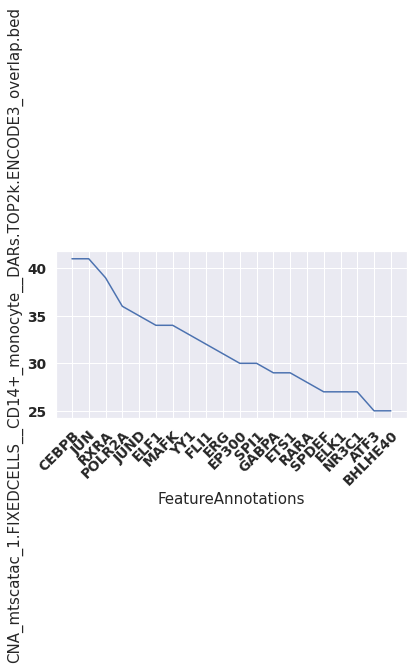

CNA_mtscatac_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


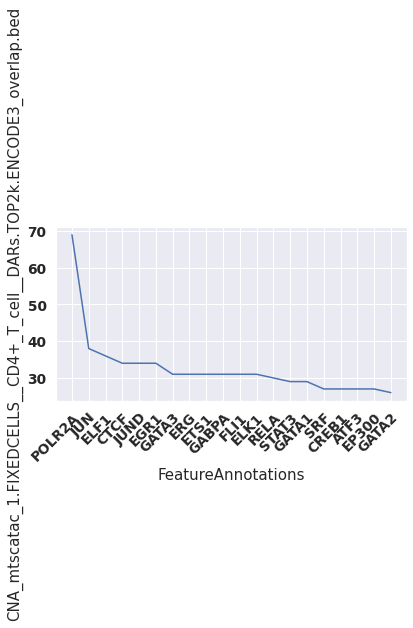

CNA_mtscatac_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


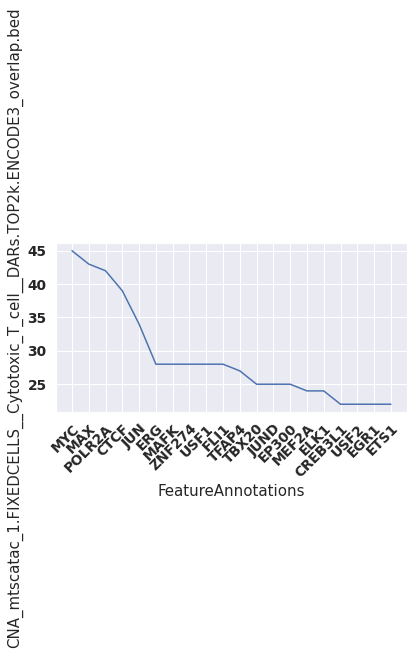

CNA_mtscatac_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


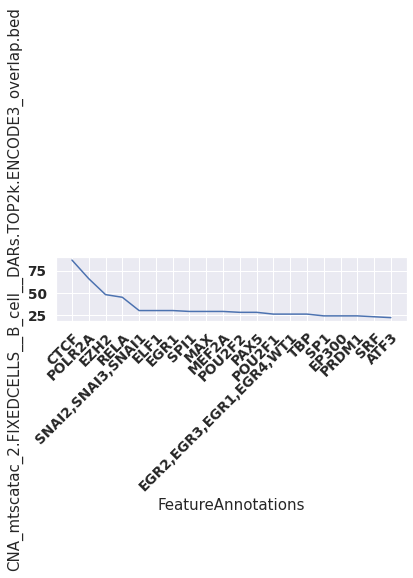

CNA_mtscatac_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


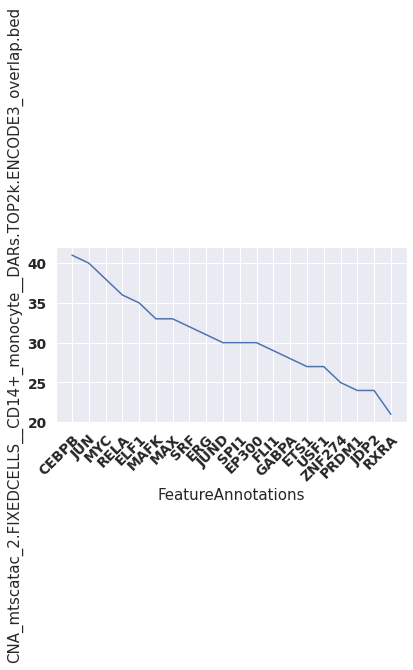

CNA_mtscatac_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


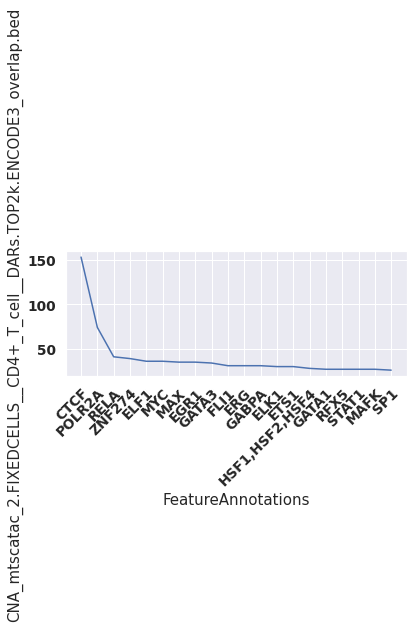

CNA_mtscatac_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


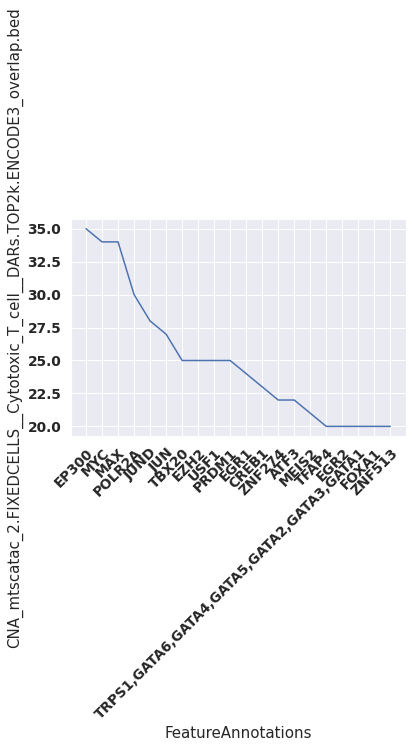

CNA_mtscatac_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


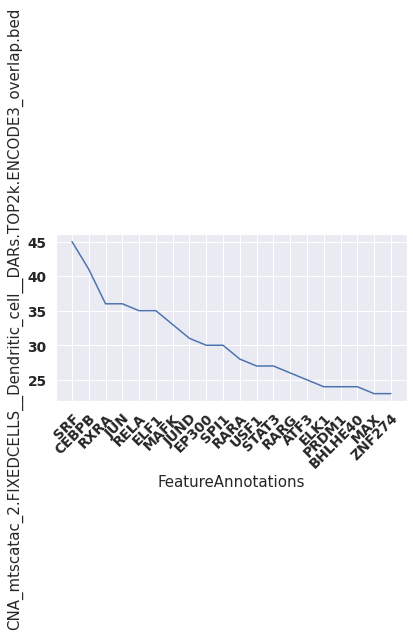

CNA_mtscatac_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


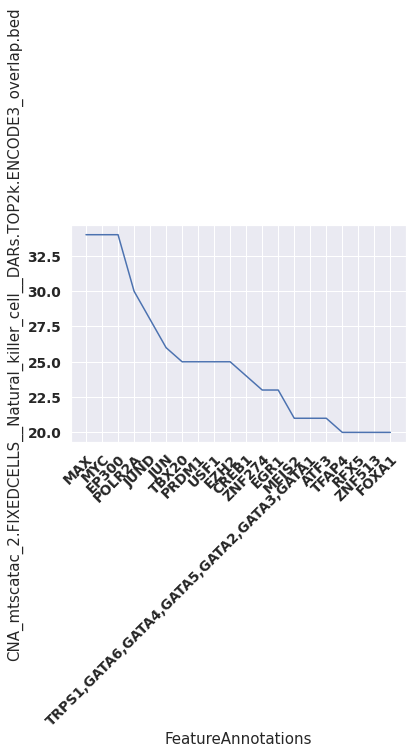

EPF_hydrop_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


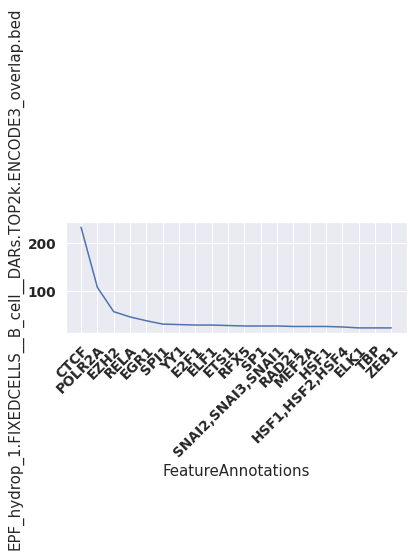

EPF_hydrop_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


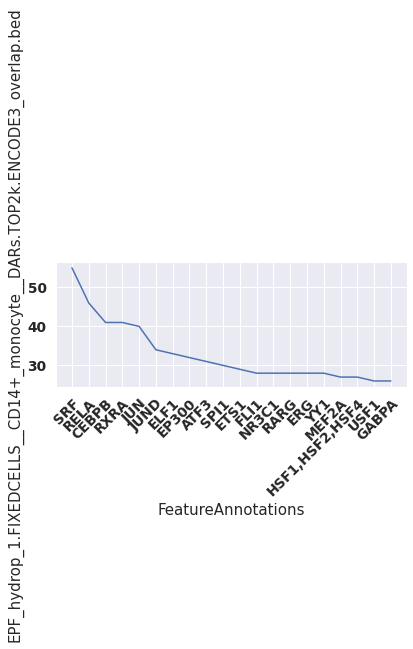

EPF_hydrop_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


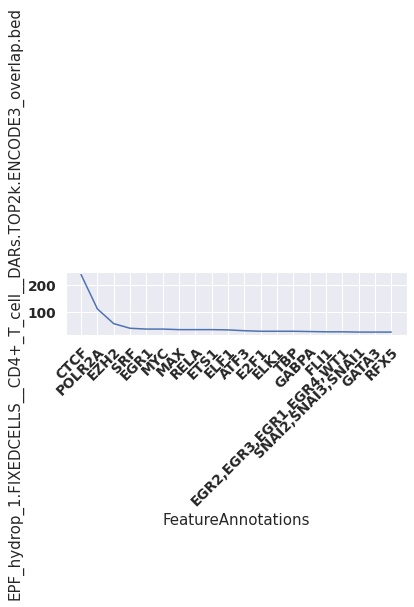

EPF_hydrop_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


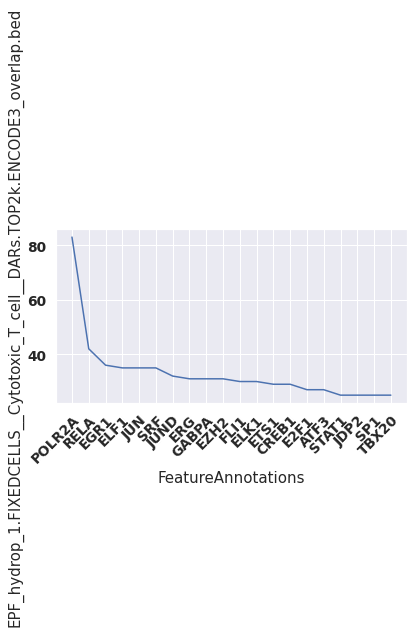

EPF_hydrop_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


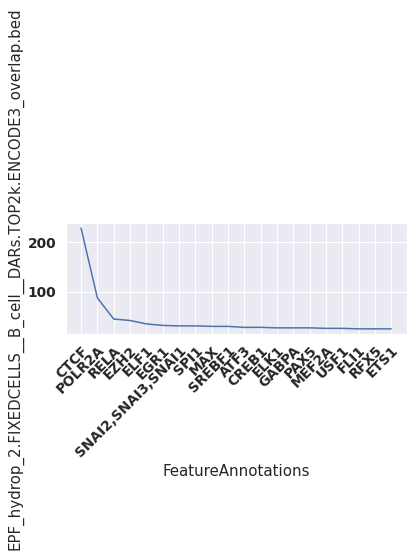

EPF_hydrop_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


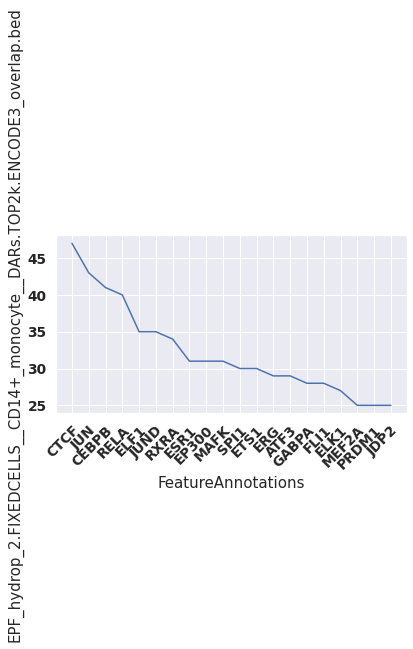

EPF_hydrop_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


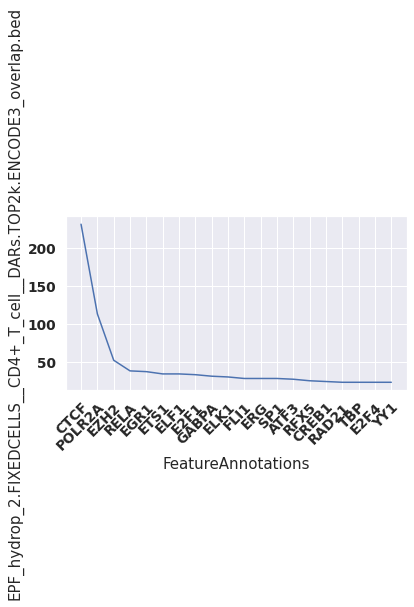

EPF_hydrop_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


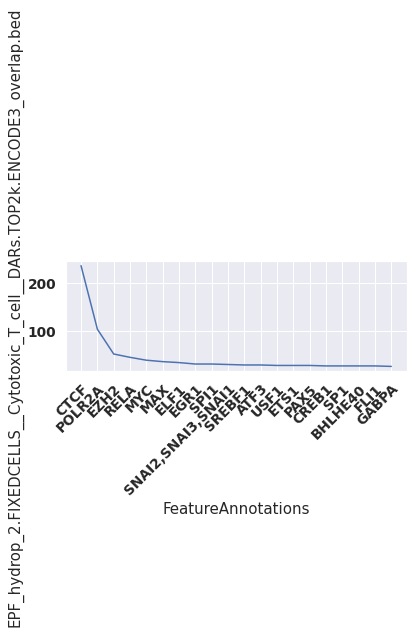

EPF_hydrop_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


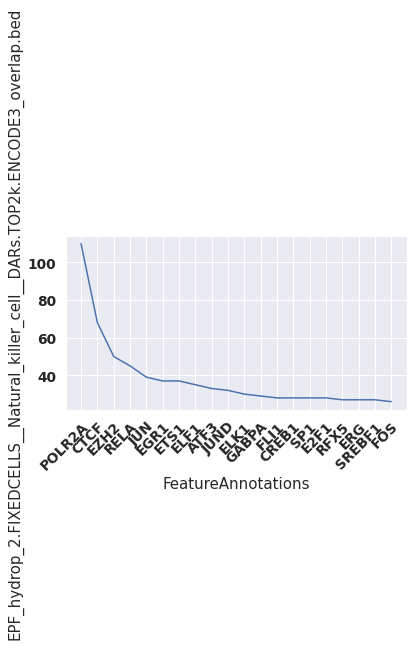

EPF_hydrop_3.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


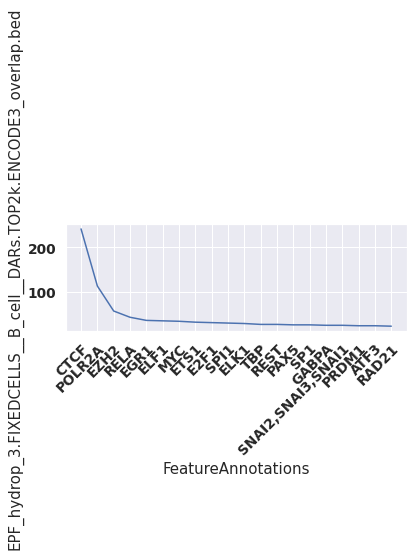

EPF_hydrop_3.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


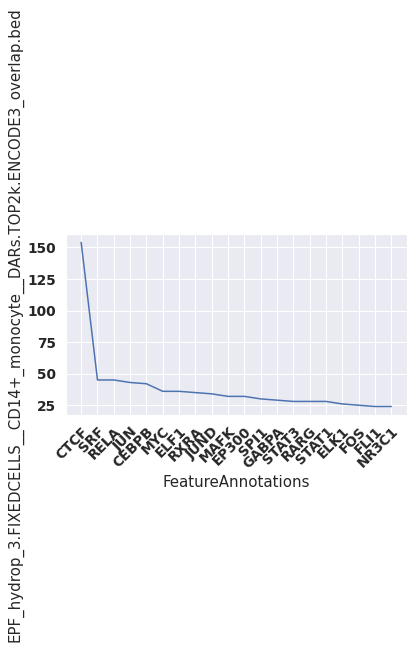

EPF_hydrop_3.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


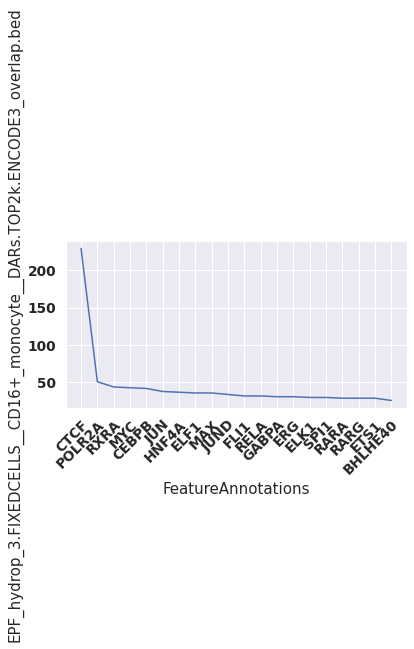

EPF_hydrop_3.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


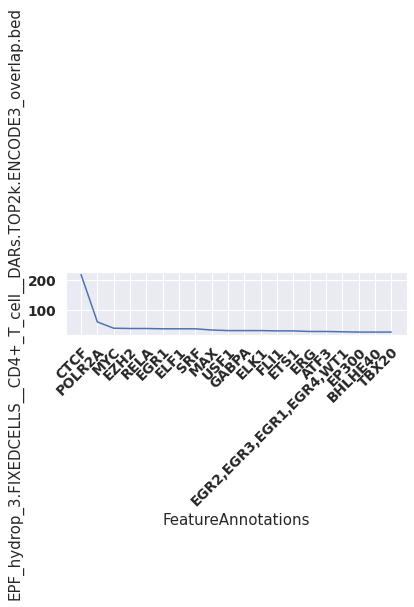

EPF_hydrop_3.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


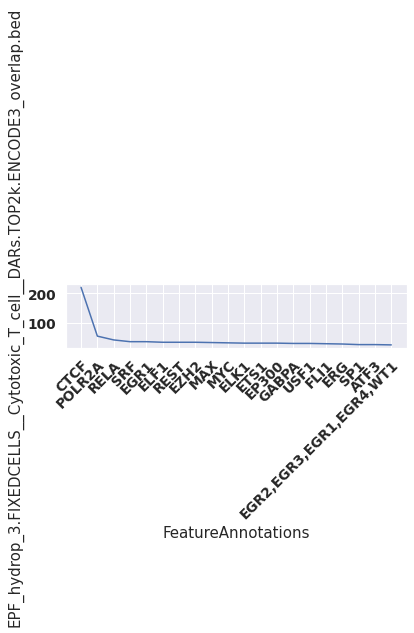

EPF_hydrop_3.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


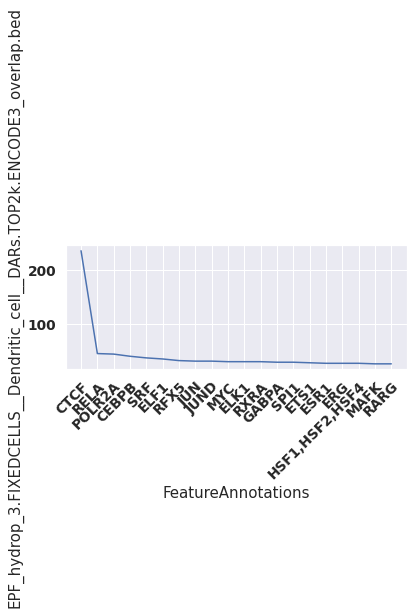

EPF_hydrop_4.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


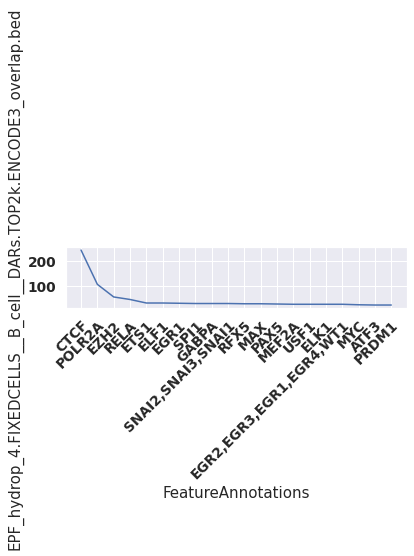

EPF_hydrop_4.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


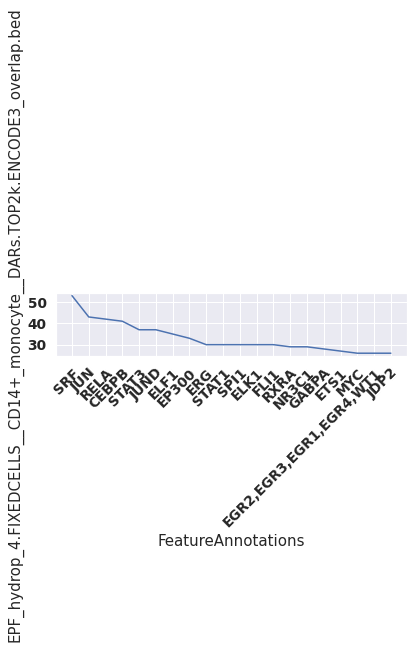

EPF_hydrop_4.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


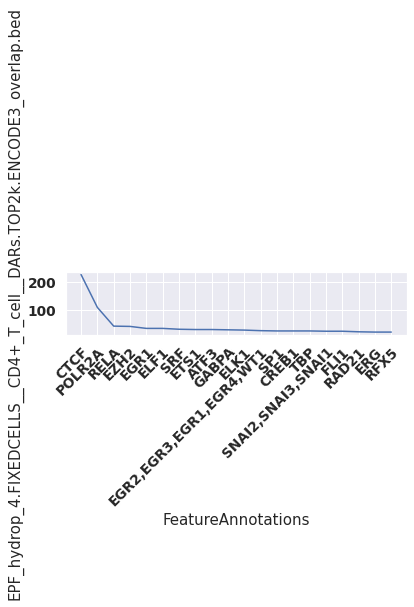

EPF_hydrop_4.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


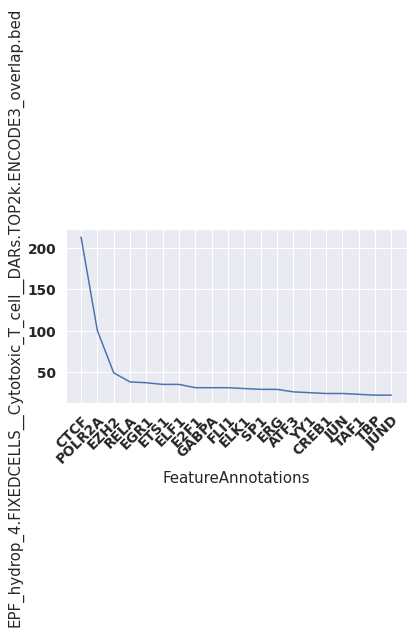

HAR_ddseq_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


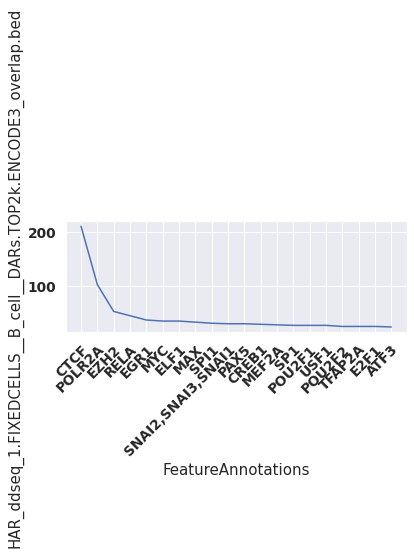

HAR_ddseq_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


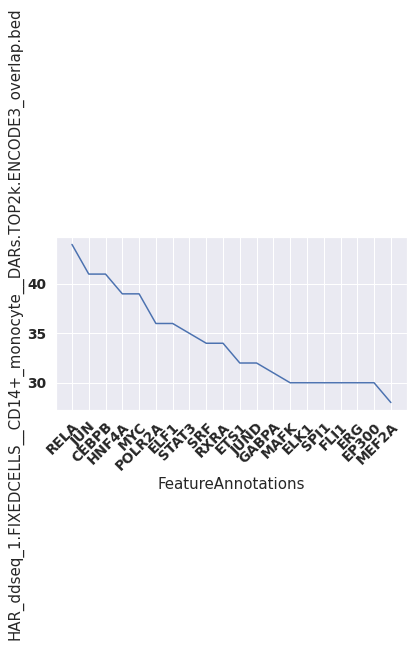

HAR_ddseq_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


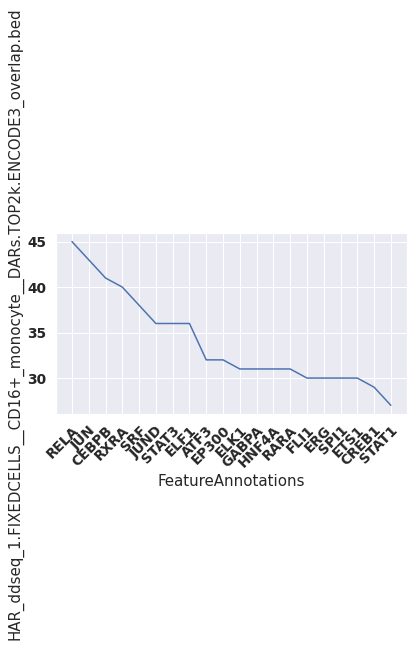

HAR_ddseq_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


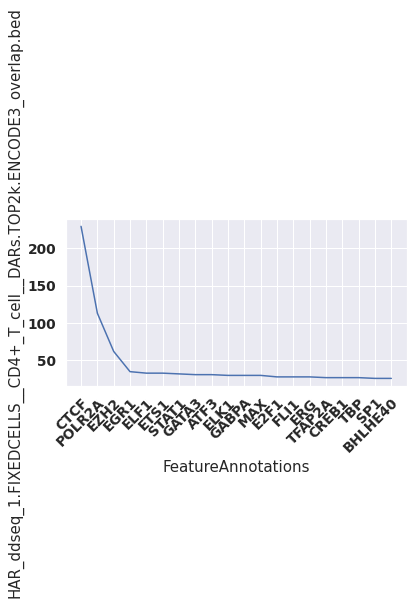

HAR_ddseq_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


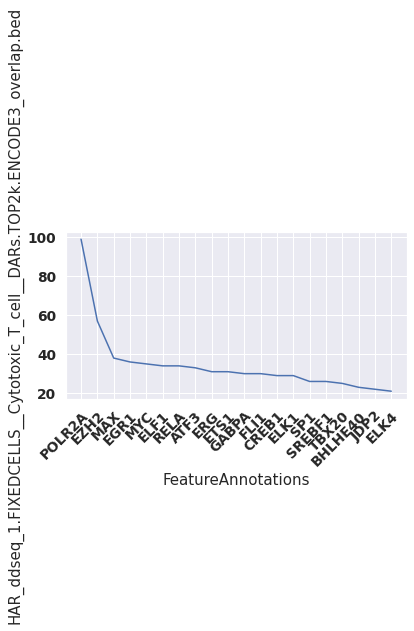

HAR_ddseq_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


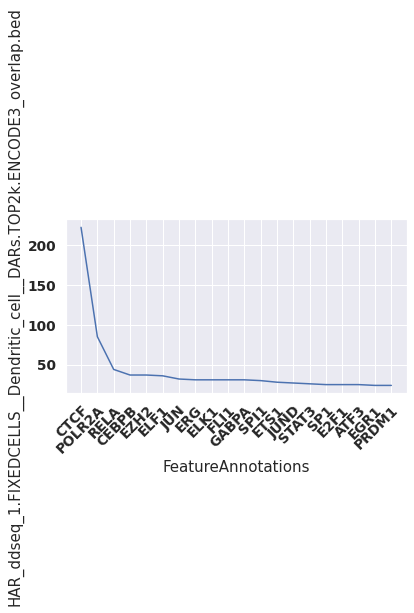

HAR_ddseq_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


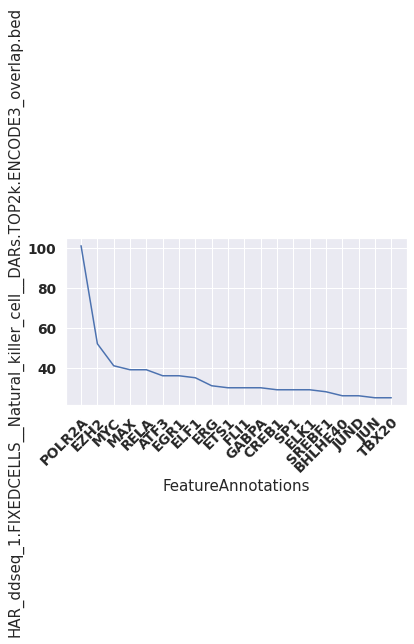

HAR_ddseq_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


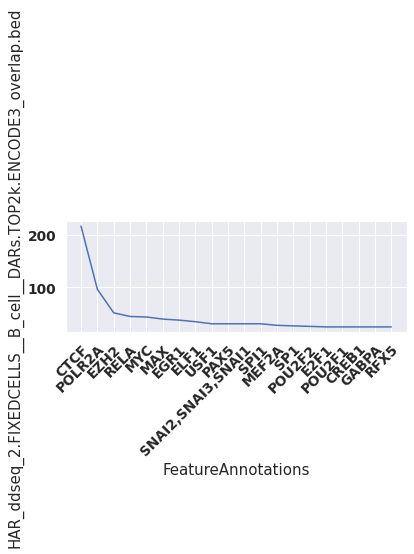

HAR_ddseq_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


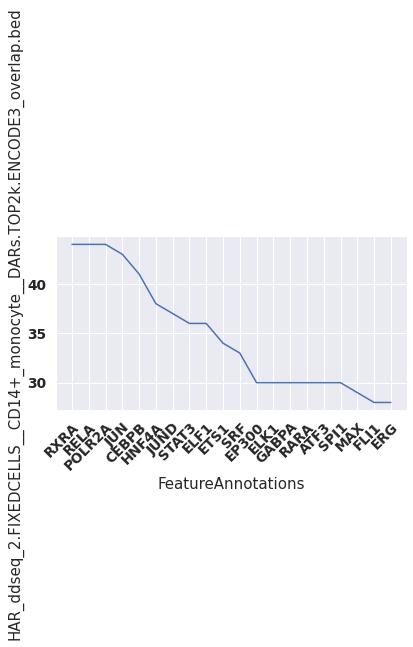

HAR_ddseq_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


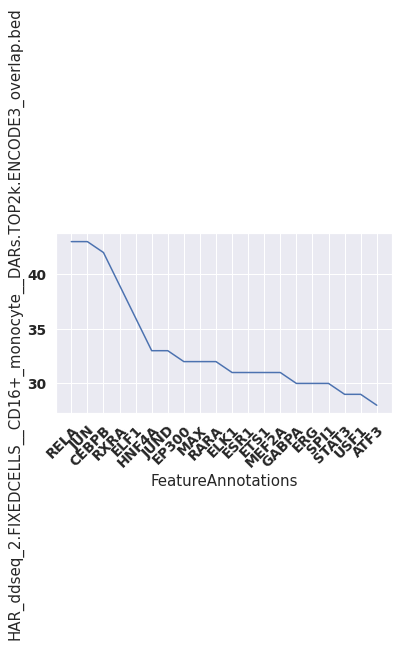

HAR_ddseq_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


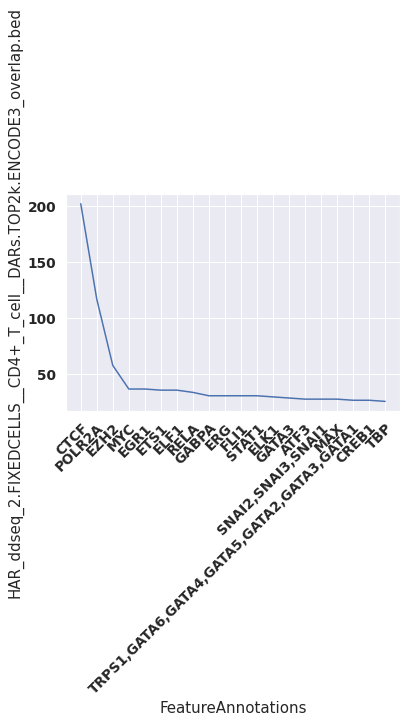

HAR_ddseq_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


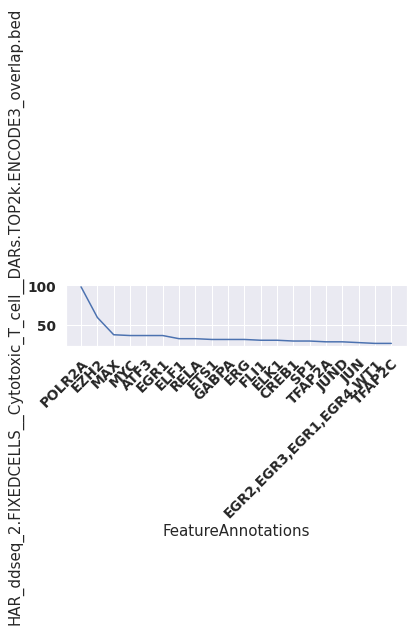

HAR_ddseq_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


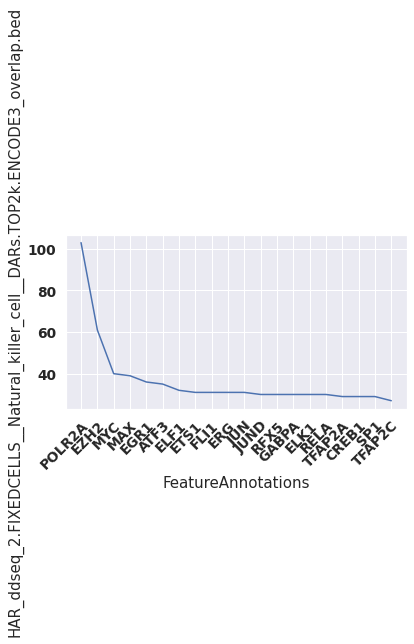

MDC_mtscatac_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


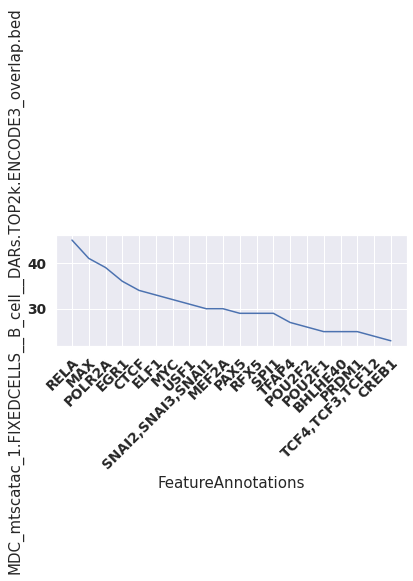

MDC_mtscatac_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


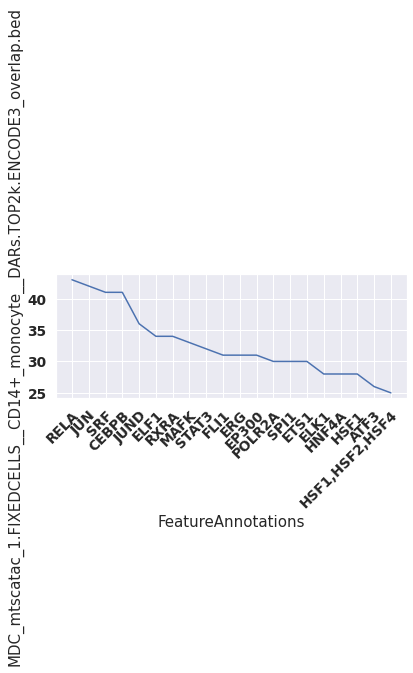

MDC_mtscatac_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


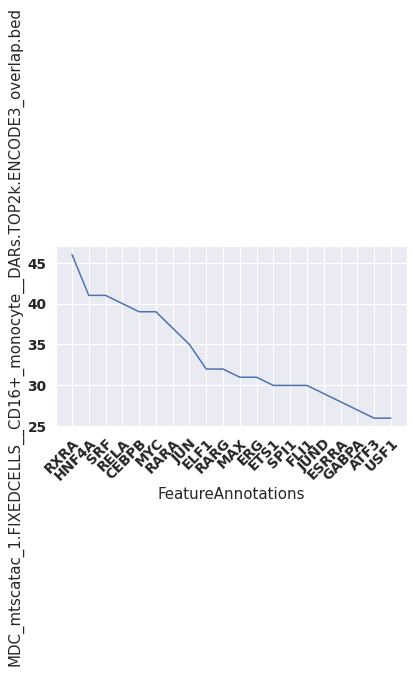

MDC_mtscatac_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


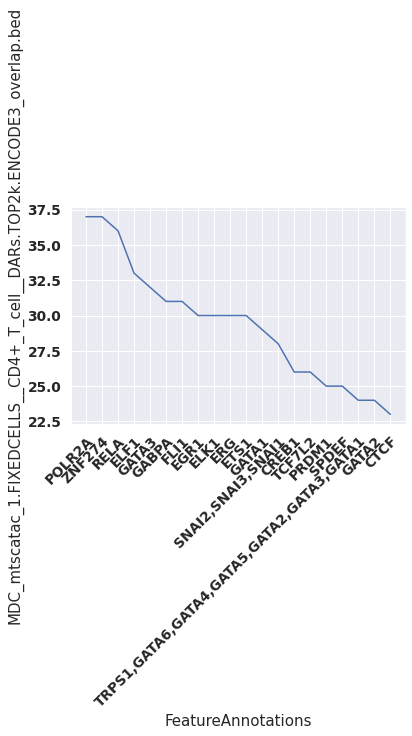

MDC_mtscatac_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


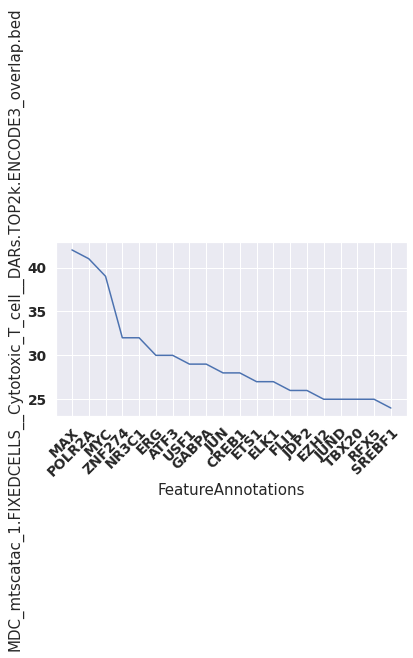

MDC_mtscatac_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


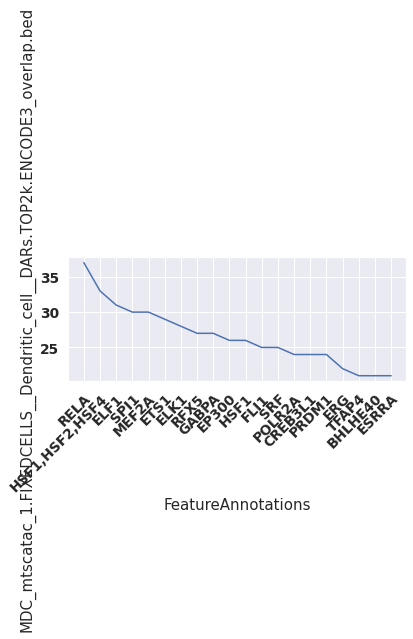

MDC_mtscatac_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


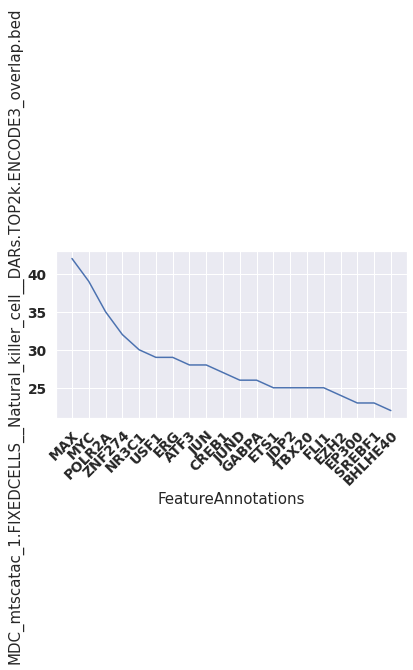

MDC_mtscatac_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


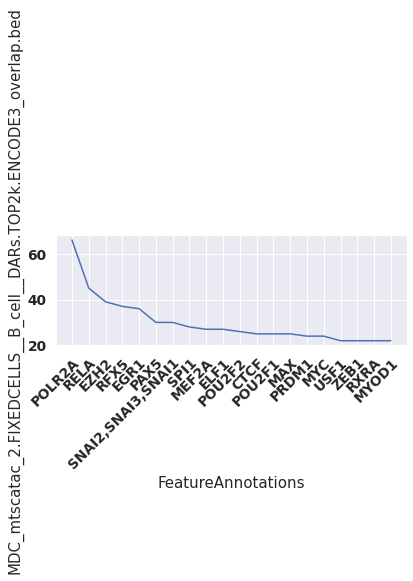

MDC_mtscatac_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


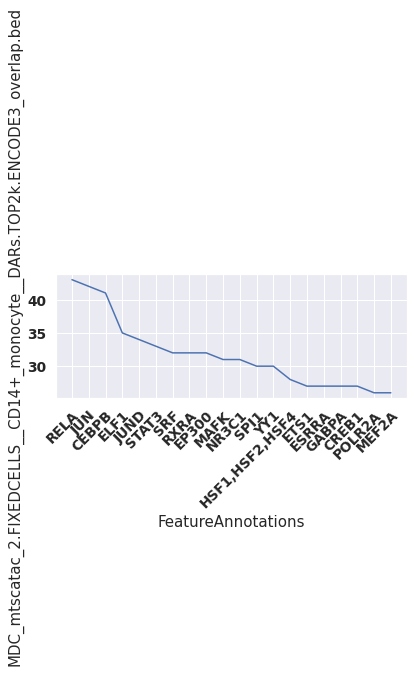

MDC_mtscatac_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


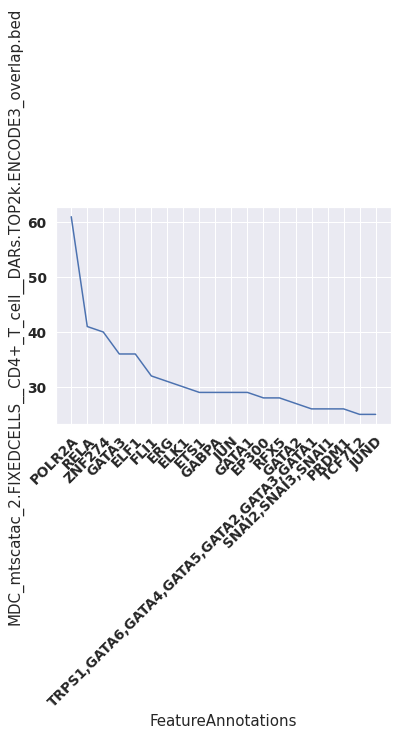

MDC_mtscatac_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


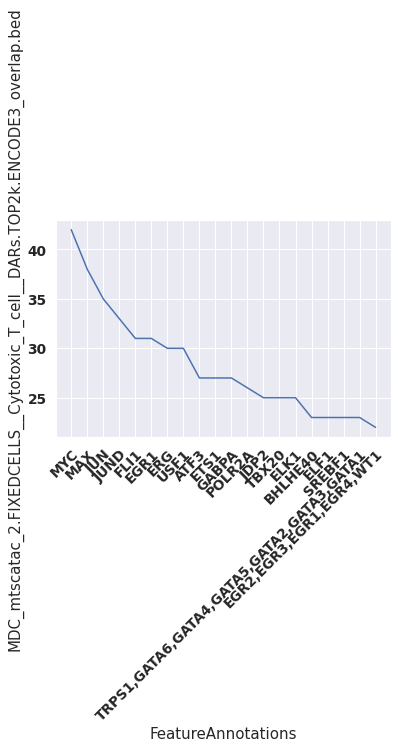

MDC_mtscatac_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


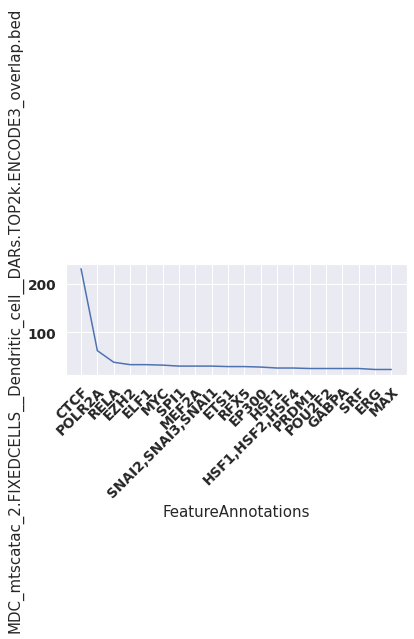

MDC_mtscatac_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


/tmp/ipykernel_640032/911654179.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


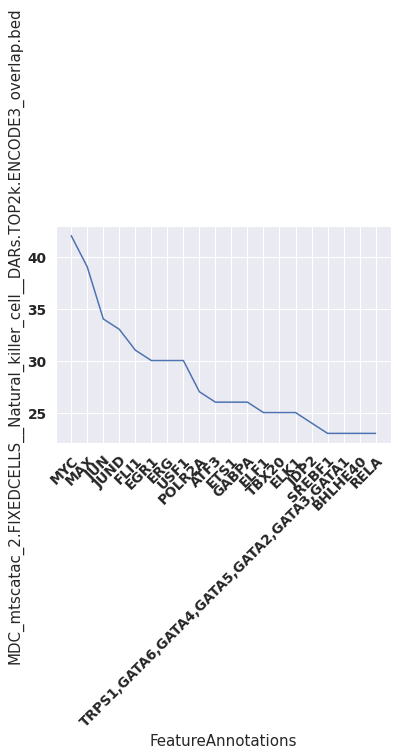

OHS_s3atac_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


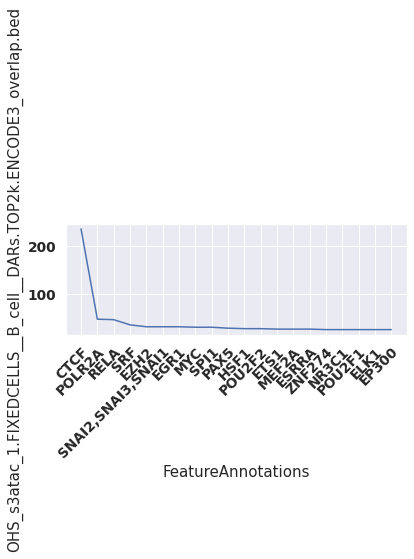

OHS_s3atac_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


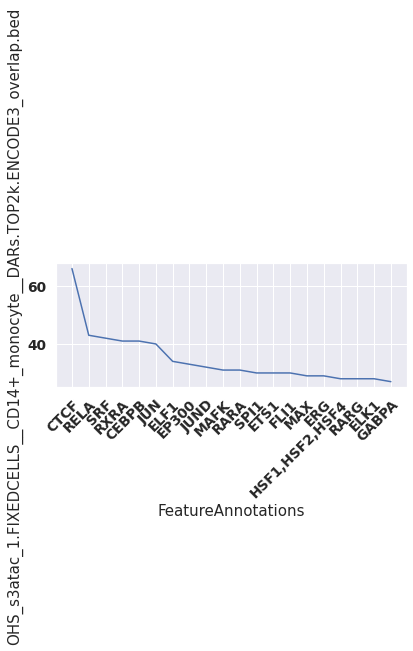

OHS_s3atac_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


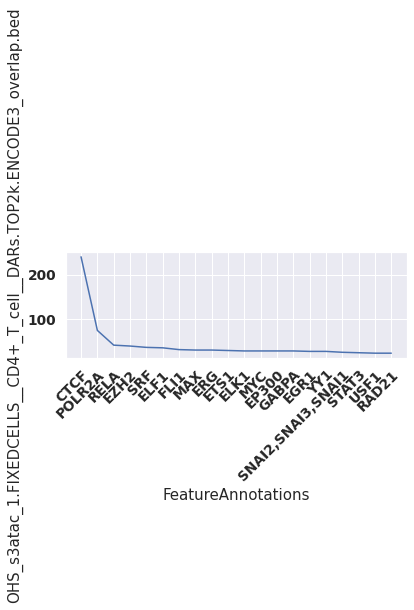

OHS_s3atac_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


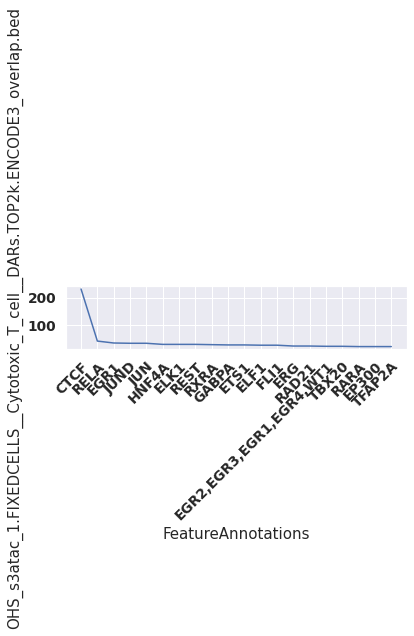

OHS_s3atac_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


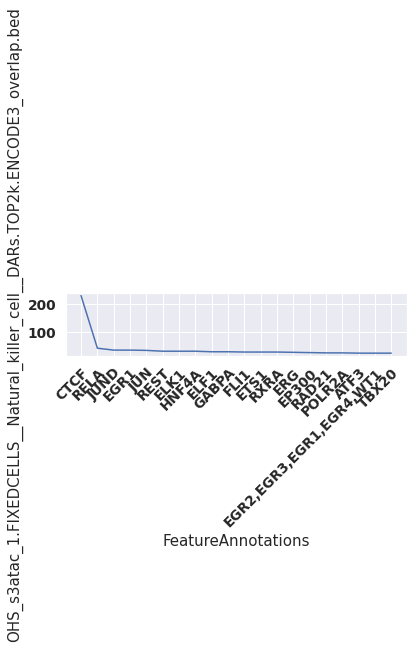

OHS_s3atac_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


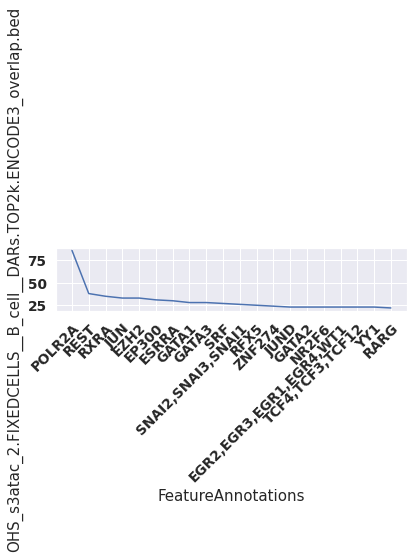

OHS_s3atac_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


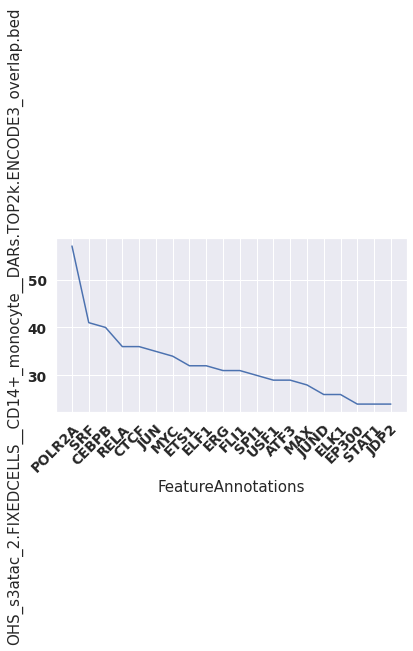

SAN_10xmultiome_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


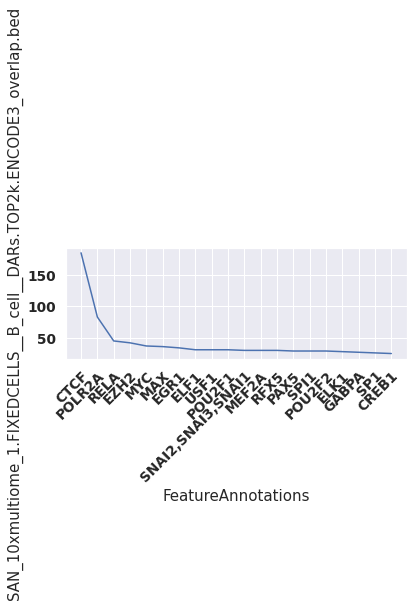

SAN_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


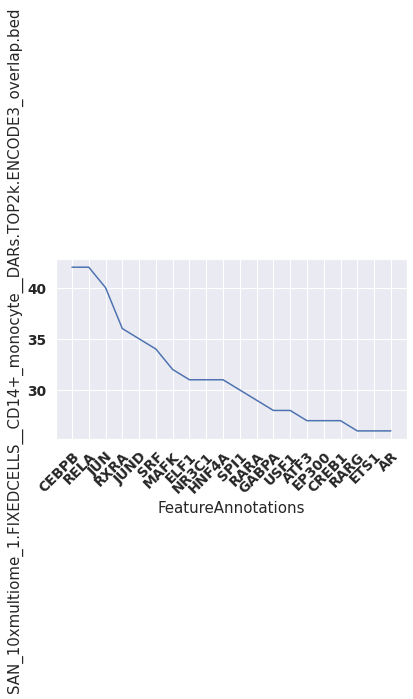

SAN_10xmultiome_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


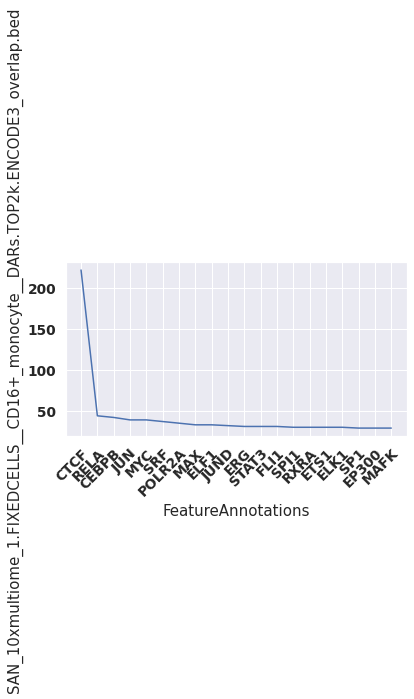

SAN_10xmultiome_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


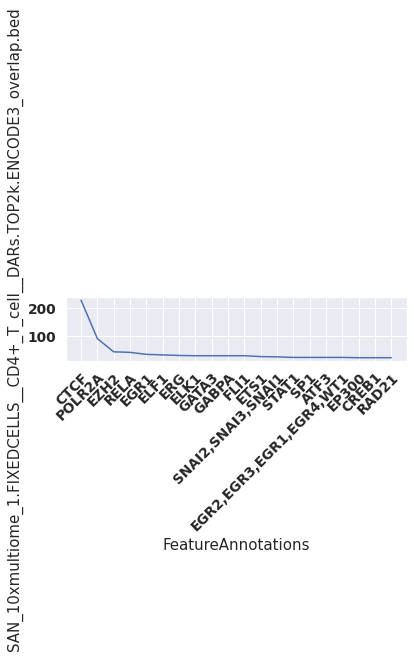

SAN_10xmultiome_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


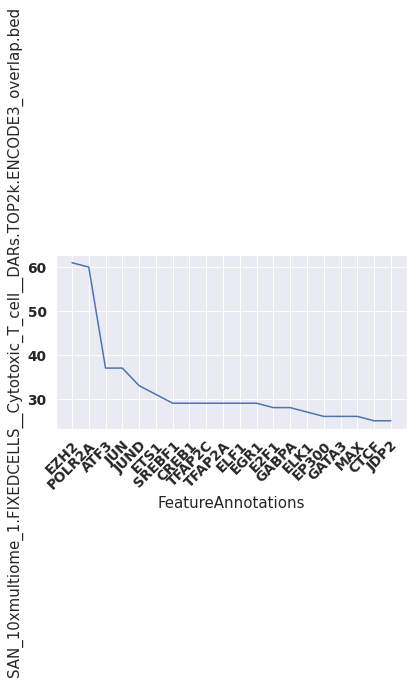

SAN_10xmultiome_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


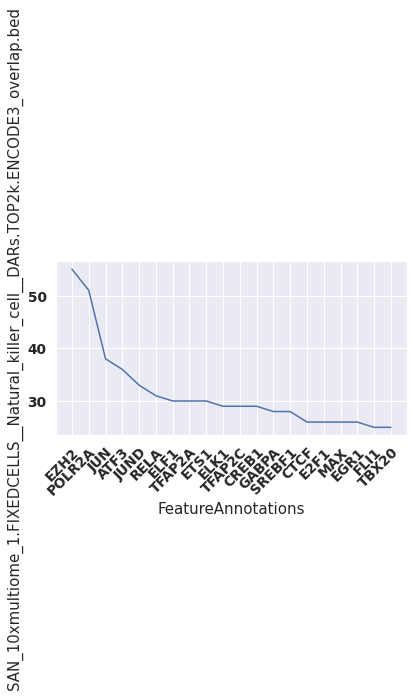

SAN_10xmultiome_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


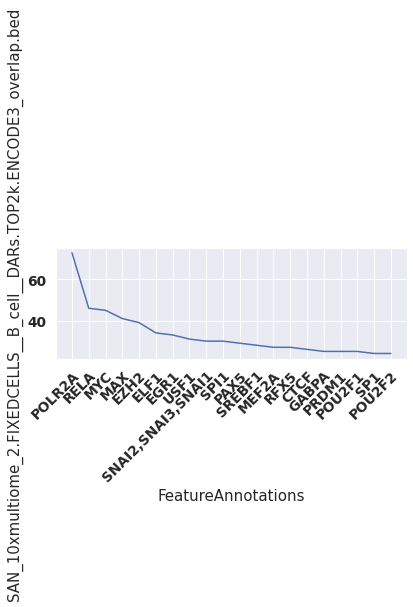

SAN_10xmultiome_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


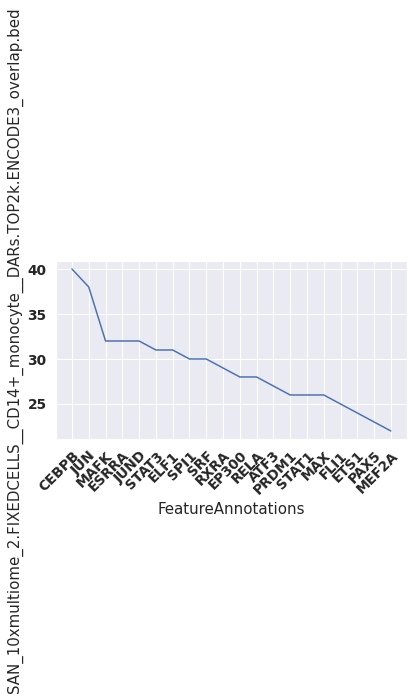

SAN_10xmultiome_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


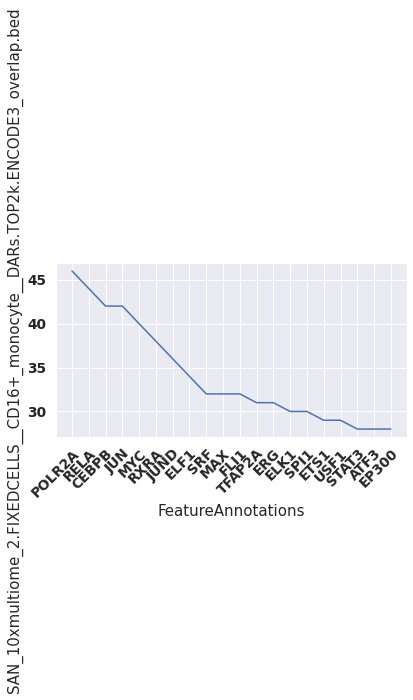

SAN_10xmultiome_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


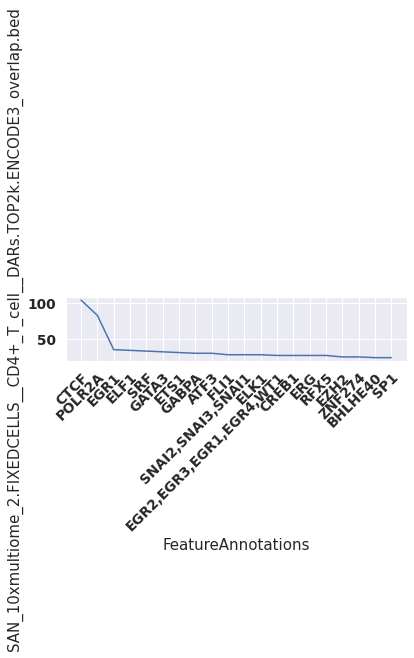

SAN_10xmultiome_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


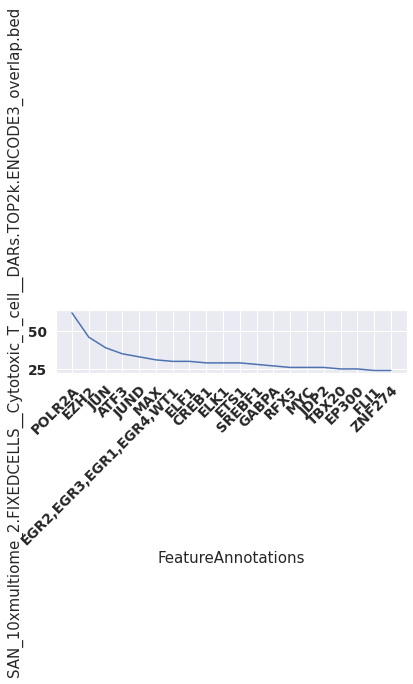

SAN_10xmultiome_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


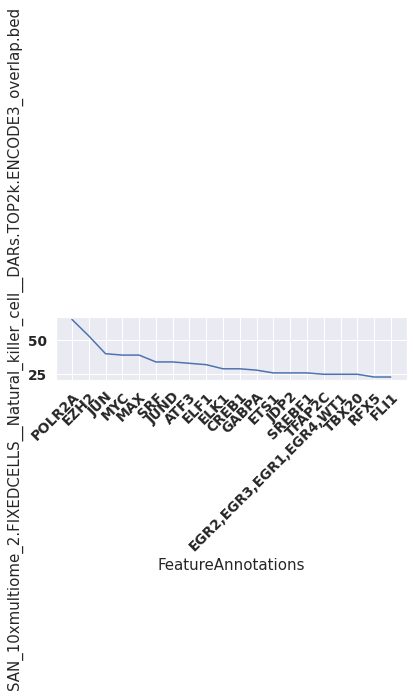

STA_10xv11_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


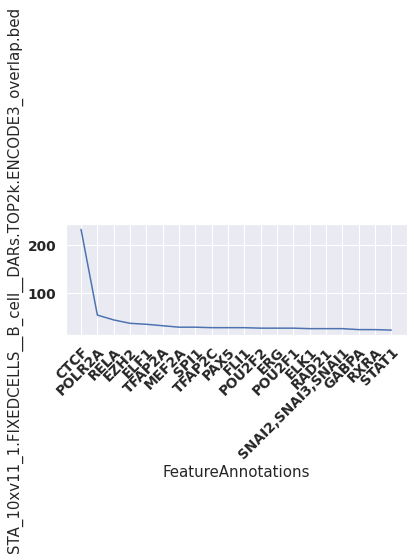

STA_10xv11_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


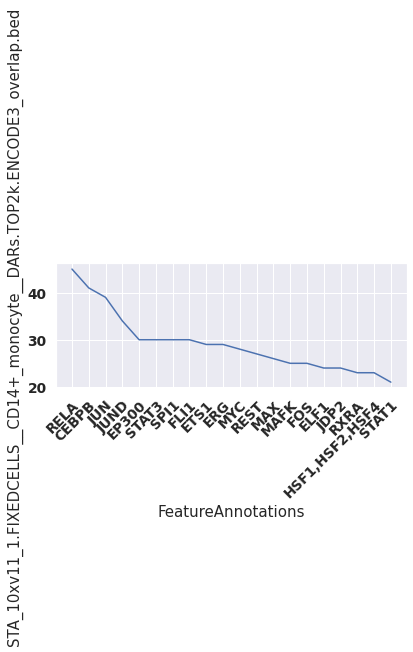

STA_10xv11_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


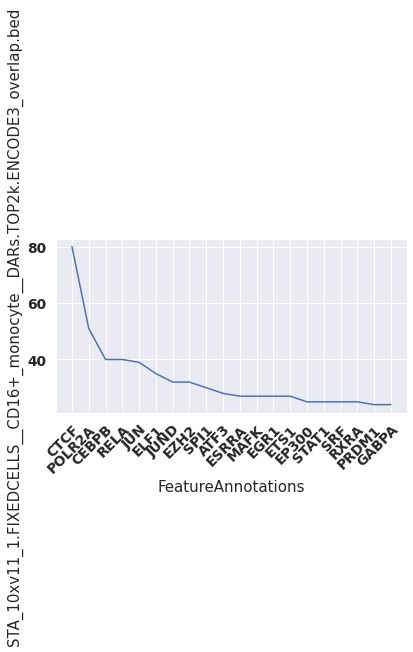

STA_10xv11_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


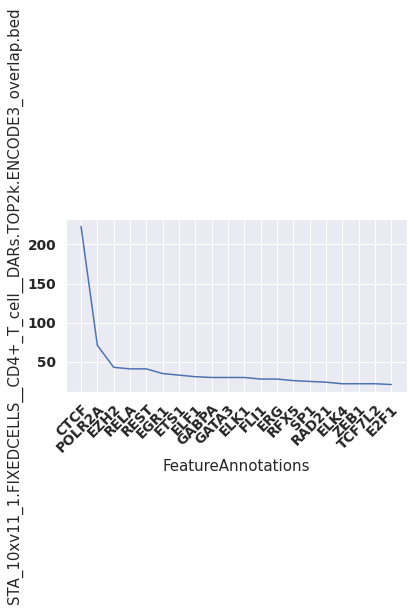

STA_10xv11_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


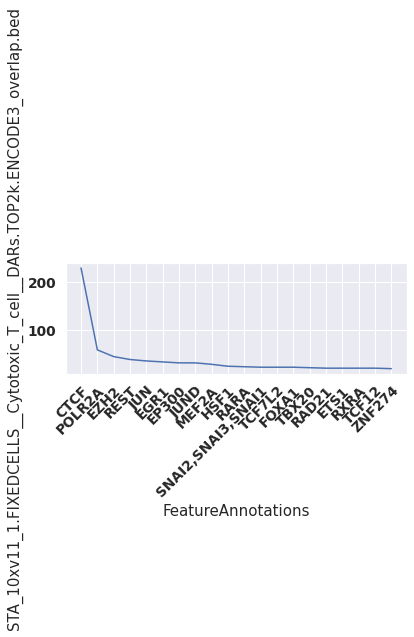

STA_10xv11_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


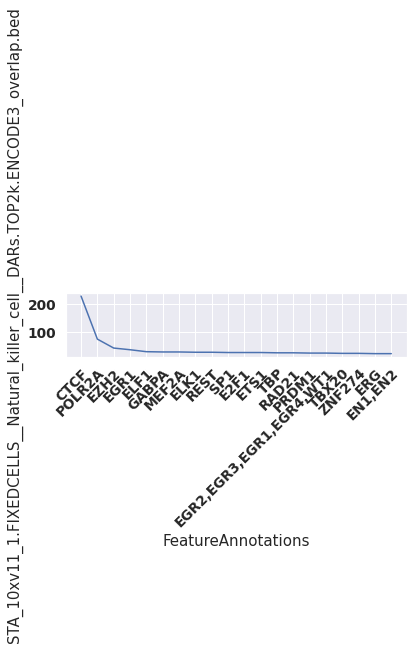

STA_10xv11_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


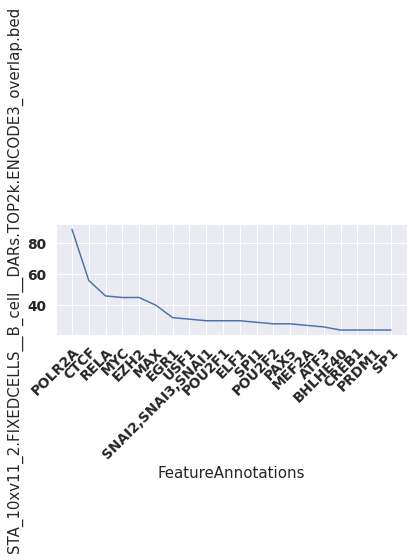

STA_10xv11_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


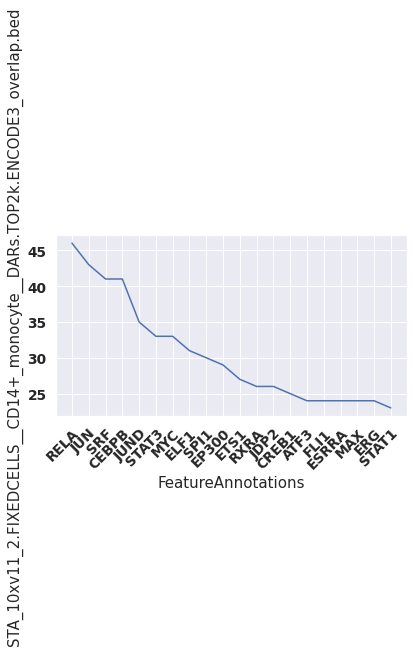

STA_10xv11_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


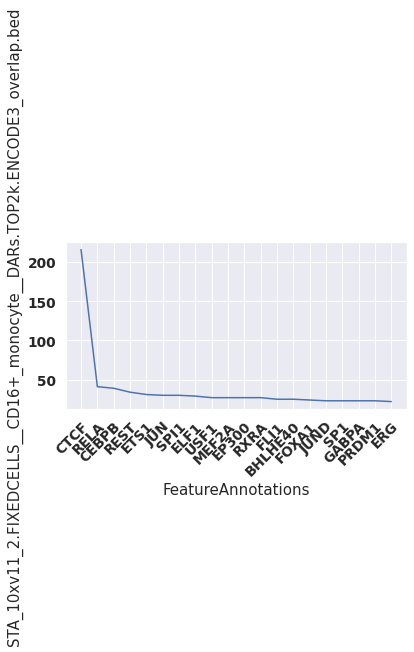

STA_10xv11_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


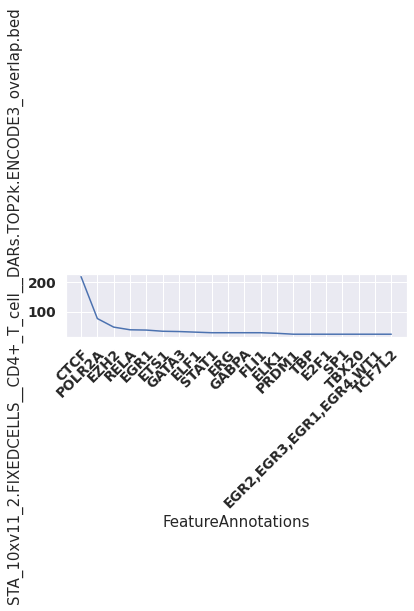

STA_10xv11_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


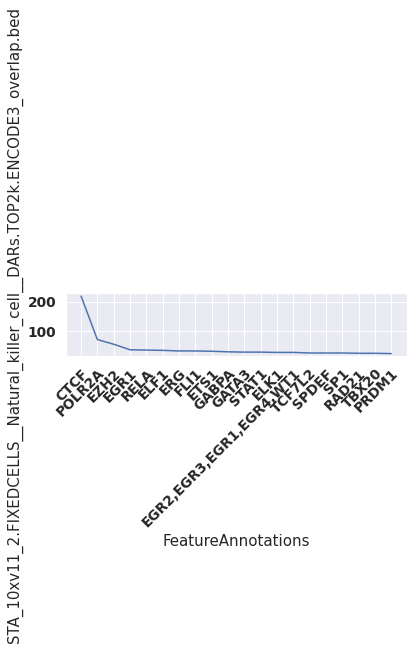

TXG_10xv11_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


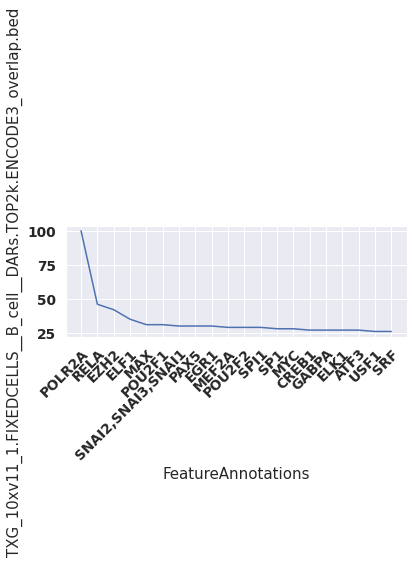

TXG_10xv11_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


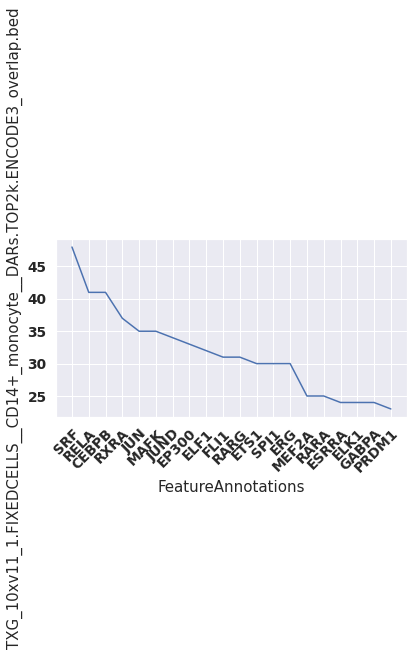

TXG_10xv11_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


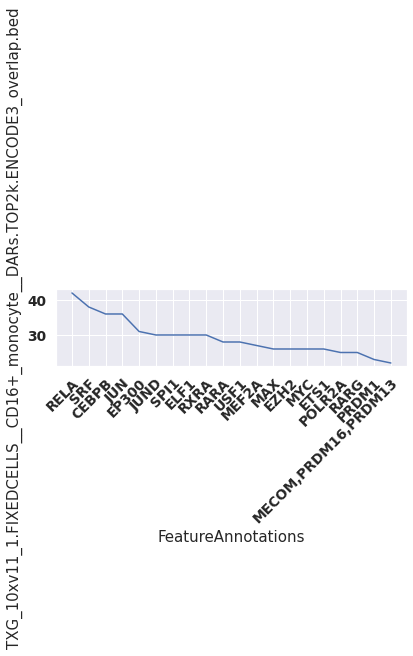

TXG_10xv11_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


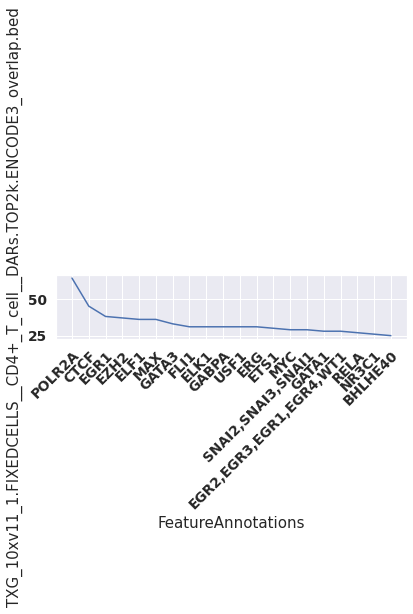

TXG_10xv11_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


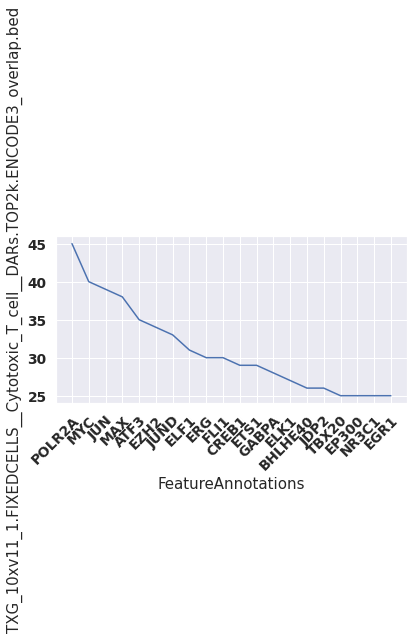

TXG_10xv11_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


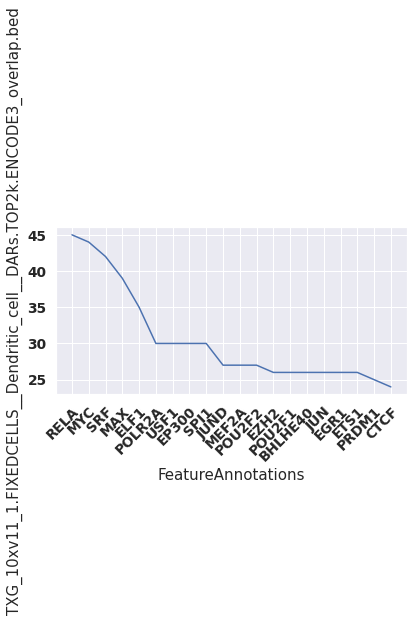

TXG_10xv11_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


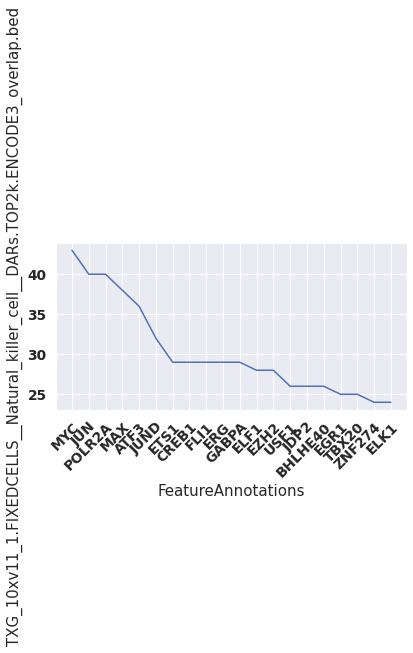

TXG_10xv2_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


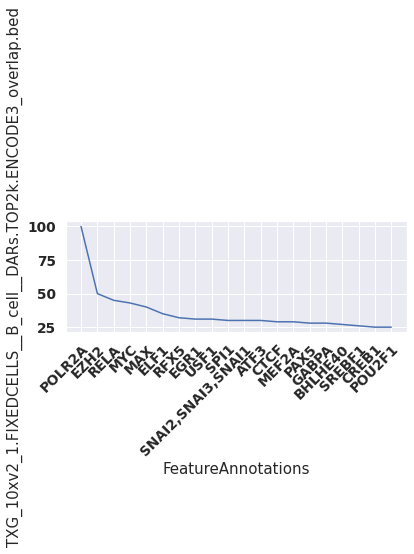

TXG_10xv2_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


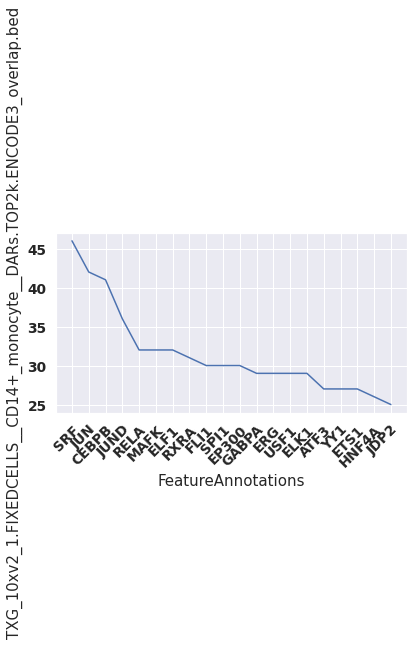

TXG_10xv2_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


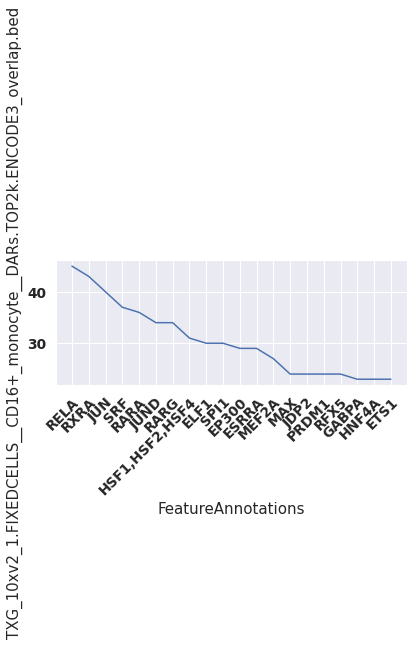

TXG_10xv2_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


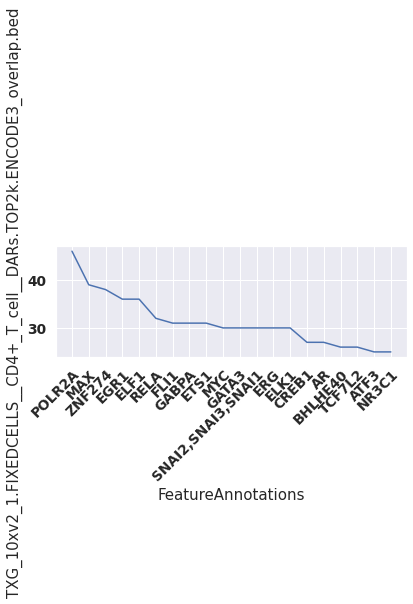

TXG_10xv2_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


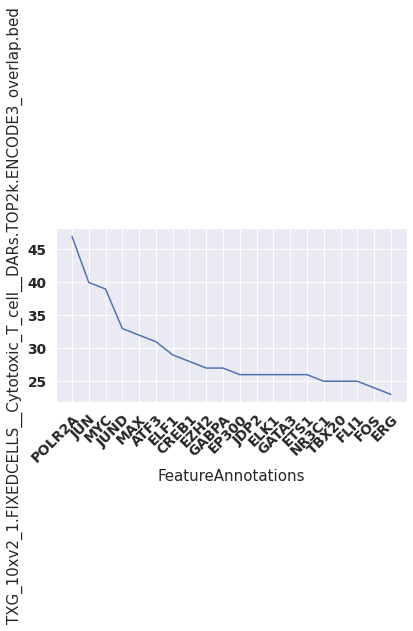

TXG_10xv2_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


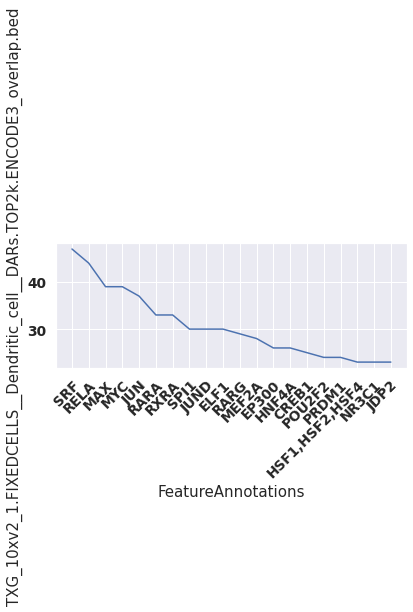

TXG_10xv2_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


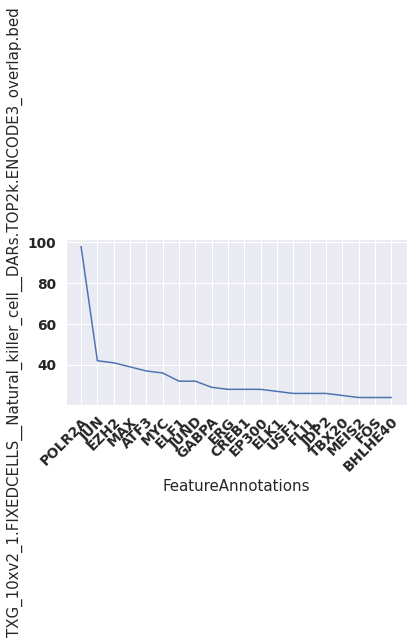

TXG_10xv2_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


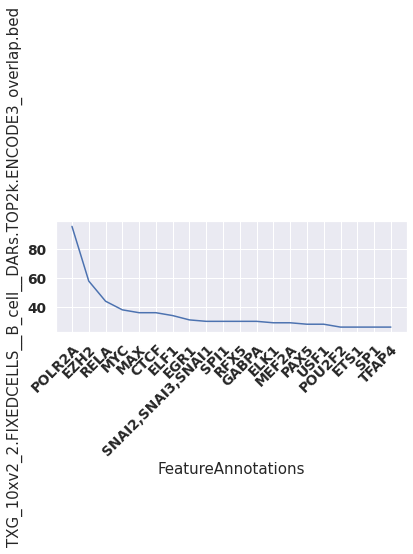

TXG_10xv2_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


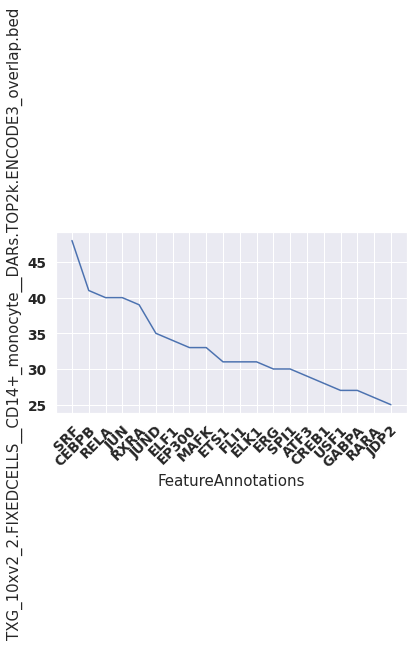

TXG_10xv2_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


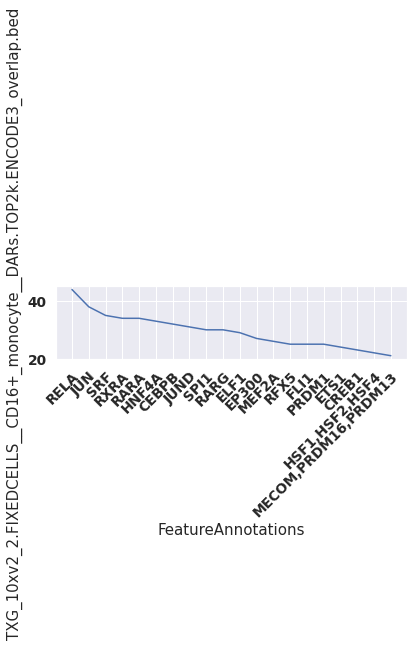

TXG_10xv2_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


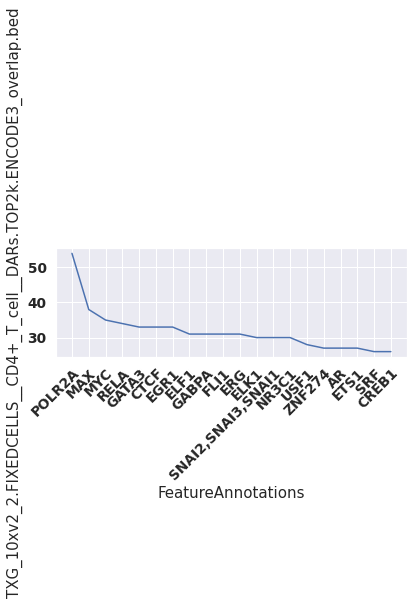

TXG_10xv2_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


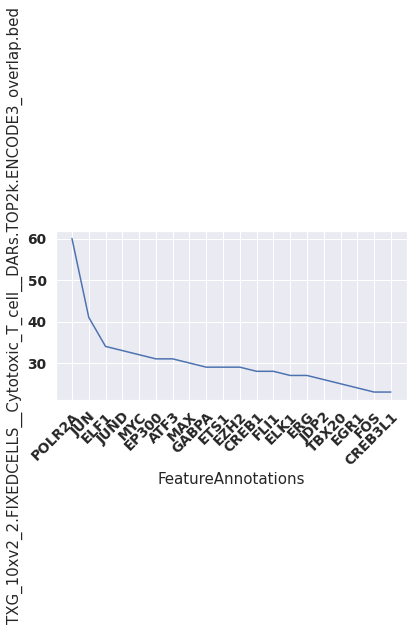

TXG_10xv2_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


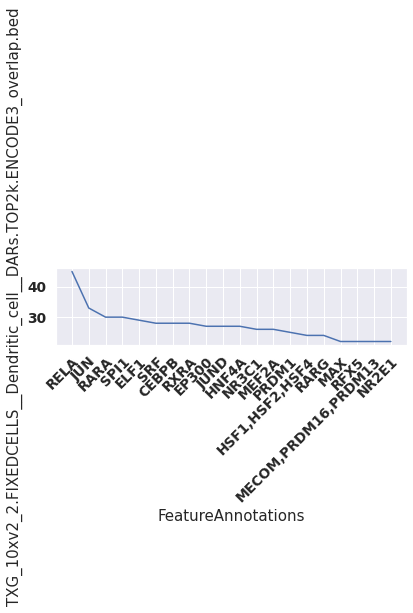

TXG_10xv2_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


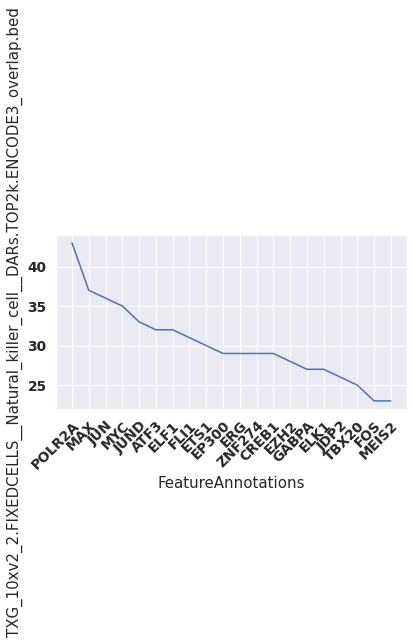

UCS_ddseq_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


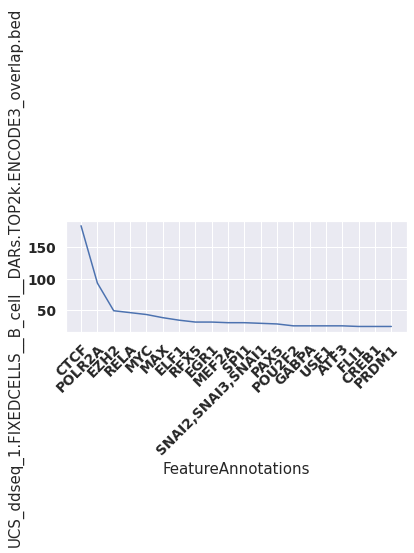

UCS_ddseq_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


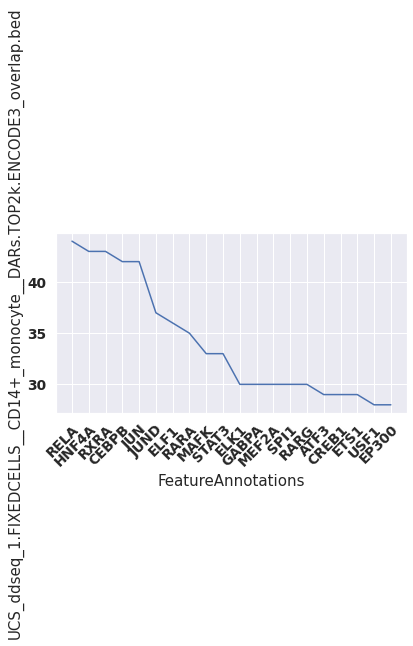

UCS_ddseq_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


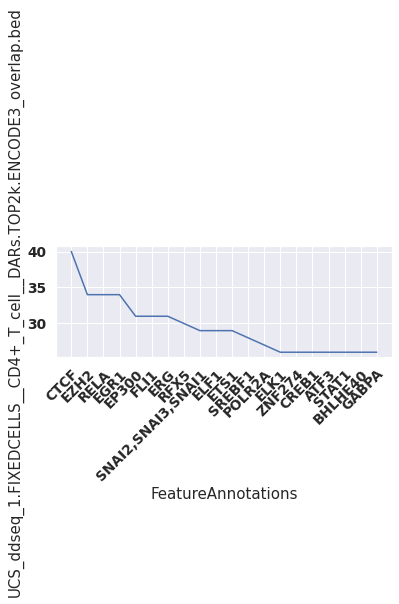

UCS_ddseq_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


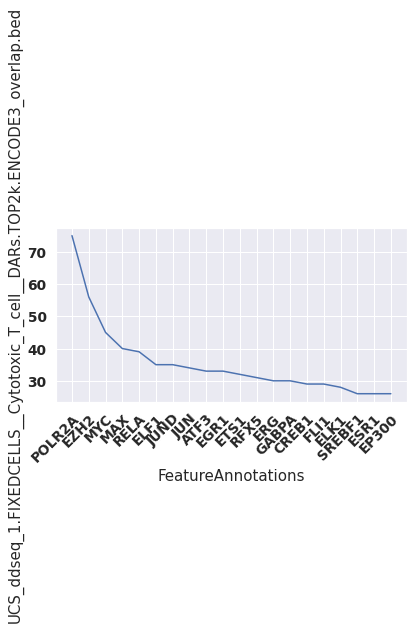

UCS_ddseq_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


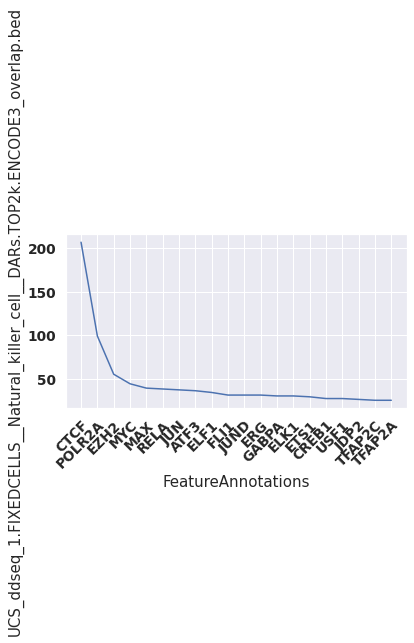

UCS_ddseq_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


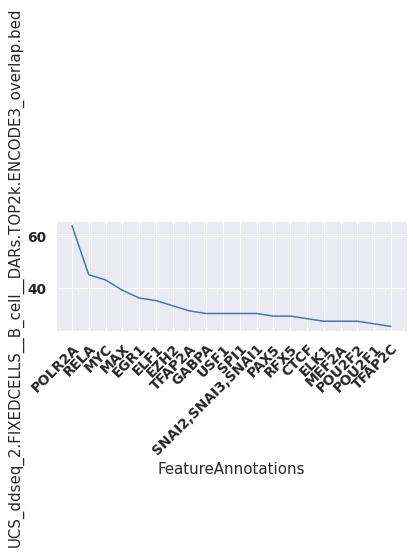

UCS_ddseq_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


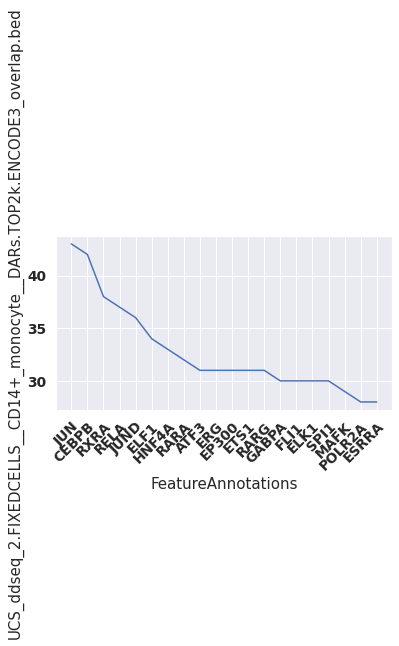

UCS_ddseq_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


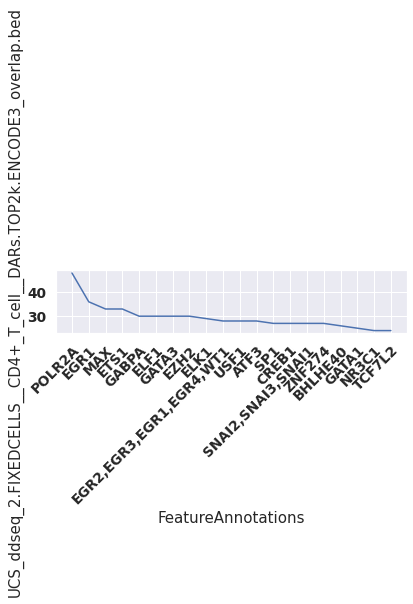

UCS_ddseq_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


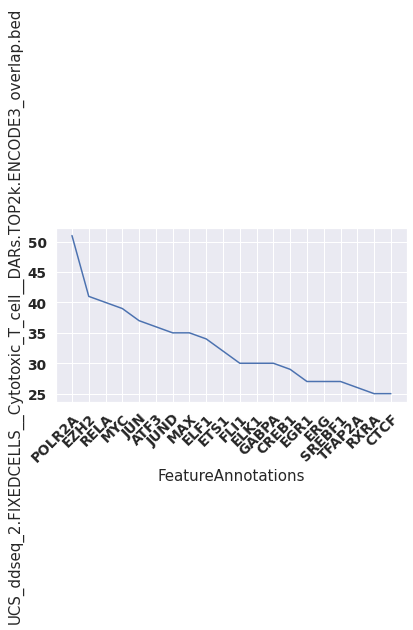

UCS_ddseq_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


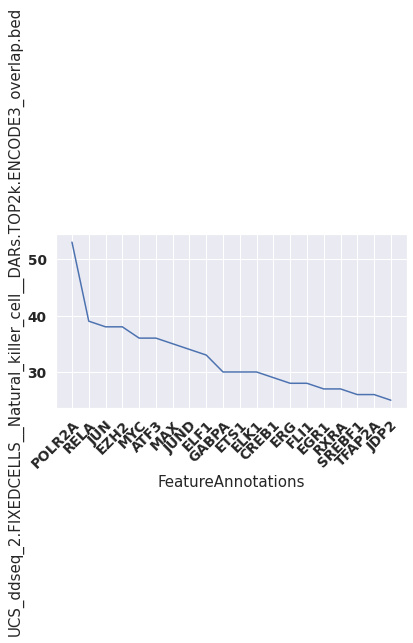

VIB_10xmultiome_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


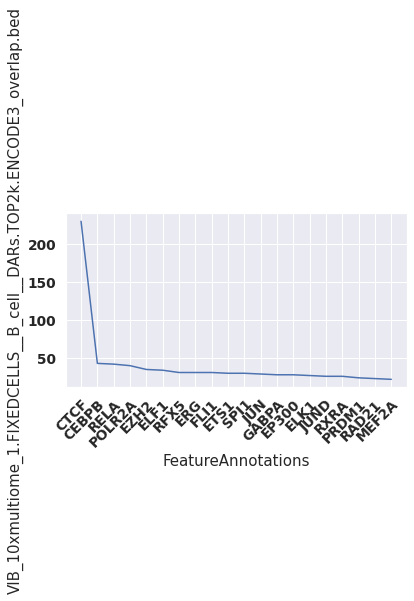

VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


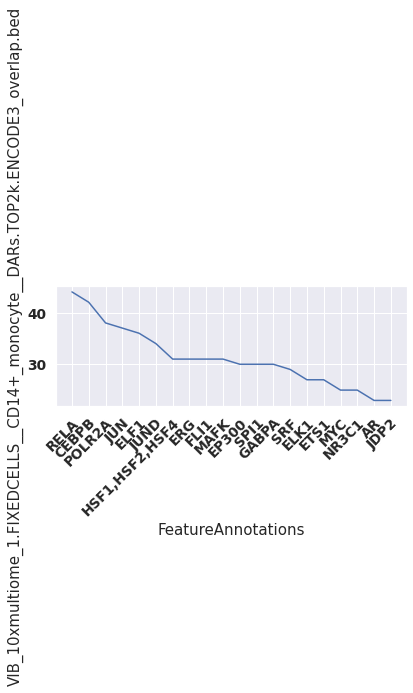

VIB_10xmultiome_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


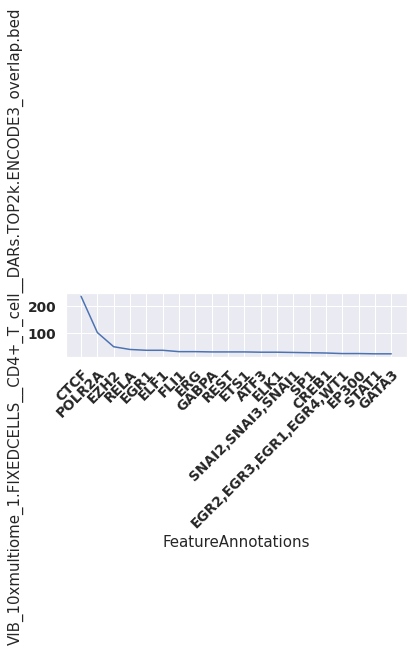

VIB_10xmultiome_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


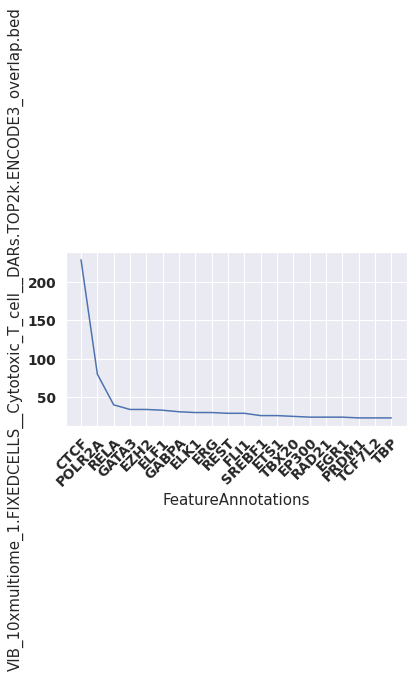

VIB_10xmultiome_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


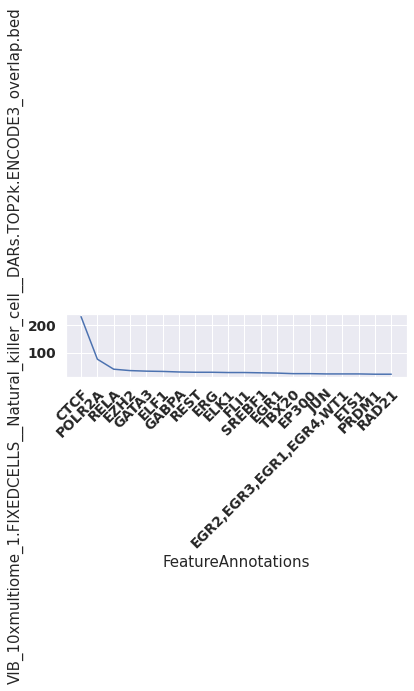

VIB_10xmultiome_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


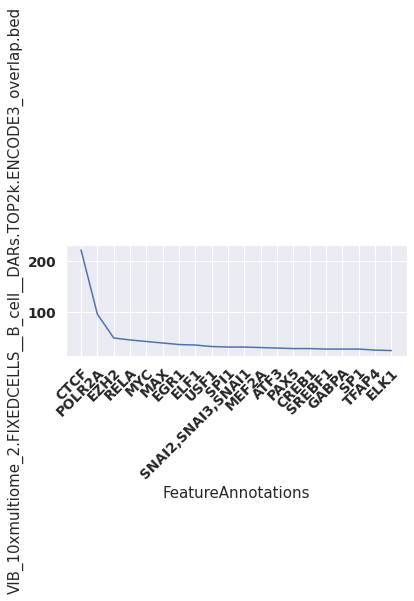

VIB_10xmultiome_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


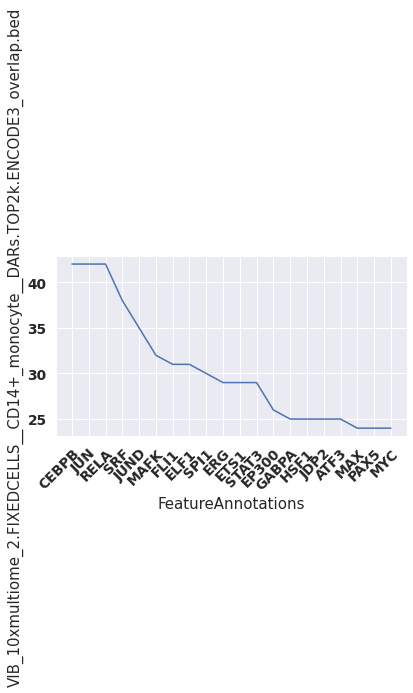

VIB_10xmultiome_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


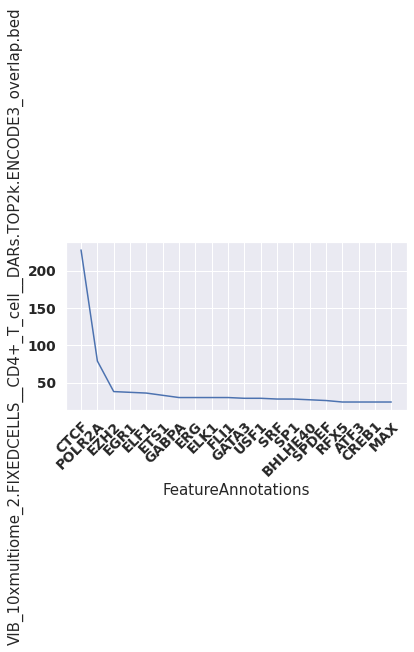

VIB_10xmultiome_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


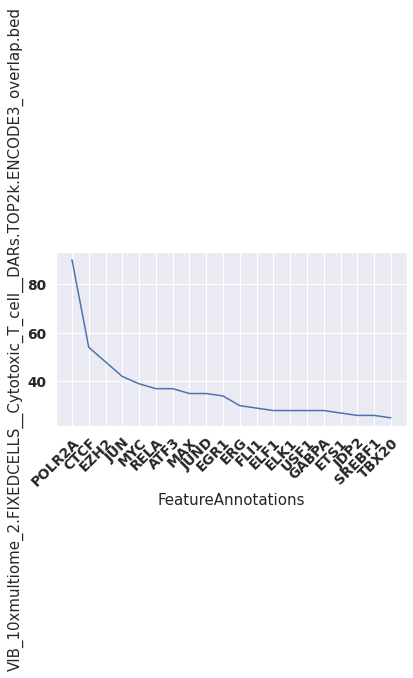

VIB_10xmultiome_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


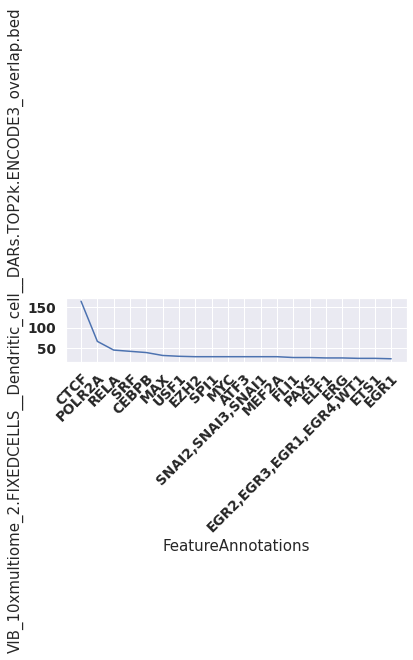

VIB_10xmultiome_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


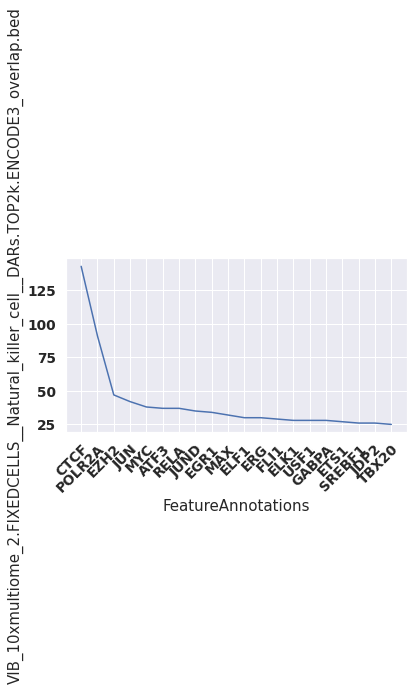

VIB_10xv1_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


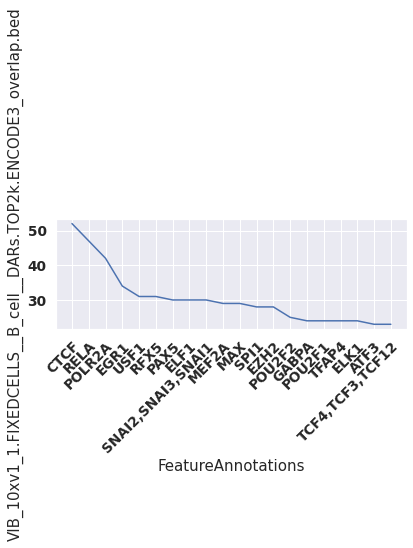

VIB_10xv1_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


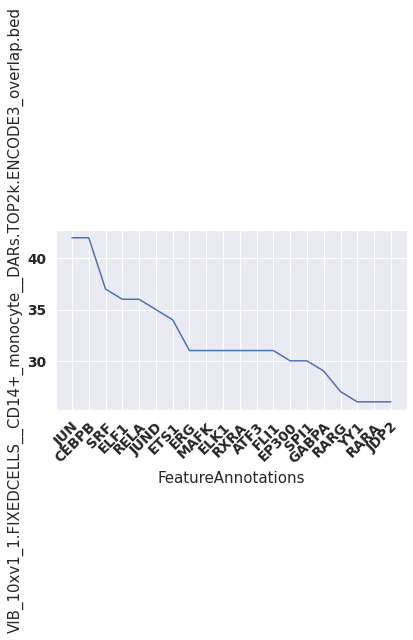

VIB_10xv1_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


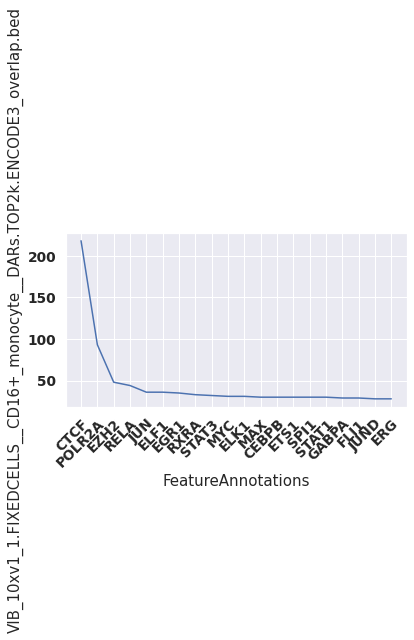

VIB_10xv1_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


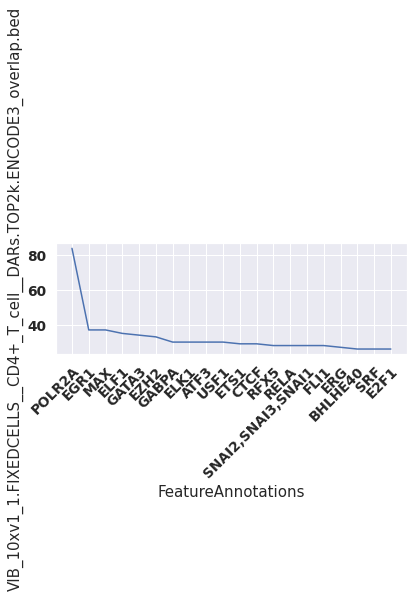

VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


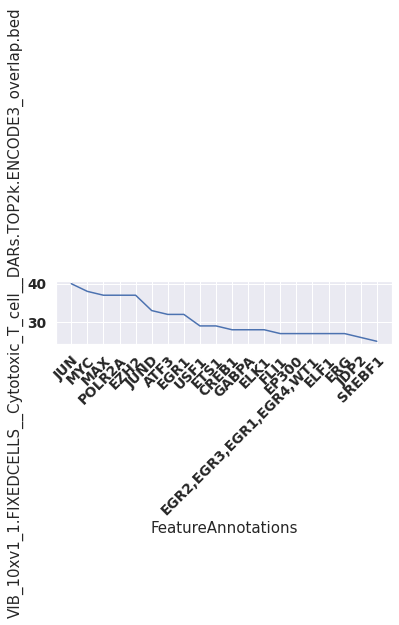

VIB_10xv1_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


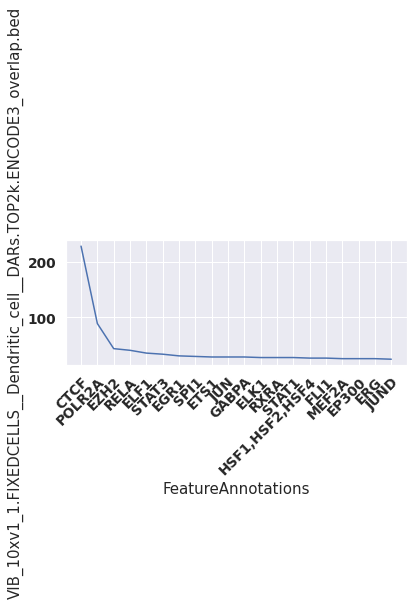

VIB_10xv1_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


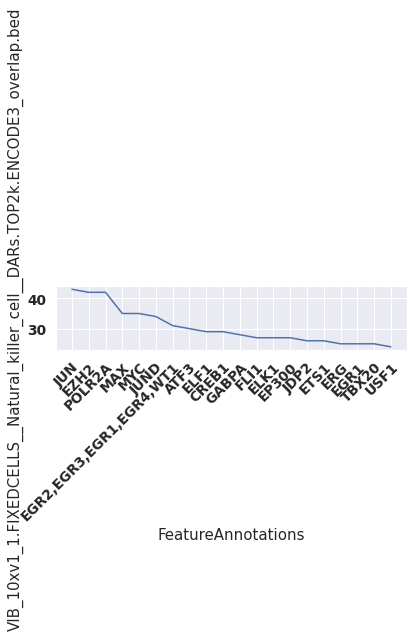

VIB_10xv1_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


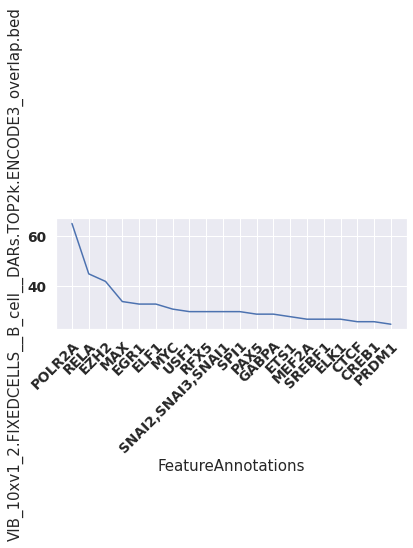

VIB_10xv1_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


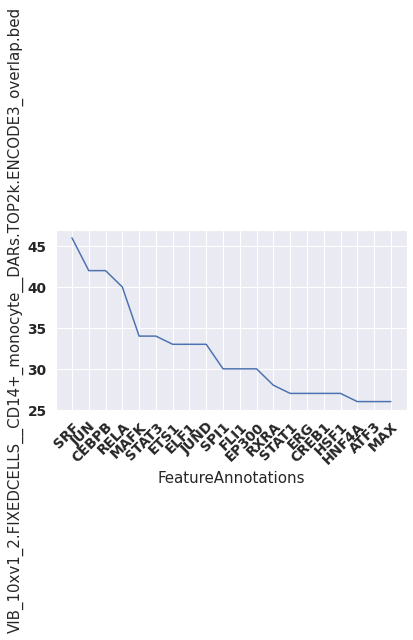

VIB_10xv1_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


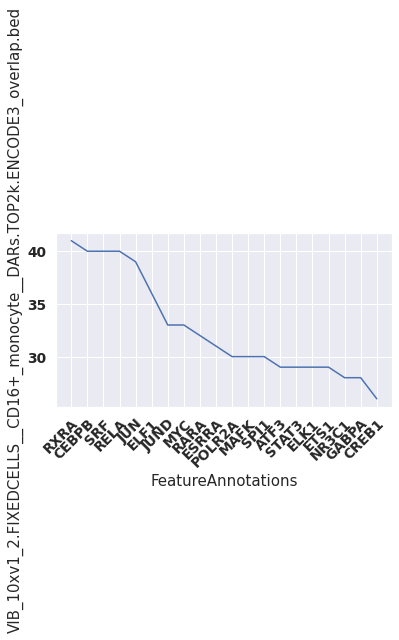

VIB_10xv1_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


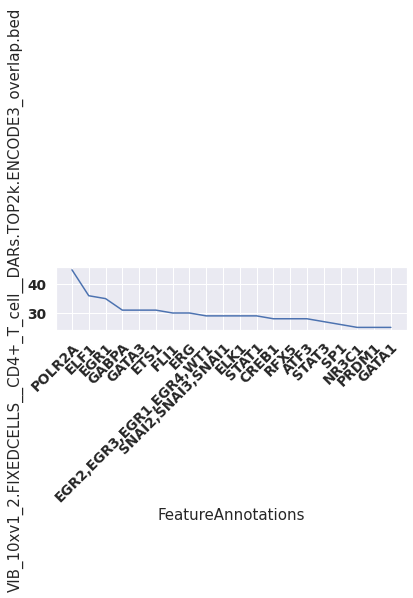

VIB_10xv1_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


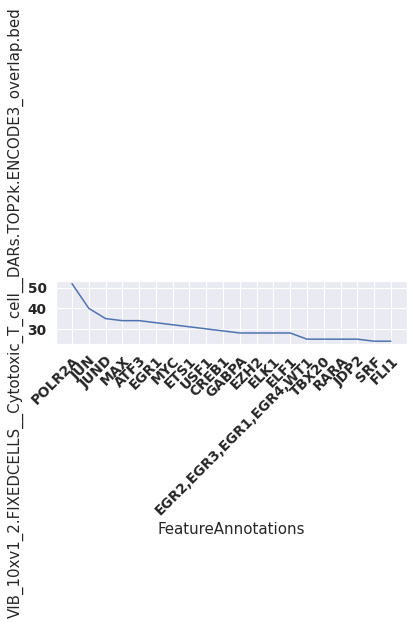

VIB_10xv1_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


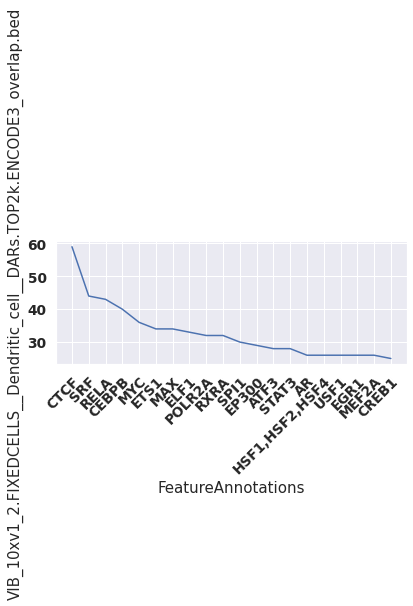

VIB_10xv1_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


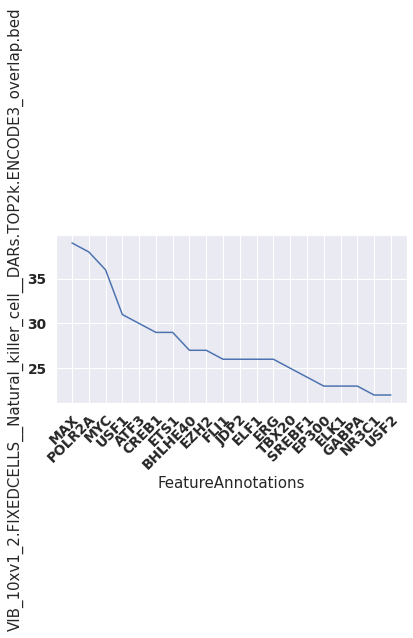

VIB_10xv2_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


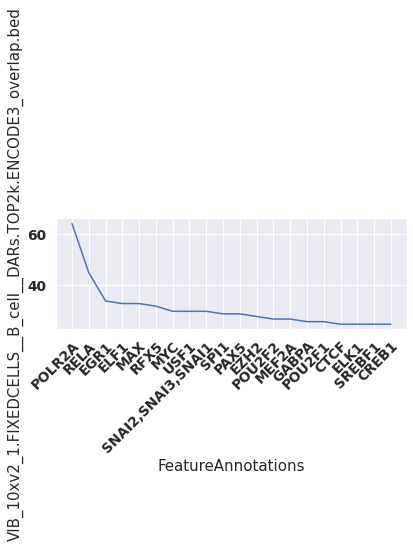

VIB_10xv2_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


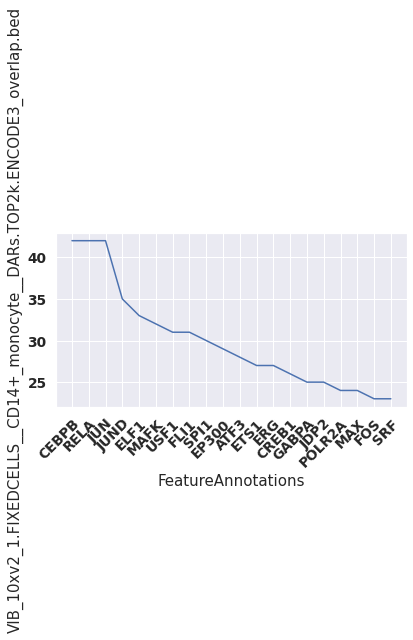

VIB_10xv2_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


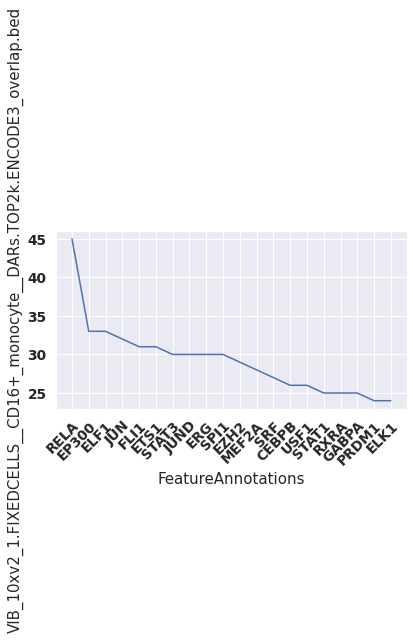

VIB_10xv2_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


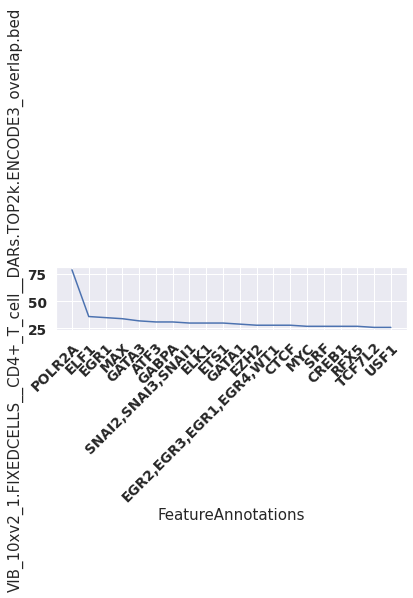

VIB_10xv2_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


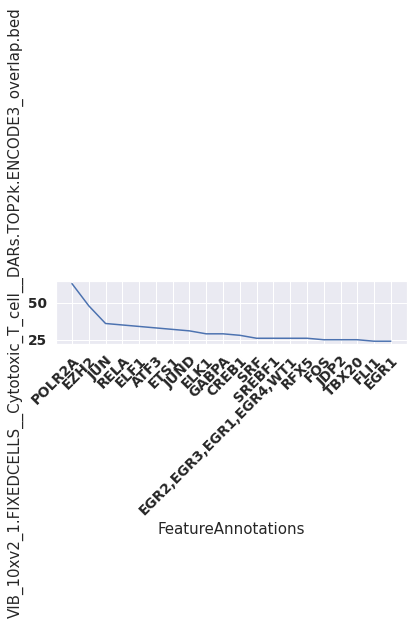

VIB_10xv2_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


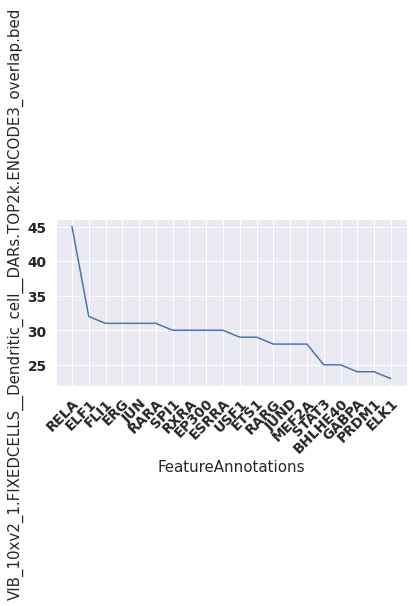

VIB_10xv2_1.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


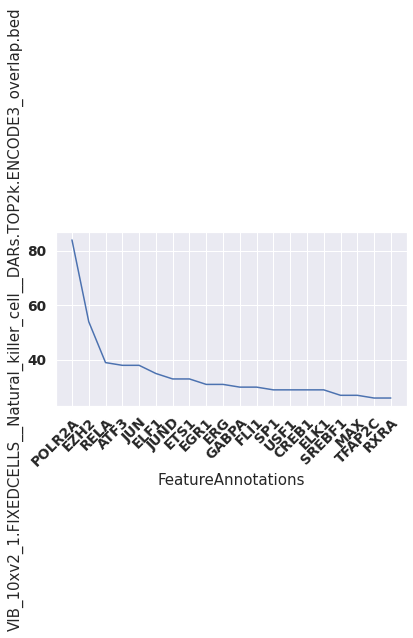

VIB_10xv2_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


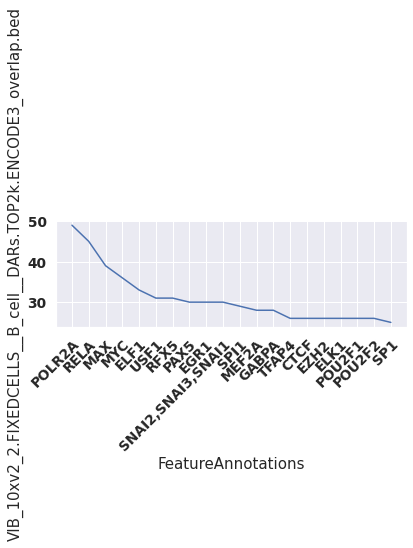

VIB_10xv2_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


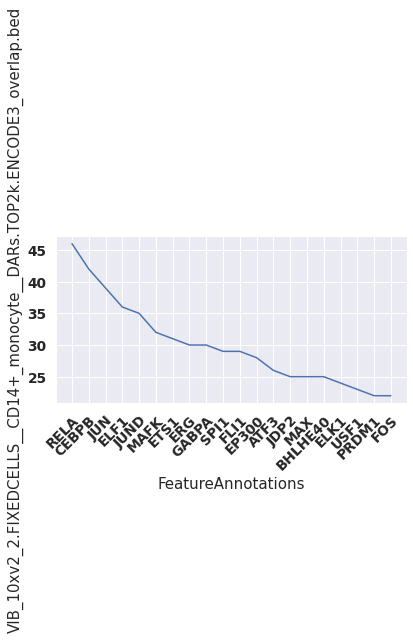

VIB_10xv2_2.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


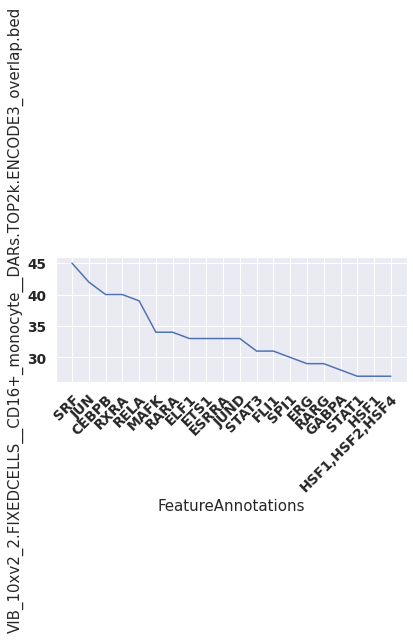

VIB_10xv2_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


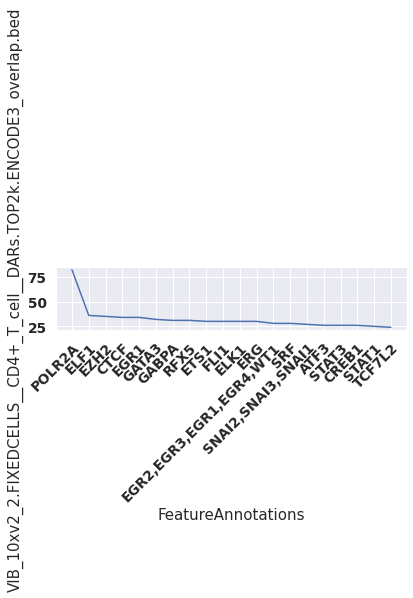

VIB_10xv2_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


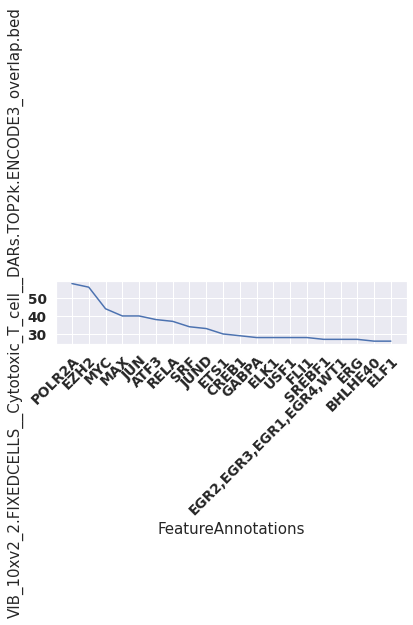

VIB_10xv2_2.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed


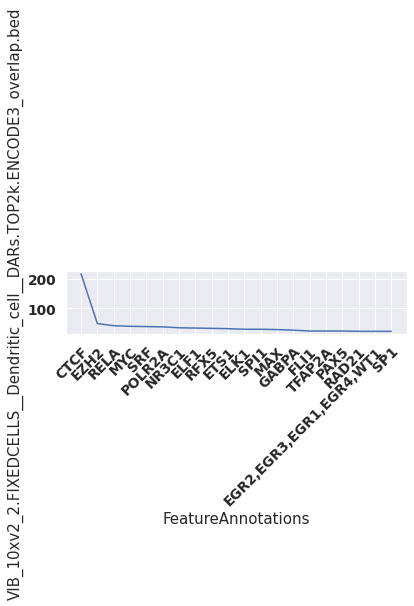

VIB_10xv2_2.FIXEDCELLS__Natural_killer_cell__DARs.TOP2k.ENCODE3_overlap.bed


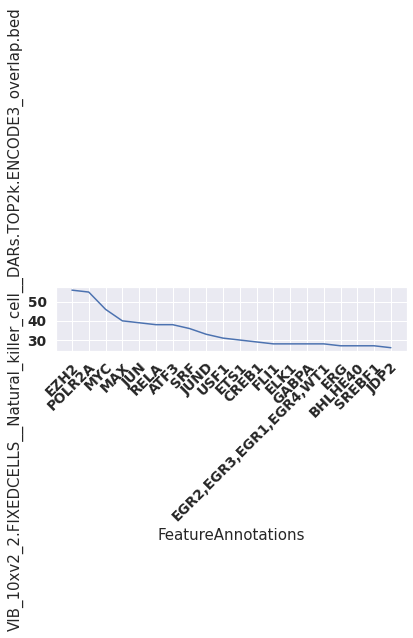

VIB_hydrop_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


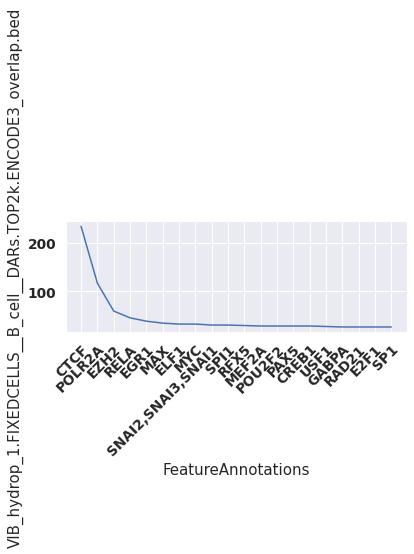

VIB_hydrop_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


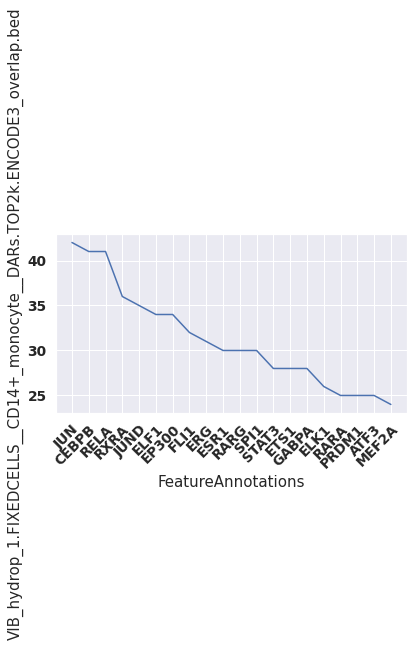

VIB_hydrop_1.FIXEDCELLS__CD16+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


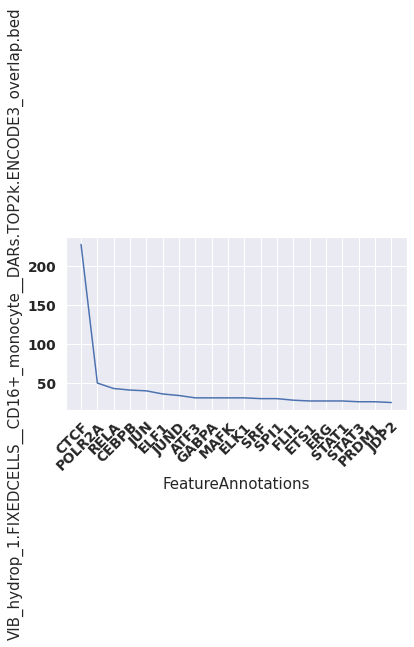

VIB_hydrop_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


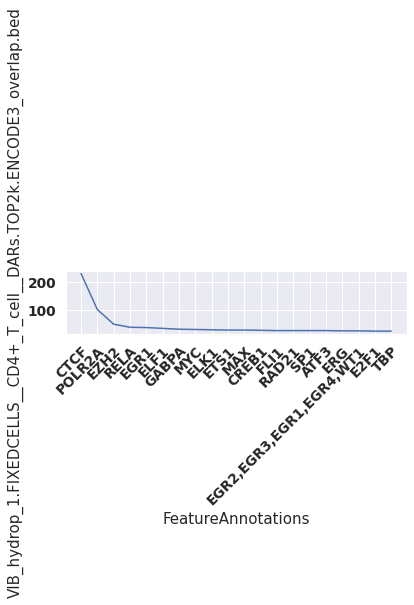

VIB_hydrop_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


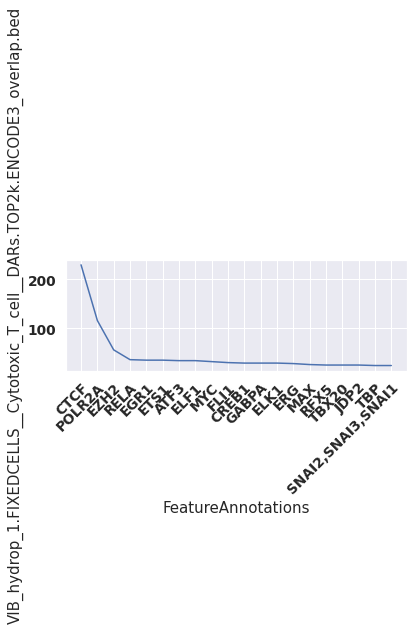

VIB_hydrop_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed


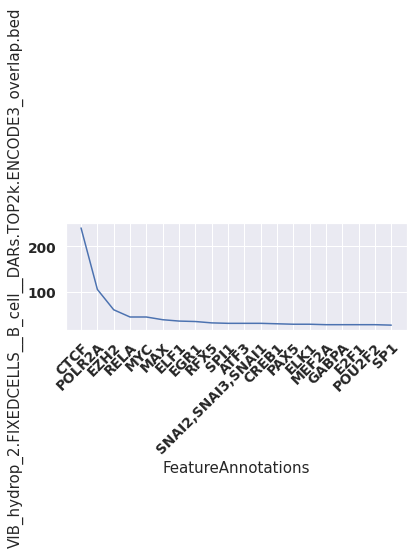

VIB_hydrop_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed


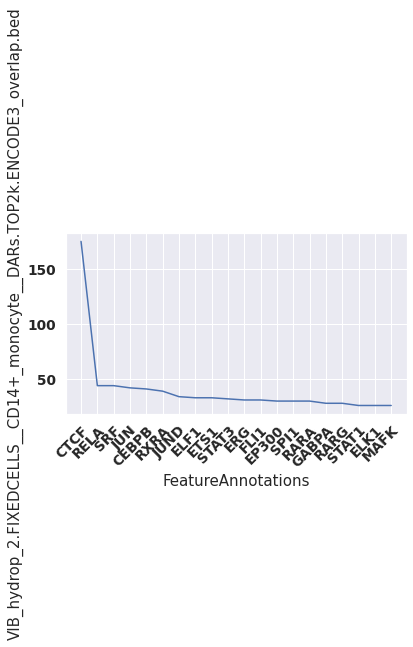

VIB_hydrop_2.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


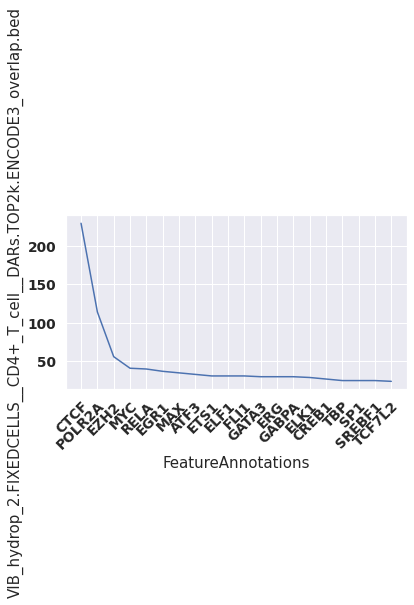

VIB_hydrop_2.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed


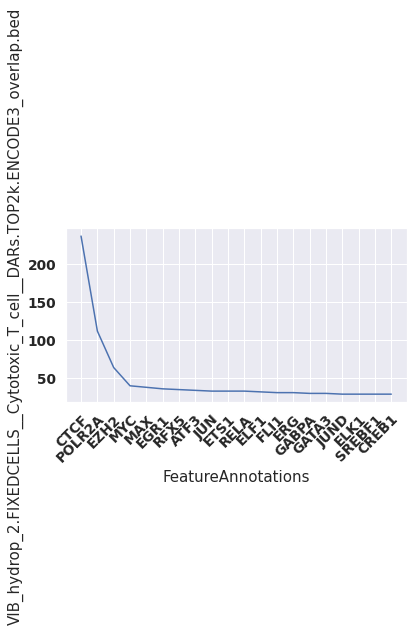

In [49]:
for bed in df_counts.index:
    print(bed)
    sample = bed.split("TOP2K")[0]
    df_sub = df_counts.loc[bed].sort_values(ascending=False)
    g = sns.lineplot(data=df_sub[0:20])
    plt.xticks(rotation=45, rotation_mode="anchor", ha="right")
    plt.tight_layout()
    plt.savefig(
        f"cistarget/plots/{sample}__ALL__top20motifsbyoccurrence.png",
        dpi=150,
        facecolor="white",
    )
    plt.show()
    plt.close()

# # per cell type over all:


In [50]:
df_counts = df.groupby(["cell_type", "FeatureAnnotations"]).size().unstack(fill_value=0)
df_counts

FeatureAnnotations,A1CF,ABCF2,ABL1,ACAA1,ACO1,ADARB1,"ADNP,ZHX2,SIX5,ZHX1,SIX2,ZHX3,IRX5,IRX4",ADNP2,AEBP2,AFF4,...,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN5C,ZSCAN9,ZSWIM1,ZXDA,ZXDB,ZXDC,ZZZ3
cell_type,,,,,,,,,,,,,,,,,,,,,
B_cell,42,10,37,37,43,29,2,2,50,40,...,337,84,2,21,65,1,83,84,45,9
CD14+_monocyte,15,11,18,42,9,23,13,19,48,19,...,223,75,17,12,58,18,50,51,34,22
CD16+_monocyte,9,8,5,21,10,15,6,15,22,9,...,145,49,2,5,26,6,26,30,18,11
CD4+_T_cell,34,28,43,49,44,44,5,11,36,41,...,398,58,4,4,56,22,52,56,26,42
Cytotoxic_T_cell,21,9,39,52,42,32,4,4,66,39,...,332,69,15,7,23,1,66,66,44,24
Dendritic_cell,10,8,13,23,17,22,1,12,28,13,...,118,56,7,6,42,6,37,39,23,12
Natural_killer_cell,10,4,34,49,37,29,4,1,58,36,...,275,57,17,2,20,0,55,58,38,22


B_cell


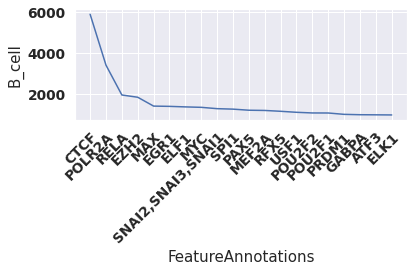

CD14+_monocyte


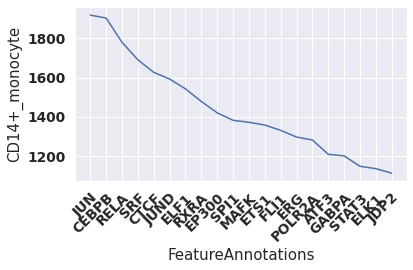

CD16+_monocyte


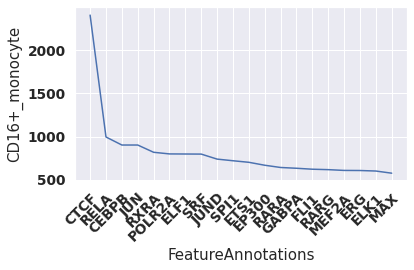

CD4+_T_cell


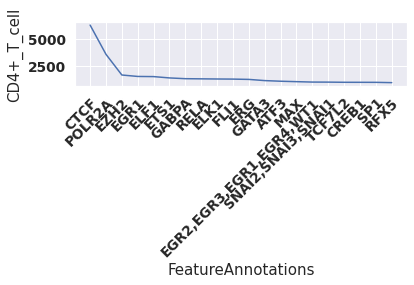

Cytotoxic_T_cell


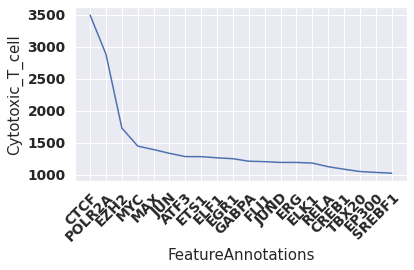

Dendritic_cell


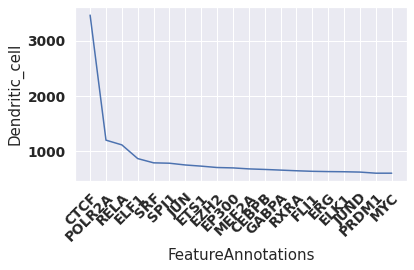

Natural_killer_cell


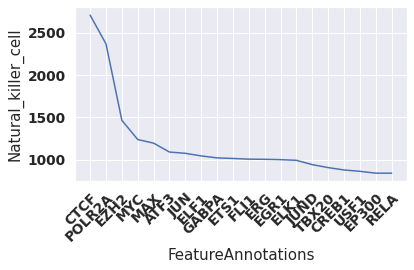

In [51]:
for cell_type in df_counts.index:
    print(cell_type)
    df_sub = df_counts.loc[cell_type].sort_values(ascending=False)
    g = sns.lineplot(data=df_sub[0:20])
    plt.xticks(rotation=45, rotation_mode="anchor", ha="right")
    plt.tight_layout()
    plt.savefig(
        f"cistarget/plots_cell_type/{cell_type}__ALL__top20motifsbyoccurrence.png",
        dpi=150,
        facecolor="white",
    )
    plt.show()
    plt.close()

In [52]:
df.groupby(["#GeneSignatureID"]).median()

,Rank,AUC,NES,rank_within_GeneSignatureID
#GeneSignatureID,,,,
BIO_ddseq_1.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed,4451.5,0.005960,0.606436,4396.5
BIO_ddseq_1.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed,4543.0,0.004698,0.427429,4451.0
BIO_ddseq_1.FIXEDCELLS__CD4+_T_cell__DARs.TOP2k.ENCODE3_overlap.bed,4648.0,0.006443,0.666169,4581.0
BIO_ddseq_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed,4910.5,0.005645,0.597928,4807.5
BIO_ddseq_1.FIXEDCELLS__Dendritic_cell__DARs.TOP2k.ENCODE3_overlap.bed,4873.0,0.004580,0.470191,4717.0
...,...,...,...,...
VIB_hydrop_1.FIXEDCELLS__Cytotoxic_T_cell__DARs.TOP2k.ENCODE3_overlap.bed,4801.5,0.006199,0.602269,4716.5
VIB_hydrop_2.FIXEDCELLS__B_cell__DARs.TOP2k.ENCODE3_overlap.bed,4835.5,0.005998,0.625524,4744.5
VIB_hydrop_2.FIXEDCELLS__CD14+_monocyte__DARs.TOP2k.ENCODE3_overlap.bed,4655.0,0.003590,0.419569,4480.0


# Ridge plot for NES scores

only plot top 50, otherwise the distributions are indistinguishable 

In [53]:
order = [
    "10xv1",
    "10xv11",
    "10xv11c",
    "10xv2",
    "10xmultiome",
    "mtscatac",
    "mtscatacfacs",
    "ddseq",
    "s3atac",
    "hydrop",
]

In [54]:
df_top50

,#GeneSignatureID,Rank,FeatureID,FeatureDescription,FeatureAnnotations,FeatureDatabase,AUC,NES,CandidateTargetIDs,TopTargetIDs,TopTargetRanks,sample,cell_type,sample__cell_type,tech,rank_within_GeneSignatureID
0,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,1,taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,SPIB [ETS],SPIB,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.029930,13.902882,chr10:17771014-17771352;chr17:74809024-7480935...,chr10:17771014-17771352;chr17:74809024-7480935...,55;196;221;296;424;462;463;467;542;547;652;745...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,1.0
1,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,2,taipale_cyt_meth__SPIB_RAWWGRGGAAGTN_FL_meth,"SPIB [ETS, CpG-meth]",SPIB,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.027094,12.446126,chr17:74809024-74809352;chr10:17771014-1777135...,chr17:74809024-74809352;chr10:17771014-1777135...,139;154;210;311;349;389;408;452;557;610;641;73...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,2.0
2,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,3,cisbp__M6485,"SPIB[gene ID: ""ENSG00000142539"" species: ""Homo...",NaN,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.025550,11.653176,chr10:17771014-17771352;chr2:40450021-40450370...,chr10:17771014-17771352;chr2:40450021-40450370...,59;335;369;421;454;458;465;517;851;877;897;934...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,3.0
3,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,4,transfac_pro__M01203,V$SPI1_01: SPI1 (PU1),SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.025418,11.585805,chr10:17771014-17771352;chr4:73181276-73181619...,chr10:17771014-17771352;chr4:73181276-73181619...,28;130;141;146;181;261;346;359;462;554;901;947...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,4.0
4,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte__...,5,cisbp__M6119,"SPI1[gene ID: ""ENSG00000066336"" species: ""Homo...",SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.025369,11.560518,chr4:73181276-73181619;chr8:60332971-60333311;...,chr4:73181276-73181619;chr8:60332971-60333311;...,124;190;314;324;498;500;522;609;694;728;817;91...,VIB_10xmultiome_1.FIXEDCELLS,CD14+_monocyte,VIB_10xmultiome_1.FIXEDCELLS__CD14+_monocyte,10xmultiome,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2604612,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,46,taipale_cyt_meth__ELF5_NANNAGGAAGTN_eDBD_meth,"ELF5 [ETS, CpG-meth]",ELF5,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.016181,8.093512,chr6:154341310-154341657;chr4:105014271-105014...,chr6:154341310-154341657;chr4:105014271-105014...,497;512;553;576;737;753;761;807;1044;1077;1168...,CNA_10xv11c_1.FIXEDCELLS,CD14+_monocyte,CNA_10xv11c_1.FIXEDCELLS__CD14+_monocyte,10xv11c,46.0
2604613,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,47,cisbp__M4631,"SPI1[gene ID: ""ENSG00000066336"" species: ""Homo...",SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.016146,8.072700,chr20:8271771-8272119;chr5:72937795-72938131;c...,chr20:8271771-8272119;chr5:72937795-72938131;c...,95;99;154;234;782;832;957;1115;1434;1702;1876;...,CNA_10xv11c_1.FIXEDCELLS,CD14+_monocyte,CNA_10xv11c_1.FIXEDCELLS__CD14+_monocyte,10xv11c,47.0
2604614,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,48,dbcorrdb__SPI1__ENCSR000BGW_1__m1,"SPI1 (ENCSR000BGW-1, motif 1)",SPI1,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.016090,8.039129,chr6:162712757-162712969;chr5:72937795-7293813...,chr6:162712757-162712969;chr5:72937795-7293813...,118;291;356;525;575;582;583;633;675;721;923;10...,CNA_10xv11c_1.FIXEDCELLS,CD14+_monocyte,CNA_10xv11c_1.FIXEDCELLS__CD14+_monocyte,10xv11c,48.0
2604615,CNA_10xv11_4.FIXEDCELLS__CD14+_monocyte__DARs....,49,hocomoco__NFIL3_HUMAN.H11MO.0.D,NFIL3_HUMAN,NFIL3,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.015958,7.9

In [55]:
df_top50 = df_top50.set_index("tech")
df_top50.loc[order]

,#GeneSignatureID,Rank,FeatureID,FeatureDescription,FeatureAnnotations,FeatureDatabase,AUC,NES,CandidateTargetIDs,TopTargetIDs,TopTargetRanks,sample,cell_type,sample__cell_type,rank_within_GeneSignatureID
tech,,,,,,,,,,,,,,,
10xv1,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell__DARs...,1,cisbp__M5895,"TBX2[gene ID: ""ENSG00000121068"" species: ""Homo...",TBX2,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.047389,15.544706,chr17:78474702-78475046;chr14:62097909-6209816...,chr17:78474702-78475046;chr14:62097909-6209816...,10;86;102;103;121;152;155;181;252;271;284;307;...,VIB_10xv1_1.FIXEDCELLS,Cytotoxic_T_cell,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell,1.0
10xv1,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell__DARs...,2,taipale__TBX2_full_NAGGTGTGAWN,TBX2 monomeric TBX full,TBX2,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.046361,15.179572,chr17:78474702-78475046;chr14:62097909-6209816...,chr17:78474702-78475046;chr14:62097909-6209816...,10;81;98;105;121;136;139;144;257;277;282;296;2...,VIB_10xv1_1.FIXEDCELLS,Cytotoxic_T_cell,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell,2.0
10xv1,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell__DARs...,3,cisbp__M1632,"Eomes[gene ID: ""ENSMUSG00000032446"" species: ""...",EOMES,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.045958,15.036378,chr17:78474702-78475046;chr14:101713526-101713...,chr17:78474702-78475046;chr14:101713526-101713...,79;96;98;153;159;315;371;390;392;446;456;479;4...,VIB_10xv1_1.FIXEDCELLS,Cytotoxic_T_cell,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell,3.0
10xv1,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell__DARs...,4,cisbp__M1635,M1635,NaN,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.045880,15.008694,chr17:78474702-78475046;chr9:91798540-91798745...,chr17:78474702-78475046;chr9:91798540-91798745...,24;107;167;171;175;181;200;237;259;262;285;338...,VIB_10xv1_1.FIXEDCELLS,Cytotoxic_T_cell,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell,4.0
10xv1,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell__DARs...,5,cisbp__M1631,"FBgn0261963[gene ID: ""FBgn0261963"" species: ""D...",TBX20,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.045800,14.980148,chr17:78474702-78475046;chr9:91798540-91798745...,chr17:78474702-78475046;chr9:91798540-91798745...,32;110;130;148;162;180;224;246;257;289;292;298...,VIB_10xv1_1.FIXEDCELLS,Cytotoxic_T_cell,VIB_10xv1_1.FIXEDCELLS__Cytotoxic_T_cell,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hydrop,EPF_hydrop_3.FIXEDCELLS__CD4+_T_cell__DARs.TOP...,46,swissregulon__hs__RUNX1..3.p2,hs__RUNX1..3.p2,"RUNX2,RUNX3,RUNX1",CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.014230,5.098221,chr13:49496948-49497297;chr13:73228614-7322896...,chr13:49496948-49497297;chr13:73228614-7322896...,94;277;395;569;612;878;952;991;1255;1434;1498;...,EPF_hydrop_3.FIXEDCELLS,CD4+_T_cell,EPF_hydrop_3.FIXEDCELLS__CD4+_T_cell,46.0
hydrop,EPF_hydrop_3.FIXEDCELLS__CD4+_T_cell__DARs.TOP...,47,cisbp__M5896,"TBX4[gene ID: ""ENSG00000121075"" species: ""Homo...",TBX4,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.014223,5.094522,chr9:91798282-91798538;chr7:603618-603963;chr1...,chr9:91798282-91798538;chr7:603618-603963;chr1...,68;108;178;190;312;479;493;501;624;663;670;730...,EPF_hydrop_3.FIXEDCELLS,CD4+_T_cell,EPF_hydrop_3.FIXEDCELLS__CD4+_T_cell,47.0
hydrop,EPF_hydrop_3.FIXEDCELLS__CD4+_T_cell__DARs.TOP...,48,dbcorrdb__BCL11A__ENCSR000BHA_1__m2,"BCL11A (ENCSR000BHA-1, motif 2)",BCL11A,CTX_hg38_SCREEN3_1kb_bg_with_mask.regions_vs_m...,0.014163,5.064671,chr8:144687747-144688095;chr9:136997846-136998...,chr8:144687747-144688095;chr9:136997846-136998...,5;341;552;594;653;744;919;1096;1190;1549;1579;...,EPF_hydrop_3.FIXEDCELLS,CD4+_T_cell,EPF_hydrop_3.FIXEDCELLS__CD4+_T_cell,48.0


In [56]:
df_top50["tech"] = df_top50.index

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(font_scale=1.5)
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-0.25, light=0.7)
g = sns.FacetGrid(
    df_top50, row="tech", hue="tech", aspect=15, height=0.5, palette=pal, xlim=[3, 18]
)

# Draw the densities in a few steps
g.map(
    sns.kdeplot,
    "NES",
    bw_adjust=0.5,
    clip_on=False,
    clip=[3, 18],
    fill=True,
    alpha=1,
    linewidth=1.5,
)
g.map(sns.kdeplot, "NES", clip_on=False, color="w", lw=2, bw_adjust=0.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(
        -0.01,
        0.2,
        label,
        fontweight="bold",
        color=color,
        ha="right",
        va="center",
        transform=ax.transAxes,
    )


g.map(label, x="NES")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-0.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
# g.xlim([0, 15])
g.despine(bottom=True, left=True)
plt.tight_layout()
plt.savefig("plots_pub/nes_ridgeplot.png", dpi=300, facecolor="white")

# Plot the "best" motifs, without prefiltering for common motifs

In [57]:
median_nes_df = pd.pivot_table(
    df,
    index="cell_type",
    columns="FeatureID",
    values="NES",
    aggfunc="median",
    dropna=False,
)

In [58]:
median_nes_df

FeatureID,bergman__Abd-B,bergman__Adf1,bergman__Aef1,bergman__Cf2,bergman__Dip3,bergman__Dref,bergman__EcR_usp,bergman__Eip74EF,bergman__Hr46,bergman__Kr,...,yetfasco__YPR015C_871,yetfasco__YPR022C_588,yetfasco__YPR052C_879,yetfasco__YPR054W_1875,yetfasco__YPR065W_1396,yetfasco__YPR086W_1327,yetfasco__YPR104C_2203,yetfasco__YPR186C_1321,yetfasco__YPR196W_861,yetfasco__YPR199C_603
cell_type,,,,,,,,,,,,,,,,,,,,,
B_cell,0.886693,0.403442,0.519267,0.529079,0.289987,0.240158,0.134701,0.828006,0.296977,0.088770,...,0.148407,1.214663,0.581475,0.082152,1.441888,0.314683,0.156504,0.268100,0.183390,1.294829
CD14+_monocyte,0.136024,0.374372,0.671622,0.273019,0.259036,0.172402,0.519845,2.612550,0.581717,0.392974,...,0.149878,0.359929,0.156899,0.301414,0.303197,0.151387,0.379036,0.219602,0.370062,0.477818
CD16+_monocyte,0.058626,0.115274,0.177054,0.214333,0.196076,0.338614,0.552178,3.101735,0.473005,0.049637,...,0.547174,0.597268,0.420117,0.380070,0.172440,0.294814,0.235648,0.318449,0.171635,0.225243
CD4+_T_cell,0.150881,0.327029,0.347964,0.490049,0.359664,0.147654,0.366972,0.908942,1.046389,0.427525,...,0.052883,0.627535,0.476331,0.191572,0.520298,0.277059,0.497361,0.266743,0.507608,0.227198
Cytotoxic_T_cell,0.036333,0.377242,0.074550,0.133084,0.563744,0.205078,0.294225,0.554837,0.128802,0.190116,...,0.552640,1.643779,0.324354,0.152456,0.383810,0.230042,0.650721,0.560030,0.500634,0.234984
Dendritic_cell,0.103672,0.210911,0.527354,0.376071,0.290262,0.195507,0.500466,2.580489,0.333736,0.163923,...,0.069466,0.573034,0.290094,0.233792,0.079116,0.150037,0.109382,0.600284,0.174729,0.309032
Natural_killer_cell,0.118969,0.274363,0.493645,0.098769,0.522625,0.229096,0.252282,0.664001,0.220224,0.081531,...,0.135725,1.422824,0.320372,0.176259,0.183550,0.222449,0.455555,0.575922,0.275648,0.269070


Create a translation df to determine the motif from the featureID:

In [59]:
translation_df = df.drop_duplicates(subset="FeatureID")[
    ["FeatureID", "FeatureAnnotations"]
].set_index(
    "FeatureID"
)  # .to_dict()

For each cell type, rank by median NES score and add annotation based on translation df, and drop the duplicates, keeping the highest NES score motif  
note that some annotation is Nan, this is replaced by a unique identifier to avoid dropping non-annotated motifs because they are "duplicated"

In [60]:
from IPython.display import Image
from IPython.core.display import HTML

In [63]:
split_df = pd.DataFrame(df.groupby(["cell_type", "sample"])["FeatureID"].unique())

In [64]:
split_df

FeatureID
cell_type           sample                                                                          
B_cell              BIO_ddseq_1.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, cisbp__M4489,...
                    BIO_ddseq_2.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, cisbp__M4489,...
                    BIO_ddseq_3.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, cisbp__M4489,...
                    BIO_ddseq_4.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, factorbook__P...
                    BRO_mtscatacfacs_1.FIXEDCELLS  [factorbook__PU1, cisbp__M4489, hocomoco__IRF4...
...                                                                                              ...
Natural_killer_cell VIB_10xmultiome_2.FIXEDCELLS   [cisbp__M5895, taipale__TBX2_full_NAGGTGTGAWN,...
                    VIB_10xv1_1.FIXEDCELLS         [cisbp__M5895, cisbp__M1631, taipale__TBX2_ful...
                    VIB_10xv1_2.FIXEDCELLS         [cisbp__M1631, cisbp__M1622, cisbp__M1635, cis...
                    VIB_10xv2_1.FIXEDCELLS         [cisbp__M1631, cisbp__M1632, cisbp__M1635, tra...
                    VIB_10xv2_2.FIXEDCELLS         [cisbp__M5895, taipale__TBX2_full_NAGGTGTGAWN,...

[270 rows x 1 columns]

In [65]:
good_samples = [
    "BIO_ddseq_1.FIXEDCELLS",
    "BIO_ddseq_2.FIXEDCELLS",
    "BIO_ddseq_3.FIXEDCELLS",
    "BIO_ddseq_4.FIXEDCELLS",
    "BRO_mtscatacfacs_1.FIXEDCELLS",
    "BRO_mtscatacfacs_2.FIXEDCELLS",
    "CNA_10xmultiome_1.FIXEDCELLS",
    "CNA_10xmultiome_2.FIXEDCELLS",
    "CNA_10xv11_1.FIXEDCELLS",
    "CNA_10xv11_2.FIXEDCELLS",
    "CNA_10xv11_3.FIXEDCELLS",
    "CNA_10xv11c_1.FIXEDCELLS",
    "CNA_10xv11c_2.FIXEDCELLS",
    "CNA_10xv2_1.FIXEDCELLS",
    "CNA_10xv2_2.FIXEDCELLS",
    "CNA_hydrop_1.FIXEDCELLS",
    "CNA_hydrop_2.FIXEDCELLS",
    "CNA_hydrop_3.FIXEDCELLS",
    "CNA_mtscatac_1.FIXEDCELLS",
    "CNA_mtscatac_2.FIXEDCELLS",
    "EPF_hydrop_1.FIXEDCELLS",
    "EPF_hydrop_2.FIXEDCELLS",
    "EPF_hydrop_3.FIXEDCELLS",
    "EPF_hydrop_4.FIXEDCELLS",
    "HAR_ddseq_1.FIXEDCELLS",
    "HAR_ddseq_2.FIXEDCELLS",
    "MDC_mtscatac_1.FIXEDCELLS",
    "MDC_mtscatac_2.FIXEDCELLS",
    "OHS_s3atac_1.FIXEDCELLS",
    "OHS_s3atac_2.FIXEDCELLS",
    "SAN_10xmultiome_1.FIXEDCELLS",
    "SAN_10xmultiome_2.FIXEDCELLS",
    "STA_10xv11_1.FIXEDCELLS",
    "STA_10xv11_2.FIXEDCELLS",
    "TXG_10xv11_1.FIXEDCELLS",
    "TXG_10xv2_1.FIXEDCELLS",
    "TXG_10xv2_2.FIXEDCELLS",
    "UCS_ddseq_1.FIXEDCELLS",
    "UCS_ddseq_2.FIXEDCELLS",
    "VIB_10xmultiome_1.FIXEDCELLS",
    "VIB_10xmultiome_2.FIXEDCELLS",
    "VIB_10xv1_1.FIXEDCELLS",
    "VIB_10xv1_2.FIXEDCELLS",
    "VIB_10xv2_1.FIXEDCELLS",
    "VIB_10xv2_2.FIXEDCELLS",
    "VIB_hydrop_1.FIXEDCELLS",
    "VIB_hydrop_2.FIXEDCELLS",
]

In [66]:
common_motifs = {}
for cell_type in split_df.index.get_level_values(0).unique():
    set_list = []
    # for sample in split_df.loc['B_cell']:
    print(cell_type)
    for sample in good_samples:
        # print(sample)
        if sample in split_df.loc[cell_type].index:
            motifs_set = set(split_df.loc[cell_type].loc[sample]["FeatureID"])
            set_list.append(motifs_set)
        else:
            print(f"\t{sample} not in index for {cell_type}")

    intersection = set.intersection(*set_list)
    # print(set.intersection(*set_list))
    print(len(intersection))
    common_motifs[cell_type] = set.intersection(*set_list)

B_cell
	CNA_hydrop_1.FIXEDCELLS not in index for B_cell
	CNA_hydrop_3.FIXEDCELLS not in index for B_cell
158
CD14+_monocyte
417
CD16+_monocyte
	BIO_ddseq_1.FIXEDCELLS not in index for CD16+_monocyte
	BIO_ddseq_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xmultiome_1.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xmultiome_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xv11_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xv11_3.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xv11c_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_hydrop_1.FIXEDCELLS not in index for CD16+_monocyte
	CNA_hydrop_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_hydrop_3.FIXEDCELLS not in index for CD16+_monocyte
	CNA_mtscatac_1.FIXEDCELLS not in index for CD16+_monocyte
	CNA_mtscatac_2.FIXEDCELLS not in index for CD16+_monocyte
	EPF_hydrop_1.FIXEDCELLS not in index for CD16+_monocyte
	EPF_hydrop_2.FIXEDCELLS not in index for CD16+_monocyte
	EPF_hydrop_4.FIXEDCELLS not in index for CD16

In [67]:
top_n_toshow = 10
display_im = False
for cell_type in common_motifs.keys():
    print(cell_type)
    common_motifs_ranked_by_nes_df = pd.DataFrame(
        median_nes_df[list(common_motifs[cell_type])]
        .loc[cell_type]
        .sort_values(ascending=False)
    )
    common_motifs_ranked_by_nes_df["FeatureAnnotations"] = translation_df
    print(f"\t{len(common_motifs_ranked_by_nes_df)} common motifs")
    n_nan = common_motifs_ranked_by_nes_df.FeatureAnnotations.isna().sum()
    print(
        f"\t{n_nan} non-annotated motifs ({round(n_nan/len(common_motifs_ranked_by_nes_df)*100, 2)}%)"
    )
    nan_list = ["nan_" + str(x) for x in range(n_nan)]
    print("\treplacing non-annotated motifs by 'nan_x'")
    common_motifs_ranked_by_nes_df.loc[
        common_motifs_ranked_by_nes_df.FeatureAnnotations.isna(), "FeatureAnnotations"
    ] = nan_list

    print("\tdropping duplicates")
    common_motifs_ranked_by_nes_df = common_motifs_ranked_by_nes_df.drop_duplicates(
        subset="FeatureAnnotations", keep="first"
    )

    for motif in common_motifs_ranked_by_nes_df.index[:top_n_toshow]:
        nes = common_motifs_ranked_by_nes_df.loc[motif][cell_type]
        featureannotation = common_motifs_ranked_by_nes_df.loc[motif][
            "FeatureAnnotations"
        ]
        print(f"\t\t{featureannotation}\t{nes}\t{motif}")
        motif_url = f"https://motifcollections.aertslab.org/v9/logos/{motif}.png"
        if display_im == True:
            display(Image(url=motif_url))
            # print(motif_url)

B_cell
	158 common motifs
	38 non-annotated motifs (24.05%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPI1	16.15043126	cisbp__M4489
		IRF4	13.31478676	hocomoco__IRF4_MOUSE.H11MO.0.A
		EP300	12.33088609	dbcorrdb__EP300__ENCSR000DZG_1__m1
		IKZF1	8.102881384	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1
		MTA3	6.87893008	dbcorrdb__MTA3__ENCSR000BRH_1__m1
		SPI1,E2F1	6.497121081	tfdimers__MD00015
		SPIC	6.363865187	cisbp__M5865
		STAT2	5.955399644	dbcorrdb__STAT2__ENCSR000FBC_1__m1
		STAT2,STAT1	5.73638266	factorbook__STAT2
		RELA	4.982056537	dbcorrdb__RELA__ENCSR000EBA_1__m2
CD14+_monocyte
	417 common motifs
	48 non-annotated motifs (11.51%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		nan_0	9.494804106	cisbp__M6485
		SPI1	9.110609041	transfac_pro__M01203
		SPIB	8.316415629	taipale_cyt_meth__SPIB_RWWGSGGAAGTN_eDBD_repr
		CEBPB	8.278137555	transfac_pro__M07080
		nan_1	7.747044005	cisbp__M5864
		CEBPD	6.93842583	taipale_cyt_meth__CEBPD_NRTTGCGYAAYN_eDBD
		

In [68]:
top_n_toshow = 30
display_im = True
for cell_type in common_motifs.keys():
    print(cell_type)
    common_motifs_ranked_by_nes_df = pd.DataFrame(
        median_nes_df[list(common_motifs[cell_type])]
        .loc[cell_type]
        .sort_values(ascending=False)
    )
    common_motifs_ranked_by_nes_df["FeatureAnnotations"] = translation_df
    print(f"\t{len(common_motifs_ranked_by_nes_df)} common motifs")
    n_nan = common_motifs_ranked_by_nes_df.FeatureAnnotations.isna().sum()
    print(
        f"\t{n_nan} non-annotated motifs ({round(n_nan/len(common_motifs_ranked_by_nes_df)*100, 2)}%)"
    )
    nan_list = ["nan_" + str(x) for x in range(n_nan)]
    print("\treplacing non-annotated motifs by 'nan_x'")
    common_motifs_ranked_by_nes_df.loc[
        common_motifs_ranked_by_nes_df.FeatureAnnotations.isna(), "FeatureAnnotations"
    ] = nan_list

    print("\tdropping duplicates")
    common_motifs_ranked_by_nes_df = common_motifs_ranked_by_nes_df.drop_duplicates(
        subset="FeatureAnnotations", keep="first"
    )

    for motif in common_motifs_ranked_by_nes_df.index[:top_n_toshow]:
        nes = common_motifs_ranked_by_nes_df.loc[motif][cell_type]
        featureannotation = common_motifs_ranked_by_nes_df.loc[motif][
            "FeatureAnnotations"
        ]
        print(f"\t\t{featureannotation}\t{nes}\t{motif}")
        motif_url = f"https://motifcollections.aertslab.org/v9/logos/{motif}.png"
        if display_im == True:
            display(Image(url=motif_url))
            # print(motif_url)

B_cell
	158 common motifs
	38 non-annotated motifs (24.05%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPI1	16.15043126	cisbp__M4489


		IRF4	13.31478676	hocomoco__IRF4_MOUSE.H11MO.0.A


		EP300	12.33088609	dbcorrdb__EP300__ENCSR000DZG_1__m1


		IKZF1	8.102881384	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1


		MTA3	6.87893008	dbcorrdb__MTA3__ENCSR000BRH_1__m1


		SPI1,E2F1	6.497121081	tfdimers__MD00015


		SPIC	6.363865187	cisbp__M5865


		STAT2	5.955399644	dbcorrdb__STAT2__ENCSR000FBC_1__m1


		STAT2,STAT1	5.73638266	factorbook__STAT2


		RELA	4.982056537	dbcorrdb__RELA__ENCSR000EBA_1__m2


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1,SIRT6	4.857664865	tfdimers__MD00044


		BCL11A	4.35737634	hocomoco__BC11A_HUMAN.H11MO.0.A


		PAX2	4.271555072	taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY


		ERF,FIGLA	4.254884919	taipale_tf_pairs__ERF_FIGLA_RSCGGAANCASCTGNN_CAP_repr


		ASCL2,ASCL1	3.993345665	cisbp__M4724


		PAX5	3.971691137	cisbp__M5707


		FLI1,FIGLA	3.944287523	taipale_tf_pairs__FLI1_FIGLA_RSCGGAANCASSTGN_CAP


		TCF4,TCF3,TCF12	3.881332277	cisbp__M5063


		nan_0	3.854468144	elemento__CACCTGC


		TCF4	3.840840268	taipale__TCF4_DBD_NNCACCTGNN


		SNAI2	3.823229628	hocomoco__SNAI2_HUMAN.H11MO.0.A


		nan_1	3.799617864	flyfactorsurvey__l_1_sc_da_SANGER_5_FBgn0000413


		TCF12	3.730327982	taipale_cyt_meth__TCF12_NCACSTGN_eDBD_meth


		HAND2	3.640380348	taipale_cyt_meth__HAND2_AACACCTGYN_eDBD_meth_repr


		SNAI2,SNAI3,SNAI1	3.489586926	stark__RRCAGGTGB


		TCF3	3.40570108	homer__NNCACCTGCN_E2A


		ID4	3.321436115	taipale__ID4_DBD_NRCACCTGNN_repr


		ASCL1	3.280704046	hocomoco__ASCL1_HUMAN.H11MO.0.A


		ETV5,FIGLA	3.260600986	taipale_tf_pairs__ETV5_FIGLA_RSCGGAARCAGGTGN_CAP


		nan_2	3.155998601	elemento__ACTTCCTC


CD14+_monocyte
	417 common motifs
	48 non-annotated motifs (11.51%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		nan_0	9.494804106	cisbp__M6485


		SPI1	9.110609041	transfac_pro__M01203


		SPIB	8.316415629	taipale_cyt_meth__SPIB_RWWGSGGAAGTN_eDBD_repr


		CEBPB	8.278137555	transfac_pro__M07080


		nan_1	7.747044005	cisbp__M5864


		CEBPD	6.93842583	taipale_cyt_meth__CEBPD_NRTTGCGYAAYN_eDBD


		SPIC	6.824369867	cisbp__M6096


		CEBPG	6.731250995	taipale_cyt_meth__CEBPG_NRTTGCGYAAYN_eDBD


		ETS1,YY1	6.698310885	tfdimers__MD00012


		SPIB,TEAD4	5.899731356	taipale_tf_pairs__TEAD4_SPIB_RGAATGCGGAAGTN_CAP_1


		EP300	5.869529857	dbcorrdb__EP300__ENCSR000EDV_1__m3


		TAF7,SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,TBP,ELF1,GABPA,ELF2,ELF4,ETS1	5.055193364	tfdimers__MD00018


		nan_2	4.789334702	flyfactorsurvey__CG32830_SANGER_10_FBgn0052830


		MYC	4.774529862	dbcorrdb__MYC__ENCSR000DOM_1__m3


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1	4.726597796	transfac_pro__M00971


		HSF1	4.532790363	transfac_pro__M04761


		nan_3	4.486822607	cisbp__M4847


		EHF	4.481481102	cisbp__M0696


		ATF5,NKX3-2	4.415988538	tfdimers__MD00581


		ETV4	4.40548202	transfac_pro__M03579


		ELF5	4.335429259	taipale__ELF5_DBD_ACCCGGAAGTN


		HLF	4.305459187	transfac_public__M00260


		ERG	4.292739212	cisbp__M2276


		PURA,ETS1	4.267063892	tfdimers__MD00398


		TEF	4.232715636	transfac_pro__M07439


		NFIL3	4.167881063	cisbp__M5663


		FOSB	4.129019722	transfac_pro__M08936


		FEV,ETV2,FLI1,ETS2,ERF,ERG,GABPA,ETS1	4.086973199	transfac_pro__M08881


		JUNB	4.070092392	hocomoco__JUNB_MOUSE.H11MO.0.A


		CEBPB,JUN	4.060697346	homer__NATGTTGCAA_CEBP_AP1


CD16+_monocyte
	691 common motifs
	114 non-annotated motifs (16.5%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPIB	17.488259345000003	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


		nan_0	14.26358244	cisbp__M6485


		SPI1	13.9234716	transfac_pro__M01203


		nan_1	12.680810965	cisbp__M5864


		SPIC	10.803247075	cisbp__M5865


		ETS1,YY1	10.458716429999999	tfdimers__MD00012


		SPI1,IRF4	9.8333884105	factorbook__PU1


		SPIB,TEAD4	9.7999142445	taipale_tf_pairs__TEAD4_SPIB_RGAATGCGGAAGTN_CAP_1


		nan_2	9.428112566500001	elemento__ACTTCCTC


		ELF5	9.158421167	taipale_cyt_meth__ELF5_NANNAGGAAGTN_FL_meth


		ELF4	8.9992568545	taipale_cyt_meth__ELF4_NATGCGGAAGTN_eDBD_meth


		nan_3	8.9674609675	predrem__nrMotif551


		EP300	8.5499711535	dbcorrdb__EP300__ENCSR000DZG_1__m1


		TAF7,SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,TBP,ELF1,GABPA,ELF2,ELF4,ETS1	8.450086912	tfdimers__MD00018


		ELF2	8.2235860535	taipale_cyt_meth__ELF2_NATGCGGAAGTN_eDBD_meth


		IRF4	8.214048659	hocomoco__IRF4_HUMAN.H11MO.0.A


		BCL11A	7.955401002	cisbp__M4453


		ELF3	7.846243811000001	hocomoco__ELF3_HUMAN.H11MO.0.A


		ELF1	7.8001713565	transfac_pro__M00746


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1,SIRT6	7.2736092155000005	tfdimers__MD00044


		IRF8	7.143829328	hocomoco__IRF8_HUMAN.H11MO.0.B


		ATF5,NKX3-2	7.104599347000001	tfdimers__MD00581


		IKZF1	7.0242739055	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1


		GABPA,NKX2-1	6.789045921	tfdimers__MD00204


		PAX4,GABPA	6.688907673499999	tfdimers__MD00097


		nan_4	6.534767441	flyfactorsurvey__CG32830_SANGER_10_FBgn0052830


		nan_5	6.36041414	cisbp__M1908


		NKX3-2,IKZF2	6.318425060499999	tfdimers__MD00029


		RELA	6.2260715525000005	dbcorrdb__RELA__ENCSR000EAQ_1__m2


		nan_6	6.2207357954999996	cisbp__M4847


CD4+_T_cell
	270 common motifs
	20 non-annotated motifs (7.41%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		TCF7	9.008507436999999	hocomoco__TCF7_HUMAN.H11MO.0.A


		LEF1	7.70394678	cisbp__M1587


		ERG	5.334238255	taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth


		FLI1	4.769583924	taipale_cyt_meth__FLI1_NACMGGAARTN_eDBD_meth


		FOXO1,FLI1	4.6593502935	taipale_tf_pairs__FOXO1_FLI1_RTMAACAGGAAGTN_CAP


		ETS1	4.4723090135	transfac_pro__M07211


		TCF7L1	4.190454233500001	transfac_pro__M08901


		FOXO1,ETV4	4.1809148025	taipale_tf_pairs__FOXO1_ETV4_RCCGGAWGTKKN_CAP


		ELK3,FOXO1	4.1710106515	taipale_tf_pairs__FOXO1_ELK3_RTMAACAGGAAGTN_CAP


		ETS2,ETS1	4.154978807499999	swissregulon__hs__ETS1_2.p2


		ETV1	3.7609388115	taipale_cyt_meth__ETV1_NACMGKAWGTN_FL_meth


		ETS2	3.6938814065	transfac_pro__M02064


		nan_0	3.630986159	transfac_pro__M01286


		ETV4	3.516817288	taipale_cyt_meth__ETV4_NRCMGGAAGTN_FL_meth


		ELK4	3.489318291	transfac_pro__M03844


		GABPA	3.4391369385	transfac_pro__M08917


		ETV2	3.403398352	transfac_pro__M01988


		nan_1	3.3706155725	dbcorrdb__POLR2AphosphoS5__ENCSR000BQC_1__m1


		RUNX1	3.340262385	transfac_pro__M01658


		ELK1	3.2787923914999997	cisbp__M6207


		ERF	3.2603836800000003	cisbp__M5398


		FOXO1,ELK1	3.1869983509999997	taipale_tf_pairs__FOXO1_ELK1_RSCGGATGTTRTN_CAP


		ELK3	3.108016193	taipale_cyt_meth__ELK3_NACCGGAAGTN_FL_meth_repr


		ETV1,FOXO1	3.0996022195	taipale_tf_pairs__FOXO1_ETV1_RCCGGAWGTKKN_CAP


		ELF1,FOXJ2	3.0862902119999998	taipale_tf_pairs__FOXJ2_ELF1_NWAAACAGGAAGNN_CAP


		nan_2	3.0738497540000003	transfac_pro__M00743


		FOXI1,ETV5	3.0551218865000003	taipale_tf_pairs__ETV5_FOXI1_RSCGGATGTTGN_CAP


		ETV2,FOXO6	2.979264537	taipale_tf_pairs__ETV2_FOXO6_RCCGGATGTTKWN_CAP


		ING4,FLI1	2.9457393835	tfdimers__MD00321


		ELF1	2.9420643105	cisbp__M6203


Cytotoxic_T_cell
	56 common motifs
	15 non-annotated motifs (26.79%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		TBX6	9.214962869	taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD


		TBX15	9.024545605	taipale_cyt_meth__TBX15_NAGGTGTGAN_eDBD


		TBX5	8.792801265	cisbp__M5898


		TBX4	8.578952715	taipale__TBX4_DBD_AGGTGTGA


		TBX19,T	8.475669738	transfac_pro__M07894


		EOMES	8.375799121	swissregulon__hs__EOMES.p2


		nan_0	5.676142702	cisbp__M1625


		TBX1	5.632159966	taipale_cyt_meth__TBX1_NNAGGTGTGANN_eDBD_meth


		RUNX2,RUNX3,RUNX1	4.816739258	stark__YGYGGTY


		TBX2	4.65709797	taipale_cyt_meth__TBX2_NAGGTGTGAN_eDBD_meth


		TBX21,ERF	4.119607598	taipale_tf_pairs__ERF_TBX21_TMACACCGGAAG_CAP


		TBX21,ETV2	4.089893963	taipale_tf_pairs__ETV2_TBX21_TMACACMGGAARN_CAP


		nan_1	3.977841103	scertf__fordyce.AFT2


		nan_2	3.87036668	predrem__nrMotif1283


		CREB3L1	3.122205133	hdpi__CREB3L1


		nan_3	3.121763153	cisbp__M0551


		nan_4	2.891123321	cisbp__M0490


		ELF1	2.734082347	tfdimers__MD00066


		ZXDA	2.729797077	transfac_pro__M06203


		nan_5	2.708837977	transfac_pro__M07916


		nan_6	2.495637331	cisbp__M0062


		DDX53	2.248573994	hdpi__DDX53


		nan_7	2.241263086	neph__UW.Motif.0011


		EOMES,ETV2	2.151847448	taipale_tf_pairs__ETV2_EOMES_RCCGGANNNNNNNNNNNACACCTN_CAP_repr


		FOXI1,ETV2	2.09720849	taipale_tf_pairs__ETV2_FOXI1_NRTMAACMGGAARYN_CAP


		ETV4	1.996694907	taipale_cyt_meth__ETV4_NRCMGGAAGTN_eDBD_meth


		HOXA13	1.845535988	tfdimers__MD00344


		GABPA	1.734440247	taipale_cyt_meth__GABPA_NACMGGAAGTN_eDBD_meth


		nan_8	1.667996104	stark__ACANACA


		nan_9	1.548165175	stark__ACACNNNNRCAC


Dendritic_cell
	653 common motifs
	106 non-annotated motifs (16.23%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPIB	17.27872168	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


		SPI1	16.41490439	cisbp__M4475


		SPI1,IRF4	16.272851195	factorbook__PU1


		nan_0	16.261395290000003	cisbp__M5864


		IRF4	14.272573945000001	hocomoco__IRF4_HUMAN.H11MO.0.A


		EP300	13.97478392	dbcorrdb__EP300__ENCSR000DZG_1__m1


		nan_1	13.769888745	cisbp__M6485


		SPIC	13.286437035	cisbp__M6096


		IRF8	12.106540129999999	hocomoco__IRF8_HUMAN.H11MO.0.B


		IKZF1	11.466955955	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1


		SPIB,TEAD4	11.313577375	taipale_tf_pairs__TEAD4_SPIB_RGAATGCGGAAGTN_CAP_1


		BCL11A	11.303148705	cisbp__M4453


		ETS1,YY1	10.182132055	tfdimers__MD00012


		STAT3	9.024961521000002	dbcorrdb__STAT3__ENCSR000DZV_1__m1


		TAF7,SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,TBP,ELF1,GABPA,ELF2,ELF4,ETS1	8.988081607	tfdimers__MD00018


		ELF4	8.953055600999999	taipale_cyt_meth__ELF4_NATGCGGAAGTN_eDBD_meth


		TBL1XR1	8.760171729	dbcorrdb__TBL1XR1__ENCSR000DYZ_1__m1


		nan_2	8.704949561500001	elemento__ACTTCCTC


		nan_3	8.3936614665	predrem__nrMotif551


		ELF2	8.3748743865	taipale_cyt_meth__ELF2_NATGCGGAAGTN_eDBD_meth


		ATF5,NKX3-2	8.294669162	tfdimers__MD00581


		ELF5	8.005196612999999	taipale_cyt_meth__ELF5_NANNAGGAAGTN_FL_meth


		FOXM1	7.853995267	dbcorrdb__FOXM1__ENCSR000BRU_1__m3


		ELF1	7.191724381	transfac_pro__M00746


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1,SIRT6	7.0179511555	tfdimers__MD00044


		NKX3-2,IKZF2	6.8413894135	tfdimers__MD00029


		RELA	6.770965554	dbcorrdb__RELA__ENCSR000EAQ_1__m2


		PAX4,GABPA	6.672401013	tfdimers__MD00097


		ELF3	6.609374256500001	hocomoco__ELF3_HUMAN.H11MO.0.A


		GABPA,NKX2-1	6.5854641705	tfdimers__MD00204


Natural_killer_cell
	782 common motifs
	187 non-annotated motifs (23.91%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		EOMES	14.11191318	cisbp__M1632


		TBX20	14.09268676	cisbp__M1631


		nan_0	14.00043675	cisbp__M1622


		TBX2	13.95353665	cisbp__M5895


		nan_1	13.76748713	cisbp__M1635


		TBX6	13.54004452	transfac_pro__M07899


		TBX15	13.3316209	taipale_cyt_meth__TBX15_NAGGTGTGAN_eDBD_meth


		TBX10,TBX1	12.42022299	transfac_pro__M07901


		TBX21	12.35182128	taipale_cyt_meth__TBX21_NAGGTGTGAN_eDBD


		TBX18	11.64937787	taipale_cyt_meth__TBX18_NRAGGTGTGAAN_eDBD_meth


		MGA	11.31296	cisbp__M5628


		TBX19,T	11.30096016	transfac_pro__M07894


		TBR1	11.25683923	cisbp__M5873


		nan_2	11.20506453	cisbp__M1624


		TBX4	11.14673677	cisbp__M5896


		nan_3	11.02799733	cisbp__M1634


		TBX3	10.99833065	taipale_cyt_meth__TBX3_NAGGTGTGAN_eDBD_meth


		TBX1	10.90322038	cisbp__M1628


		TBX5	10.24255993	cisbp__M1629


		T	9.220601522	hocomoco__BRAC_HUMAN.H11MO.1.B


		RUNX2	8.752935639	transfac_pro__M07276


		RUNX1	8.703581317	factorbook__RUNX1


		nan_4	8.64620137	cisbp__M1623


		RUNX2,RUNX3,RUNX1	8.1929675	transfac_pro__M08866


		RUNX3	8.078487076	hocomoco__RUNX3_MOUSE.H11MO.0.A


		CBFB	7.904981609	transfac_pro__M03841


		RUNX2,RUNX3,CBFB,RUNX1	7.167925199	transfac_pro__M00769


		TBL1XR1	6.654162162	dbcorrdb__TBL1XR1__ENCSR000DYZ_1__m2


		nan_5	6.649192172	homer__GCTGTGGTTT_RUNX-AML


		TBX2,TBX3,TBX4,TBX5	6.508847292	transfac_pro__M08900


There are still lots of duplicates. Find top 5 non-duplicated motif families for each cell type:

```
B cell
		SPI1	16.15043126	cisbp__M4489
		BCL11A	4.35737634	hocomoco__BC11A_HUMAN.H11MO.0.A
		PAX2	4.271555072	taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY
		TCF4,TCF3,TCF12	3.881332277	cisbp__M5063
		
CD16+ monocyte
		SPIB	17.488259345000003	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL
		
		
CD4+_T_cell
		TCF7	9.008507436999999	hocomoco__TCF7_HUMAN.H11MO.0.A
		ERG	5.334238255	taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth
		RUNX1	3.340262385	transfac_pro__M01658
		
Cytotoxic_T_cell
		TBX6	9.214962869	taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD
		nan_5	2.708837977	transfac_pro__M07916
		
Dendritic_cell
		SPIB	17.27872168	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL
		STAT3	9.024961521000002	dbcorrdb__STAT3__ENCSR000DZV_1__m1
		
Natural_killer_cell
		EOMES	14.11191318	cisbp__M1632
```

In [69]:
motifs_toplot_dict = {
    "B_cell": [
        "cisbp__M4489",
        "hocomoco__BC11A_HUMAN.H11MO.0.A",
        "taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY",
        "cisbp__M5063",
    ],
    "CD16+_monocyte": ["taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL"],
    "CD4+_T_cell": [
        "hocomoco__TCF7_HUMAN.H11MO.0.A",
        "taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth",
        "transfac_pro__M01658",
    ],
    "Cytotoxic_T_cell": [
        "taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD",
        "transfac_pro__M07916",
    ],
    "Dendritic_cell": [
        "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL",
        "dbcorrdb__STAT3__ENCSR000DZV_1__m1",
    ],
    "Natural_killer_cell": ["cisbp__M1632"],
}

In [70]:
nes_per_selectedmotif = pd.DataFrame()
for cell_type in motifs_toplot_dict.keys():
    print(cell_type)
    for motif in motifs_toplot_dict[cell_type]:
        print(motif)
        subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]
        subset_df = subset_df.set_index("sample")
        subset_df_nes = pd.DataFrame(subset_df["NES"])
        subset_df_nes.columns = [motif]

        nes_per_selectedmotif = pd.concat(
            [nes_per_selectedmotif, subset_df_nes], axis=1
        )

B_cell
cisbp__M4489


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


hocomoco__BC11A_HUMAN.H11MO.0.A


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


cisbp__M5063


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


CD16+_monocyte
taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


CD4+_T_cell
hocomoco__TCF7_HUMAN.H11MO.0.A


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


transfac_pro__M01658


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


Cytotoxic_T_cell
taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


transfac_pro__M07916


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


Dendritic_cell
taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


dbcorrdb__STAT3__ENCSR000DZV_1__m1


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


Natural_killer_cell
cisbp__M1632


/tmp/ipykernel_640032/2153957812.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


In [71]:
nes_per_selectedmotif

,cisbp__M4489,hocomoco__BC11A_HUMAN.H11MO.0.A,taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY,cisbp__M5063,taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,hocomoco__TCF7_HUMAN.H11MO.0.A,taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth,transfac_pro__M01658,taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD,transfac_pro__M07916,taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,dbcorrdb__STAT3__ENCSR000DZV_1__m1,cisbp__M1632
sample,,,,,,,,,,,,,
SAN_10xmultiome_2.FIXEDCELLS,15.419949,4.342645,5.503153,4.479231,16.742763,13.399453,6.280150,4.435020,12.935821,2.414936,NaN,NaN,14.971010
CNA_10xv2_1.FIXEDCELLS,15.456644,4.451235,6.911861,4.243145,11.443308,12.876863,6.395409,3.605573,13.597336,3.545142,18.639084,9.198753,15.847823
HAR_ddseq_2.FIXEDCELLS,12.427228,3.511005,4.490718,4.415721,10.978839,8.194533,5.604654,3.151412,9.333875,2.695586,NaN,NaN,9.357138
BIO_ddseq_4.FIXEDCELLS,10.777053,2.614764,2.388286,4.864366,17.894520,3.934865,3.493440,2.026410,6.368857,1.156846,6.487800,8.258106,2.463653
VIB_10xv1_2.FIXEDCELLS,17.165076,4.938693,4.689613,4.272922,18.973964,12.480422,5.549372,4.089047,12.447598,3.974586,19.557635,8.851170,15.030033
TXG_10xv2_1.FIXEDCELLS,21.310714,6.000730,3.964930,2.544673,20.760540,12.947508,6.868108,2.770363,12.960947,2.708838,20.202711,13.640441,14.341788
UCS_ddseq_1.FIXEDCELLS,20.494281,4.754923,4.476413,3.499072,NaN,9.335659,5.994471,1.769787,10.584874,3.253141,NaN,NaN,11.634751
VIB_hydrop_2.FIXEDCELLS,11.751108,3.455197,3.751266,4.229702,NaN,5.719447,6.041907,7.123623,9.109468,2.179166,NaN,NaN,NaN
OHS_s3atac_1.FIXEDCELLS,9.398436,2.064360,2.178324,2.681022,NaN,2.926408,3.951933,3.739832,8.299706,0.978781,NaN,NaN,7.990012


In [72]:
order = [
    "CNA_10xmultiome_1.FIXEDCELLS",
    "CNA_10xmultiome_2.FIXEDCELLS",
    "SAN_10xmultiome_1.FIXEDCELLS",
    "SAN_10xmultiome_2.FIXEDCELLS",
    "VIB_10xmultiome_1.FIXEDCELLS",
    "VIB_10xmultiome_2.FIXEDCELLS",
    "VIB_10xv1_1.FIXEDCELLS",
    "VIB_10xv1_2.FIXEDCELLS",
    "CNA_10xv11_1.FIXEDCELLS",
    "CNA_10xv11_2.FIXEDCELLS",
    "CNA_10xv11_3.FIXEDCELLS",
    "CNA_10xv11c_1.FIXEDCELLS",
    "CNA_10xv11c_2.FIXEDCELLS",
    "STA_10xv11_1.FIXEDCELLS",
    "STA_10xv11_2.FIXEDCELLS",
    "TXG_10xv11_1.FIXEDCELLS",
    "CNA_10xv2_1.FIXEDCELLS",
    "CNA_10xv2_2.FIXEDCELLS",
    "TXG_10xv2_1.FIXEDCELLS",
    "TXG_10xv2_2.FIXEDCELLS",
    "VIB_10xv2_1.FIXEDCELLS",
    "VIB_10xv2_2.FIXEDCELLS",
    "BIO_ddseq_1.FIXEDCELLS",
    "BIO_ddseq_2.FIXEDCELLS",
    "BIO_ddseq_3.FIXEDCELLS",
    "BIO_ddseq_4.FIXEDCELLS",
    "HAR_ddseq_1.FIXEDCELLS",
    "HAR_ddseq_2.FIXEDCELLS",
    "UCS_ddseq_1.FIXEDCELLS",
    "UCS_ddseq_2.FIXEDCELLS",
    "CNA_hydrop_1.FIXEDCELLS",
    "CNA_hydrop_2.FIXEDCELLS",
    "CNA_hydrop_3.FIXEDCELLS",
    "EPF_hydrop_1.FIXEDCELLS",
    "EPF_hydrop_2.FIXEDCELLS",
    "EPF_hydrop_3.FIXEDCELLS",
    "EPF_hydrop_4.FIXEDCELLS",
    "VIB_hydrop_1.FIXEDCELLS",
    "VIB_hydrop_2.FIXEDCELLS",
    "BRO_mtscatacfacs_1.FIXEDCELLS",
    "BRO_mtscatacfacs_2.FIXEDCELLS",
    "CNA_mtscatac_1.FIXEDCELLS",
    "CNA_mtscatac_2.FIXEDCELLS",
    "MDC_mtscatac_1.FIXEDCELLS",
    "MDC_mtscatac_2.FIXEDCELLS",
    "OHS_s3atac_1.FIXEDCELLS",
    "OHS_s3atac_2.FIXEDCELLS",
]

In [73]:
nes_per_selectedmotif = nes_per_selectedmotif.loc[order]

In [74]:
motif_alias_dict = {
    "cisbp__M4489": "B cell - SPI1",
    "hocomoco__BC11A_HUMAN.H11MO.0.A": "B cell - BCL11A",
    "taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY": "B cell - PAX2",
    "cisbp__M5063": "B cell - TCF4",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "CD16+_monocyte - SPIB",
    "hocomoco__TCF7_HUMAN.H11MO.0.A": "CD4+_T_cell - TCF7",
    "taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth": "CD4+_T_cell - ERG",
    "transfac_pro__M01658": "CD4+_T_cell - RUNX",
    "taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD": "Cytotoxic_T_cell - TBX6",
    "transfac_pro__M07916": "Cytotoxic_T_cell - ?",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "Dendritic_cell - SPIB",
    "dbcorrdb__STAT3__ENCSR000DZV_1__m1": "Dendritic_cell - STAT3",
    "cisbp__M1632": "Natural_killer_cell - EOMES",
}

In [75]:
nes_per_selectedmotif = nes_per_selectedmotif.rename(columns=motif_alias_dict)

In [76]:
nes_per_selectedmotif = nes_per_selectedmotif.round(1)

In [77]:
nes_per_selectedmotif_normalized = nes_per_selectedmotif.transform(
    lambda x: minmax_scale(x.astype(float))
)

In [78]:
nes_per_selectedmotif_normalized

,B cell - SPI1,B cell - BCL11A,B cell - PAX2,B cell - TCF4,Dendritic_cell - SPIB,CD4+_T_cell - TCF7,CD4+_T_cell - ERG,CD4+_T_cell - RUNX,Cytotoxic_T_cell - TBX6,Cytotoxic_T_cell - ?,Dendritic_cell - SPIB,Dendritic_cell - STAT3,Natural_killer_cell - EOMES
sample,,,,,,,,,,,,,
CNA_10xmultiome_1.FIXEDCELLS,0.786408,0.432432,0.568182,0.785714,NaN,0.685535,0.747475,0.337838,0.878571,0.800,0.806452,0.874016,0.893617
CNA_10xmultiome_2.FIXEDCELLS,0.733010,0.500000,0.352273,0.619048,NaN,0.490566,0.727273,0.418919,0.600000,0.525,0.683871,0.244094,0.553191
SAN_10xmultiome_1.FIXEDCELLS,0.728155,0.554054,0.454545,0.880952,0.406504,0.748428,0.585859,0.540541,0.857143,0.750,NaN,NaN,0.886525
SAN_10xmultiome_2.FIXEDCELLS,0.713592,0.554054,0.625000,0.904762,0.463415,0.842767,0.636364,0.567568,0.914286,0.600,NaN,NaN,0.886525
VIB_10xmultiome_1.FIXEDCELLS,0.752427,0.689189,0.056818,0.000000,NaN,0.452830,0.515152,0.472973,0.471429,0.400,NaN,NaN,0.432624
VIB_10xmultiome_2.FIXEDCELLS,0.834951,0.581081,0.511364,0.976190,NaN,0.666667,0.616162,0.662162,0.714286,0.950,0.316129,0.740157,0.737589
VIB_10xv1_1.FIXEDCELLS,0.873786,0.594595,0.636364,0.857143,0.829268,0.805031,0.474747,0.459459,0.900000,0.825,0.967742,0.551181,0.900709
VIB_10xv1_2.FIXEDCELLS,0.800971,0.635135,0.534091,0.857143,0.650407,0.786164,0.555556,0.527027,0.878571,1.000,0.845161,0.511811,0.886525
CNA_10xv11_1.FIXEDCELLS,0.854369,0.594595,0.806818,0.666667,0.731707,0.672956,0.848485,0.324324,0.521429,0.500,NaN,NaN,0.886525


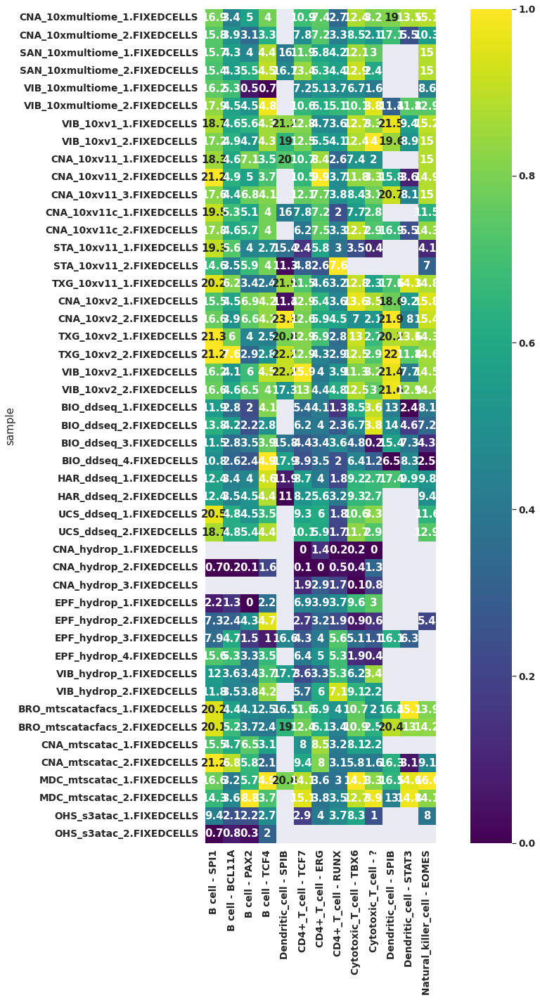

In [79]:
n_rows = len(n_dars_df)
n_cols = len(n_dars_df.columns)

f, ax = plt.subplots(figsize=(n_cols * 2, n_rows * 2))
sns.heatmap(nes_per_selectedmotif_normalized, ax=ax, square=True, cmap="viridis")
sns.heatmap(
    nes_per_selectedmotif,
    annot=True,
    ax=ax,
    fmt="g",
    square=True,
    cmap=None,
    cbar=False,
    alpha=0,
)
plt.tight_layout()
# plt.savefig("plots_pub/DAR_count_bysample.png", dpi=300, facecolor="white")

In [80]:
# bytech

In [81]:
n_dars_df = dar_path_df.pivot_table(
    index="tech", columns="cell_type", values="n_dars", aggfunc="mean"
)

In [82]:
from sklearn.preprocessing import minmax_scale

In [83]:
n_dars_df_normalized = n_dars_df.transform(lambda x: minmax_scale(x.astype(float)))

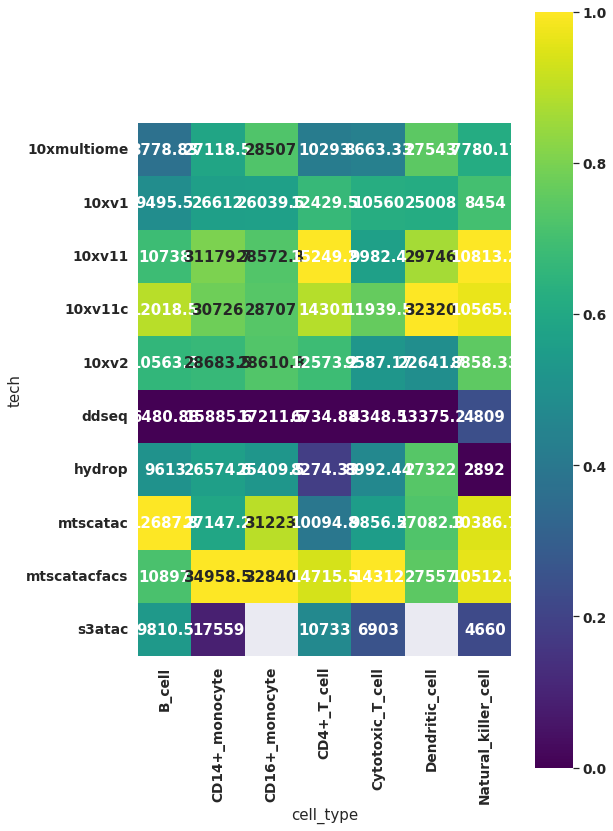

In [84]:
n_rows = len(n_dars_df)
n_cols = len(n_dars_df.columns)

f, ax = plt.subplots(figsize=(n_cols * 1.25, n_rows * 1.25))
sns.heatmap(n_dars_df_normalized, ax=ax, square=True, cmap="viridis")
sns.heatmap(
    n_dars_df, annot=True, ax=ax, fmt="g", square=True, cmap=None, cbar=False, alpha=0
)
plt.tight_layout()
# plt.savefig("plots_pub/DAR_count_mean_bytech.png", dpi=300, facecolor="white")

# repeat the above, but now for common motif only

In [85]:
split_df = pd.DataFrame(df.groupby(["cell_type", "sample"])["FeatureID"].unique())

In [86]:
split_df

FeatureID
cell_type           sample                                                                          
B_cell              BIO_ddseq_1.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, cisbp__M4489,...
                    BIO_ddseq_2.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, cisbp__M4489,...
                    BIO_ddseq_3.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, cisbp__M4489,...
                    BIO_ddseq_4.FIXEDCELLS         [hocomoco__IRF4_HUMAN.H11MO.0.A, factorbook__P...
                    BRO_mtscatacfacs_1.FIXEDCELLS  [factorbook__PU1, cisbp__M4489, hocomoco__IRF4...
...                                                                                              ...
Natural_killer_cell VIB_10xmultiome_2.FIXEDCELLS   [cisbp__M5895, taipale__TBX2_full_NAGGTGTGAWN,...
                    VIB_10xv1_1.FIXEDCELLS         [cisbp__M5895, cisbp__M1631, taipale__TBX2_ful...
                    VIB_10xv1_2.FIXEDCELLS         [cisbp__M1631, cisbp__M1622, cisbp__M1635, cis...
                    VIB_10xv2_1.FIXEDCELLS         [cisbp__M1631, cisbp__M1632, cisbp__M1635, tra...
                    VIB_10xv2_2.FIXEDCELLS         [cisbp__M5895, taipale__TBX2_full_NAGGTGTGAWN,...

[270 rows x 1 columns]

In [87]:
good_samples = [
    "BIO_ddseq_1.FIXEDCELLS",
    "BIO_ddseq_2.FIXEDCELLS",
    "BIO_ddseq_3.FIXEDCELLS",
    "BIO_ddseq_4.FIXEDCELLS",
    "BRO_mtscatacfacs_1.FIXEDCELLS",
    "BRO_mtscatacfacs_2.FIXEDCELLS",
    "CNA_10xmultiome_1.FIXEDCELLS",
    "CNA_10xmultiome_2.FIXEDCELLS",
    "CNA_10xv11_1.FIXEDCELLS",
    "CNA_10xv11_2.FIXEDCELLS",
    "CNA_10xv11_3.FIXEDCELLS",
    "CNA_10xv11c_1.FIXEDCELLS",
    "CNA_10xv11c_2.FIXEDCELLS",
    "CNA_10xv2_1.FIXEDCELLS",
    "CNA_10xv2_2.FIXEDCELLS",
    "CNA_hydrop_1.FIXEDCELLS",
    "CNA_hydrop_2.FIXEDCELLS",
    "CNA_hydrop_3.FIXEDCELLS",
    "CNA_mtscatac_1.FIXEDCELLS",
    "CNA_mtscatac_2.FIXEDCELLS",
    "EPF_hydrop_1.FIXEDCELLS",
    "EPF_hydrop_2.FIXEDCELLS",
    "EPF_hydrop_3.FIXEDCELLS",
    "EPF_hydrop_4.FIXEDCELLS",
    "HAR_ddseq_1.FIXEDCELLS",
    "HAR_ddseq_2.FIXEDCELLS",
    "MDC_mtscatac_1.FIXEDCELLS",
    "MDC_mtscatac_2.FIXEDCELLS",
    "OHS_s3atac_1.FIXEDCELLS",
    "OHS_s3atac_2.FIXEDCELLS",
    "SAN_10xmultiome_1.FIXEDCELLS",
    "SAN_10xmultiome_2.FIXEDCELLS",
    "STA_10xv11_1.FIXEDCELLS",
    "STA_10xv11_2.FIXEDCELLS",
    "TXG_10xv11_1.FIXEDCELLS",
    "TXG_10xv2_1.FIXEDCELLS",
    "TXG_10xv2_2.FIXEDCELLS",
    "UCS_ddseq_1.FIXEDCELLS",
    "UCS_ddseq_2.FIXEDCELLS",
    "VIB_10xmultiome_1.FIXEDCELLS",
    "VIB_10xmultiome_2.FIXEDCELLS",
    "VIB_10xv1_1.FIXEDCELLS",
    "VIB_10xv1_2.FIXEDCELLS",
    "VIB_10xv2_1.FIXEDCELLS",
    "VIB_10xv2_2.FIXEDCELLS",
    "VIB_hydrop_1.FIXEDCELLS",
    "VIB_hydrop_2.FIXEDCELLS",
]

In [88]:
common_motifs = {}
for cell_type in split_df.index.get_level_values(0).unique():
    set_list = []
    # for sample in split_df.loc['B_cell']:
    print(cell_type)
    for sample in good_samples:
        # print(sample)
        if sample in split_df.loc[cell_type].index:
            motifs_set = set(split_df.loc[cell_type].loc[sample]["FeatureID"])
            set_list.append(motifs_set)
        else:
            print(f"\t{sample} not in index for {cell_type}")

    intersection = set.intersection(*set_list)
    # print(set.intersection(*set_list))
    print(len(intersection))
    common_motifs[cell_type] = set.intersection(*set_list)

B_cell
	CNA_hydrop_1.FIXEDCELLS not in index for B_cell
	CNA_hydrop_3.FIXEDCELLS not in index for B_cell
158
CD14+_monocyte
417
CD16+_monocyte
	BIO_ddseq_1.FIXEDCELLS not in index for CD16+_monocyte
	BIO_ddseq_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xmultiome_1.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xmultiome_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xv11_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xv11_3.FIXEDCELLS not in index for CD16+_monocyte
	CNA_10xv11c_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_hydrop_1.FIXEDCELLS not in index for CD16+_monocyte
	CNA_hydrop_2.FIXEDCELLS not in index for CD16+_monocyte
	CNA_hydrop_3.FIXEDCELLS not in index for CD16+_monocyte
	CNA_mtscatac_1.FIXEDCELLS not in index for CD16+_monocyte
	CNA_mtscatac_2.FIXEDCELLS not in index for CD16+_monocyte
	EPF_hydrop_1.FIXEDCELLS not in index for CD16+_monocyte
	EPF_hydrop_2.FIXEDCELLS not in index for CD16+_monocyte
	EPF_hydrop_4.FIXEDCELLS not in index for CD16

### Now, for each cell type, determine which motifs have the highest NES scores:
subset the df by common motifs only

In [89]:
df_common_motifs_only = pd.DataFrame()
for cell_type in common_motifs.keys():
    print(cell_type)
    df_subset = df[df.cell_type == cell_type]
    df_subset = df_subset[df_subset.FeatureID.isin(common_motifs[cell_type])]
    df_common_motifs_only = pd.concat([df_common_motifs_only, df_subset])

B_cell
CD14+_monocyte
CD16+_monocyte
CD4+_T_cell
Cytotoxic_T_cell
Dendritic_cell
Natural_killer_cell


In [90]:
median_nes_df = pd.pivot_table(
    df_common_motifs_only,
    index="cell_type",
    columns="FeatureID",
    values="NES",
    aggfunc="median",
    dropna=False,
)

In [91]:
median_nes_df

FeatureID,bergman__Eip74EF,bergman__Rel,bergman__byn,bergman__esg,bergman__shn-ZFP2,c2h2_zfs__M0400,c2h2_zfs__M0448,c2h2_zfs__M0464,c2h2_zfs__M1962,c2h2_zfs__M5280,...,yetfasco__YEL009C_1363,yetfasco__YGL071W_658,yetfasco__YHR124W_1464,yetfasco__YIL056W_2091,yetfasco__YML081W_2194,yetfasco__YPL038W_1370,yetfasco__YPL075W_2071,yetfasco__YPL202C_389,yetfasco__YPL230W_509,yetfasco__YPR022C_588
cell_type,,,,,,,,,,,,,,,,,,,,,
B_cell,NaN,NaN,NaN,3.263875,NaN,1.222722,NaN,NaN,NaN,NaN,...,NaN,1.413282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CD14+_monocyte,2.612550,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.620512,NaN,NaN,2.932029,NaN,NaN,NaN,NaN,NaN,NaN
CD16+_monocyte,3.101735,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.592672,...,NaN,NaN,NaN,NaN,NaN,NaN,3.627388,NaN,NaN,NaN
CD4+_T_cell,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.594358,NaN,0.886364,NaN,NaN,NaN,NaN,NaN
Cytotoxic_T_cell,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dendritic_cell,2.580489,0.869392,NaN,NaN,0.754971,NaN,NaN,NaN,NaN,1.340919,...,NaN,NaN,NaN,NaN,NaN,NaN,2.591583,NaN,1.070537,NaN
Natural_killer_cell,NaN,NaN,3.364157,NaN,NaN,NaN,0.819374,3.319628,0.96961,NaN,...,NaN,NaN,1.728457,NaN,NaN,3.652078,NaN,2.349116,NaN,1.422824


Create a translation df to determine the motif from the featureID:

In [92]:
translation_df = df.drop_duplicates(subset="FeatureID")[
    ["FeatureID", "FeatureAnnotations"]
].set_index(
    "FeatureID"
)  # .to_dict()

For each cell type, rank by median NES score and add annotation based on translation df, and drop the duplicates, keeping the highest NES score motif  
note that some annotation is Nan, this is replaced by a unique identifier to avoid dropping non-annotated motifs because they are "duplicated"

In [93]:
from IPython.display import Image
from IPython.core.display import HTML

In [94]:
top_n_toshow = 30
display_im = True
for cell_type in common_motifs.keys():
    print(cell_type)
    common_motifs_ranked_by_nes_df = pd.DataFrame(
        median_nes_df[list(common_motifs[cell_type])]
        .loc[cell_type]
        .sort_values(ascending=False)
    )
    common_motifs_ranked_by_nes_df["FeatureAnnotations"] = translation_df
    print(f"\t{len(common_motifs_ranked_by_nes_df)} common motifs")
    n_nan = common_motifs_ranked_by_nes_df.FeatureAnnotations.isna().sum()
    print(
        f"\t{n_nan} non-annotated motifs ({round(n_nan/len(common_motifs_ranked_by_nes_df)*100, 2)}%)"
    )
    nan_list = ["nan_" + str(x) for x in range(n_nan)]
    print("\treplacing non-annotated motifs by 'nan_x'")
    common_motifs_ranked_by_nes_df.loc[
        common_motifs_ranked_by_nes_df.FeatureAnnotations.isna(), "FeatureAnnotations"
    ] = nan_list

    print("\tdropping duplicates")
    common_motifs_ranked_by_nes_df = common_motifs_ranked_by_nes_df.drop_duplicates(
        subset="FeatureAnnotations", keep="first"
    )

    for motif in common_motifs_ranked_by_nes_df.index[:top_n_toshow]:
        nes = common_motifs_ranked_by_nes_df.loc[motif][cell_type]
        featureannotation = common_motifs_ranked_by_nes_df.loc[motif][
            "FeatureAnnotations"
        ]
        print(f"\t\t{featureannotation}\t{nes}\t{motif}")
        motif_url = f"https://motifcollections.aertslab.org/v9/logos/{motif}.png"
        if display_im == True:
            display(Image(url=motif_url))
            # print(motif_url)

B_cell
	158 common motifs
	38 non-annotated motifs (24.05%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPI1	16.15043126	cisbp__M4489


		IRF4	13.31478676	hocomoco__IRF4_MOUSE.H11MO.0.A


		EP300	12.33088609	dbcorrdb__EP300__ENCSR000DZG_1__m1


		IKZF1	8.102881384	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1


		MTA3	6.87893008	dbcorrdb__MTA3__ENCSR000BRH_1__m1


		SPI1,E2F1	6.497121081	tfdimers__MD00015


		SPIC	6.363865187	cisbp__M5865


		STAT2	5.955399644	dbcorrdb__STAT2__ENCSR000FBC_1__m1


		STAT2,STAT1	5.73638266	factorbook__STAT2


		RELA	4.982056537	dbcorrdb__RELA__ENCSR000EBA_1__m2


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1,SIRT6	4.857664865	tfdimers__MD00044


		BCL11A	4.35737634	hocomoco__BC11A_HUMAN.H11MO.0.A


		PAX2	4.271555072	taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY


		ERF,FIGLA	4.254884919	taipale_tf_pairs__ERF_FIGLA_RSCGGAANCASCTGNN_CAP_repr


		ASCL2,ASCL1	3.993345665	cisbp__M4724


		PAX5	3.971691137	cisbp__M5707


		FLI1,FIGLA	3.944287523	taipale_tf_pairs__FLI1_FIGLA_RSCGGAANCASSTGN_CAP


		TCF4,TCF3,TCF12	3.881332277	cisbp__M5063


		nan_0	3.854468144	elemento__CACCTGC


		TCF4	3.840840268	taipale__TCF4_DBD_NNCACCTGNN


		SNAI2	3.823229628	hocomoco__SNAI2_HUMAN.H11MO.0.A


		nan_1	3.799617864	flyfactorsurvey__l_1_sc_da_SANGER_5_FBgn0000413


		TCF12	3.730327982	taipale_cyt_meth__TCF12_NCACSTGN_eDBD_meth


		HAND2	3.640380348	taipale_cyt_meth__HAND2_AACACCTGYN_eDBD_meth_repr


		SNAI2,SNAI3,SNAI1	3.489586926	stark__RRCAGGTGB


		TCF3	3.40570108	homer__NNCACCTGCN_E2A


		ID4	3.321436115	taipale__ID4_DBD_NRCACCTGNN_repr


		ASCL1	3.280704046	hocomoco__ASCL1_HUMAN.H11MO.0.A


		ETV5,FIGLA	3.260600986	taipale_tf_pairs__ETV5_FIGLA_RSCGGAARCAGGTGN_CAP


		nan_2	3.155998601	elemento__ACTTCCTC


CD14+_monocyte
	417 common motifs
	48 non-annotated motifs (11.51%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		nan_0	9.494804106	cisbp__M6485


		SPI1	9.110609041	transfac_pro__M01203


		SPIB	8.316415629	taipale_cyt_meth__SPIB_RWWGSGGAAGTN_eDBD_repr


		CEBPB	8.278137555	transfac_pro__M07080


		nan_1	7.747044005	cisbp__M5864


		CEBPD	6.93842583	taipale_cyt_meth__CEBPD_NRTTGCGYAAYN_eDBD


		SPIC	6.824369867	cisbp__M6096


		CEBPG	6.731250995	taipale_cyt_meth__CEBPG_NRTTGCGYAAYN_eDBD


		ETS1,YY1	6.698310885	tfdimers__MD00012


		SPIB,TEAD4	5.899731356	taipale_tf_pairs__TEAD4_SPIB_RGAATGCGGAAGTN_CAP_1


		EP300	5.869529857	dbcorrdb__EP300__ENCSR000EDV_1__m3


		TAF7,SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,TBP,ELF1,GABPA,ELF2,ELF4,ETS1	5.055193364	tfdimers__MD00018


		nan_2	4.789334702	flyfactorsurvey__CG32830_SANGER_10_FBgn0052830


		MYC	4.774529862	dbcorrdb__MYC__ENCSR000DOM_1__m3


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1	4.726597796	transfac_pro__M00971


		HSF1	4.532790363	transfac_pro__M04761


		nan_3	4.486822607	cisbp__M4847


		EHF	4.481481102	cisbp__M0696


		ATF5,NKX3-2	4.415988538	tfdimers__MD00581


		ETV4	4.40548202	transfac_pro__M03579


		ELF5	4.335429259	taipale__ELF5_DBD_ACCCGGAAGTN


		HLF	4.305459187	transfac_public__M00260


		ERG	4.292739212	cisbp__M2276


		PURA,ETS1	4.267063892	tfdimers__MD00398


		TEF	4.232715636	transfac_pro__M07439


		NFIL3	4.167881063	cisbp__M5663


		FOSB	4.129019722	transfac_pro__M08936


		FEV,ETV2,FLI1,ETS2,ERF,ERG,GABPA,ETS1	4.086973199	transfac_pro__M08881


		JUNB	4.070092392	hocomoco__JUNB_MOUSE.H11MO.0.A


		CEBPB,JUN	4.060697346	homer__NATGTTGCAA_CEBP_AP1


CD16+_monocyte
	691 common motifs
	114 non-annotated motifs (16.5%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPIB	17.488259345000003	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


		nan_0	14.26358244	cisbp__M6485


		SPI1	13.9234716	transfac_pro__M01203


		nan_1	12.680810965	cisbp__M5864


		SPIC	10.803247075	cisbp__M5865


		ETS1,YY1	10.458716429999999	tfdimers__MD00012


		SPI1,IRF4	9.8333884105	factorbook__PU1


		SPIB,TEAD4	9.7999142445	taipale_tf_pairs__TEAD4_SPIB_RGAATGCGGAAGTN_CAP_1


		nan_2	9.428112566500001	elemento__ACTTCCTC


		ELF5	9.158421167	taipale_cyt_meth__ELF5_NANNAGGAAGTN_FL_meth


		ELF4	8.9992568545	taipale_cyt_meth__ELF4_NATGCGGAAGTN_eDBD_meth


		nan_3	8.9674609675	predrem__nrMotif551


		EP300	8.5499711535	dbcorrdb__EP300__ENCSR000DZG_1__m1


		TAF7,SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,TBP,ELF1,GABPA,ELF2,ELF4,ETS1	8.450086912	tfdimers__MD00018


		ELF2	8.2235860535	taipale_cyt_meth__ELF2_NATGCGGAAGTN_eDBD_meth


		IRF4	8.214048659	hocomoco__IRF4_HUMAN.H11MO.0.A


		BCL11A	7.955401002	cisbp__M4453


		ELF3	7.846243811000001	hocomoco__ELF3_HUMAN.H11MO.0.A


		ELF1	7.8001713565	transfac_pro__M00746


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1,SIRT6	7.2736092155000005	tfdimers__MD00044


		IRF8	7.143829328	hocomoco__IRF8_HUMAN.H11MO.0.B


		ATF5,NKX3-2	7.104599347000001	tfdimers__MD00581


		IKZF1	7.0242739055	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1


		GABPA,NKX2-1	6.789045921	tfdimers__MD00204


		PAX4,GABPA	6.688907673499999	tfdimers__MD00097


		nan_4	6.534767441	flyfactorsurvey__CG32830_SANGER_10_FBgn0052830


		nan_5	6.36041414	cisbp__M1908


		NKX3-2,IKZF2	6.318425060499999	tfdimers__MD00029


		RELA	6.2260715525000005	dbcorrdb__RELA__ENCSR000EAQ_1__m2


		nan_6	6.2207357954999996	cisbp__M4847


CD4+_T_cell
	270 common motifs
	20 non-annotated motifs (7.41%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		TCF7	9.008507436999999	hocomoco__TCF7_HUMAN.H11MO.0.A


		LEF1	7.70394678	cisbp__M1587


		ERG	5.334238255	taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth


		FLI1	4.769583924	taipale_cyt_meth__FLI1_NACMGGAARTN_eDBD_meth


		FOXO1,FLI1	4.6593502935	taipale_tf_pairs__FOXO1_FLI1_RTMAACAGGAAGTN_CAP


		ETS1	4.4723090135	transfac_pro__M07211


		TCF7L1	4.190454233500001	transfac_pro__M08901


		FOXO1,ETV4	4.1809148025	taipale_tf_pairs__FOXO1_ETV4_RCCGGAWGTKKN_CAP


		ELK3,FOXO1	4.1710106515	taipale_tf_pairs__FOXO1_ELK3_RTMAACAGGAAGTN_CAP


		ETS2,ETS1	4.154978807499999	swissregulon__hs__ETS1_2.p2


		ETV1	3.7609388115	taipale_cyt_meth__ETV1_NACMGKAWGTN_FL_meth


		ETS2	3.6938814065	transfac_pro__M02064


		nan_0	3.630986159	transfac_pro__M01286


		ETV4	3.516817288	taipale_cyt_meth__ETV4_NRCMGGAAGTN_FL_meth


		ELK4	3.489318291	transfac_pro__M03844


		GABPA	3.4391369385	transfac_pro__M08917


		ETV2	3.403398352	transfac_pro__M01988


		nan_1	3.3706155725	dbcorrdb__POLR2AphosphoS5__ENCSR000BQC_1__m1


		RUNX1	3.340262385	transfac_pro__M01658


		ELK1	3.2787923914999997	cisbp__M6207


		ERF	3.2603836800000003	cisbp__M5398


		FOXO1,ELK1	3.1869983509999997	taipale_tf_pairs__FOXO1_ELK1_RSCGGATGTTRTN_CAP


		ELK3	3.108016193	taipale_cyt_meth__ELK3_NACCGGAAGTN_FL_meth_repr


		ETV1,FOXO1	3.0996022195	taipale_tf_pairs__FOXO1_ETV1_RCCGGAWGTKKN_CAP


		ELF1,FOXJ2	3.0862902119999998	taipale_tf_pairs__FOXJ2_ELF1_NWAAACAGGAAGNN_CAP


		nan_2	3.0738497540000003	transfac_pro__M00743


		FOXI1,ETV5	3.0551218865000003	taipale_tf_pairs__ETV5_FOXI1_RSCGGATGTTGN_CAP


		ETV2,FOXO6	2.979264537	taipale_tf_pairs__ETV2_FOXO6_RCCGGATGTTKWN_CAP


		ING4,FLI1	2.9457393835	tfdimers__MD00321


		ELF1	2.9420643105	cisbp__M6203


Cytotoxic_T_cell
	56 common motifs
	15 non-annotated motifs (26.79%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		TBX6	9.214962869	taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD


		TBX15	9.024545605	taipale_cyt_meth__TBX15_NAGGTGTGAN_eDBD


		TBX5	8.792801265	cisbp__M5898


		TBX4	8.578952715	taipale__TBX4_DBD_AGGTGTGA


		TBX19,T	8.475669738	transfac_pro__M07894


		EOMES	8.375799121	swissregulon__hs__EOMES.p2


		nan_0	5.676142702	cisbp__M1625


		TBX1	5.632159966	taipale_cyt_meth__TBX1_NNAGGTGTGANN_eDBD_meth


		RUNX2,RUNX3,RUNX1	4.816739258	stark__YGYGGTY


		TBX2	4.65709797	taipale_cyt_meth__TBX2_NAGGTGTGAN_eDBD_meth


		TBX21,ERF	4.119607598	taipale_tf_pairs__ERF_TBX21_TMACACCGGAAG_CAP


		TBX21,ETV2	4.089893963	taipale_tf_pairs__ETV2_TBX21_TMACACMGGAARN_CAP


		nan_1	3.977841103	scertf__fordyce.AFT2


		nan_2	3.87036668	predrem__nrMotif1283


		CREB3L1	3.122205133	hdpi__CREB3L1


		nan_3	3.121763153	cisbp__M0551


		nan_4	2.891123321	cisbp__M0490


		ELF1	2.734082347	tfdimers__MD00066


		ZXDA	2.729797077	transfac_pro__M06203


		nan_5	2.708837977	transfac_pro__M07916


		nan_6	2.495637331	cisbp__M0062


		DDX53	2.248573994	hdpi__DDX53


		nan_7	2.241263086	neph__UW.Motif.0011


		EOMES,ETV2	2.151847448	taipale_tf_pairs__ETV2_EOMES_RCCGGANNNNNNNNNNNACACCTN_CAP_repr


		FOXI1,ETV2	2.09720849	taipale_tf_pairs__ETV2_FOXI1_NRTMAACMGGAARYN_CAP


		ETV4	1.996694907	taipale_cyt_meth__ETV4_NRCMGGAAGTN_eDBD_meth


		HOXA13	1.845535988	tfdimers__MD00344


		GABPA	1.734440247	taipale_cyt_meth__GABPA_NACMGGAAGTN_eDBD_meth


		nan_8	1.667996104	stark__ACANACA


		nan_9	1.548165175	stark__ACACNNNNRCAC


Dendritic_cell
	653 common motifs
	106 non-annotated motifs (16.23%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPIB	17.27872168	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


		SPI1	16.41490439	cisbp__M4475


		SPI1,IRF4	16.272851195	factorbook__PU1


		nan_0	16.261395290000003	cisbp__M5864


		IRF4	14.272573945000001	hocomoco__IRF4_HUMAN.H11MO.0.A


		EP300	13.97478392	dbcorrdb__EP300__ENCSR000DZG_1__m1


		nan_1	13.769888745	cisbp__M6485


		SPIC	13.286437035	cisbp__M6096


		IRF8	12.106540129999999	hocomoco__IRF8_HUMAN.H11MO.0.B


		IKZF1	11.466955955	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1


		SPIB,TEAD4	11.313577375	taipale_tf_pairs__TEAD4_SPIB_RGAATGCGGAAGTN_CAP_1


		BCL11A	11.303148705	cisbp__M4453


		ETS1,YY1	10.182132055	tfdimers__MD00012


		STAT3	9.024961521000002	dbcorrdb__STAT3__ENCSR000DZV_1__m1


		TAF7,SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,TBP,ELF1,GABPA,ELF2,ELF4,ETS1	8.988081607	tfdimers__MD00018


		ELF4	8.953055600999999	taipale_cyt_meth__ELF4_NATGCGGAAGTN_eDBD_meth


		TBL1XR1	8.760171729	dbcorrdb__TBL1XR1__ENCSR000DYZ_1__m1


		nan_2	8.704949561500001	elemento__ACTTCCTC


		nan_3	8.3936614665	predrem__nrMotif551


		ELF2	8.3748743865	taipale_cyt_meth__ELF2_NATGCGGAAGTN_eDBD_meth


		ATF5,NKX3-2	8.294669162	tfdimers__MD00581


		ELF5	8.005196612999999	taipale_cyt_meth__ELF5_NANNAGGAAGTN_FL_meth


		FOXM1	7.853995267	dbcorrdb__FOXM1__ENCSR000BRU_1__m3


		ELF1	7.191724381	transfac_pro__M00746


		SPIB,GABPB1,ETV4,ETV7,ETV6,FLI1,SPI1,ERG,PSMD12,ETS2,ELK3,ELK1,ELK4,ELF1,GABPA,ELF2,ELF4,ETS1,SIRT6	7.0179511555	tfdimers__MD00044


		NKX3-2,IKZF2	6.8413894135	tfdimers__MD00029


		RELA	6.770965554	dbcorrdb__RELA__ENCSR000EAQ_1__m2


		PAX4,GABPA	6.672401013	tfdimers__MD00097


		ELF3	6.609374256500001	hocomoco__ELF3_HUMAN.H11MO.0.A


		GABPA,NKX2-1	6.5854641705	tfdimers__MD00204


Natural_killer_cell
	782 common motifs
	187 non-annotated motifs (23.91%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		EOMES	14.11191318	cisbp__M1632


		TBX20	14.09268676	cisbp__M1631


		nan_0	14.00043675	cisbp__M1622


		TBX2	13.95353665	cisbp__M5895


		nan_1	13.76748713	cisbp__M1635


		TBX6	13.54004452	transfac_pro__M07899


		TBX15	13.3316209	taipale_cyt_meth__TBX15_NAGGTGTGAN_eDBD_meth


		TBX10,TBX1	12.42022299	transfac_pro__M07901


		TBX21	12.35182128	taipale_cyt_meth__TBX21_NAGGTGTGAN_eDBD


		TBX18	11.64937787	taipale_cyt_meth__TBX18_NRAGGTGTGAAN_eDBD_meth


		MGA	11.31296	cisbp__M5628


		TBX19,T	11.30096016	transfac_pro__M07894


		TBR1	11.25683923	cisbp__M5873


		nan_2	11.20506453	cisbp__M1624


		TBX4	11.14673677	cisbp__M5896


		nan_3	11.02799733	cisbp__M1634


		TBX3	10.99833065	taipale_cyt_meth__TBX3_NAGGTGTGAN_eDBD_meth


		TBX1	10.90322038	cisbp__M1628


		TBX5	10.24255993	cisbp__M1629


		T	9.220601522	hocomoco__BRAC_HUMAN.H11MO.1.B


		RUNX2	8.752935639	transfac_pro__M07276


		RUNX1	8.703581317	factorbook__RUNX1


		nan_4	8.64620137	cisbp__M1623


		RUNX2,RUNX3,RUNX1	8.1929675	transfac_pro__M08866


		RUNX3	8.078487076	hocomoco__RUNX3_MOUSE.H11MO.0.A


		CBFB	7.904981609	transfac_pro__M03841


		RUNX2,RUNX3,CBFB,RUNX1	7.167925199	transfac_pro__M00769


		TBL1XR1	6.654162162	dbcorrdb__TBL1XR1__ENCSR000DYZ_1__m2


		nan_5	6.649192172	homer__GCTGTGGTTT_RUNX-AML


		TBX2,TBX3,TBX4,TBX5	6.508847292	transfac_pro__M08900


In [95]:
top_n_toshow = 10
display_im = False
print_url = True
for cell_type in common_motifs.keys():
    print(cell_type)
    common_motifs_ranked_by_nes_df = pd.DataFrame(
        median_nes_df[list(common_motifs[cell_type])]
        .loc[cell_type]
        .sort_values(ascending=False)
    )
    common_motifs_ranked_by_nes_df["FeatureAnnotations"] = translation_df
    print(f"\t{len(common_motifs_ranked_by_nes_df)} common motifs")
    n_nan = common_motifs_ranked_by_nes_df.FeatureAnnotations.isna().sum()
    print(
        f"\t{n_nan} non-annotated motifs ({round(n_nan/len(common_motifs_ranked_by_nes_df)*100, 2)}%)"
    )
    nan_list = ["nan_" + str(x) for x in range(n_nan)]
    print("\treplacing non-annotated motifs by 'nan_x'")
    common_motifs_ranked_by_nes_df.loc[
        common_motifs_ranked_by_nes_df.FeatureAnnotations.isna(), "FeatureAnnotations"
    ] = nan_list

    print("\tdropping duplicates")
    common_motifs_ranked_by_nes_df = common_motifs_ranked_by_nes_df.drop_duplicates(
        subset="FeatureAnnotations", keep="first"
    )

    for motif in common_motifs_ranked_by_nes_df.index[:top_n_toshow]:
        nes = common_motifs_ranked_by_nes_df.loc[motif][cell_type]
        featureannotation = common_motifs_ranked_by_nes_df.loc[motif][
            "FeatureAnnotations"
        ]
        print(f"\t\t{featureannotation}\t{nes}\t{motif}")
        motif_url = f"https://motifcollections.aertslab.org/v9/logos/{motif}.png"
        if display_im == True:
            display(Image(url=motif_url))
        if print_url == True:
            print(f"\t\t\t{motif_url}")

B_cell
	158 common motifs
	38 non-annotated motifs (24.05%)
	replacing non-annotated motifs by 'nan_x'
	dropping duplicates
		SPI1	16.15043126	cisbp__M4489
			https://motifcollections.aertslab.org/v9/logos/cisbp__M4489.png
		IRF4	13.31478676	hocomoco__IRF4_MOUSE.H11MO.0.A
			https://motifcollections.aertslab.org/v9/logos/hocomoco__IRF4_MOUSE.H11MO.0.A.png
		EP300	12.33088609	dbcorrdb__EP300__ENCSR000DZG_1__m1
			https://motifcollections.aertslab.org/v9/logos/dbcorrdb__EP300__ENCSR000DZG_1__m1.png
		IKZF1	8.102881384	dbcorrdb__IKZF1__ENCSR000EUJ_1__m1
			https://motifcollections.aertslab.org/v9/logos/dbcorrdb__IKZF1__ENCSR000EUJ_1__m1.png
		MTA3	6.87893008	dbcorrdb__MTA3__ENCSR000BRH_1__m1
			https://motifcollections.aertslab.org/v9/logos/dbcorrdb__MTA3__ENCSR000BRH_1__m1.png
		SPI1,E2F1	6.497121081	tfdimers__MD00015
			https://motifcollections.aertslab.org/v9/logos/tfdimers__MD00015.png
		SPIC	6.363865187	cisbp__M5865
			https://motifcollections.aertslab.org/v9/logos/cisbp__M5865.png
	

There are still lots of duplicates. Find top 5 non-duplicated motif families for each cell type:

```
B cell
		SPI1	16.15043126	cisbp__M4489
		BCL11A	4.35737634	hocomoco__BC11A_HUMAN.H11MO.0.A
		PAX2	4.271555072	taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY
		TCF4,TCF3,TCF12	3.881332277	cisbp__M5063
		
CD16+ monocyte
		SPIB	17.488259345000003	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL
		
		
CD4+_T_cell
		TCF7	9.008507436999999	hocomoco__TCF7_HUMAN.H11MO.0.A
		ERG	5.334238255	taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth
		RUNX1	3.340262385	transfac_pro__M01658
		
Cytotoxic_T_cell
		TBX6	9.214962869	taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD
		nan_5	2.708837977	transfac_pro__M07916
		
Dendritic_cell
		SPIB	17.27872168	taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL
		STAT3	9.024961521000002	dbcorrdb__STAT3__ENCSR000DZV_1__m1
		
Natural_killer_cell
		EOMES	14.11191318	cisbp__M1632
```

In [96]:
motifs_toplot_dict = {
    "B_cell": [
        "cisbp__M4489",
        "hocomoco__BC11A_HUMAN.H11MO.0.A",
        "taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY",
        "cisbp__M5063",
    ],
    "CD14+_monocyte": [
        "transfac_pro__M01203",
        "transfac_pro__M07080",
    ],
    "CD16+_monocyte": ["taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL"],
    "CD4+_T_cell": [
        "hocomoco__TCF7_HUMAN.H11MO.0.A",
        "taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth",
        "transfac_pro__M01658",
    ],
    "Cytotoxic_T_cell": [
        "taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD",
        "transfac_pro__M07916",
    ],
    "Dendritic_cell": [
        "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL",
        "dbcorrdb__STAT3__ENCSR000DZV_1__m1",
    ],
    "Natural_killer_cell": ["cisbp__M1632"],
}

In [97]:
nes_per_selectedmotif = pd.DataFrame()
for cell_type in motifs_toplot_dict.keys():
    print(cell_type)
    for motif in motifs_toplot_dict[cell_type]:
        print(motif)
        subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]
        subset_df = subset_df.set_index("sample")
        subset_df_nes = pd.DataFrame(subset_df["NES"])
        subset_df_nes.columns = [cell_type + "--" + motif]

        nes_per_selectedmotif = pd.concat(
            [nes_per_selectedmotif, subset_df_nes], axis=1
        )

B_cell
cisbp__M4489


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


hocomoco__BC11A_HUMAN.H11MO.0.A


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


cisbp__M5063


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


CD14+_monocyte
transfac_pro__M01203


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


transfac_pro__M07080


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


CD16+_monocyte
taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


CD4+_T_cell
hocomoco__TCF7_HUMAN.H11MO.0.A


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


transfac_pro__M01658


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


Cytotoxic_T_cell
taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


transfac_pro__M07916


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


Dendritic_cell
taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


dbcorrdb__STAT3__ENCSR000DZV_1__m1


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


Natural_killer_cell
cisbp__M1632


/tmp/ipykernel_640032/1962401808.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  subset_df = df[(df["cell_type"] == cell_type)][df["FeatureID"] == motif]


In [98]:
nes_per_selectedmotif = nes_per_selectedmotif.loc[order]

In [99]:
nes_per_selectedmotif

,B_cell--cisbp__M4489,B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A,B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY,B_cell--cisbp__M5063,CD14+_monocyte--transfac_pro__M01203,CD14+_monocyte--transfac_pro__M07080,CD16+_monocyte--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,CD4+_T_cell--hocomoco__TCF7_HUMAN.H11MO.0.A,CD4+_T_cell--taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth,CD4+_T_cell--transfac_pro__M01658,Cytotoxic_T_cell--taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD,Cytotoxic_T_cell--transfac_pro__M07916,Dendritic_cell--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,Dendritic_cell--dbcorrdb__STAT3__ENCSR000DZV_1__m1,Natural_killer_cell--cisbp__M1632
sample,,,,,,,,,,,,,,,
CNA_10xmultiome_1.FIXEDCELLS,16.894314,3.360590,5.031506,4.010073,12.920905,10.149518,NaN,10.877493,7.387097,2.728336,12.358508,3.232036,18.952026,13.541301,15.100941
CNA_10xmultiome_2.FIXEDCELLS,15.775848,3.900118,3.064245,3.277217,11.416338,6.714277,NaN,7.785159,7.191114,3.256802,8.520546,2.142849,17.140156,5.480594,10.309048
SAN_10xmultiome_1.FIXEDCELLS,15.740968,4.323341,3.971497,4.356259,11.378562,9.416479,15.993858,11.886063,5.780197,4.178720,12.106714,2.979192,NaN,NaN,15.017172
SAN_10xmultiome_2.FIXEDCELLS,15.419949,4.342645,5.503153,4.479231,8.805905,9.065633,16.742763,13.399453,6.280150,4.435020,12.935821,2.414936,NaN,NaN,14.971010
VIB_10xmultiome_1.FIXEDCELLS,16.179126,5.338977,0.516732,0.699463,11.585805,8.337095,NaN,7.202199,5.119105,3.705020,6.697184,1.562721,NaN,NaN,8.553362
VIB_10xmultiome_2.FIXEDCELLS,17.908717,4.463758,4.536862,4.802468,10.592901,8.623683,NaN,10.649238,6.081455,5.087922,10.135824,3.812144,11.372766,11.819754,12.860976
VIB_10xv1_1.FIXEDCELLS,18.651910,4.633665,5.621507,4.335738,8.854944,9.028869,21.180254,12.774080,4.711114,3.556618,12.658146,3.250618,21.528614,9.430291,15.219531
VIB_10xv1_2.FIXEDCELLS,17.165076,4.938693,4.689613,4.272922,8.583611,12.827735,18.973964,12.480422,5.549372,4.089047,12.447598,3.974586,19.557635,8.851170,15.030033
CNA_10xv11_1.FIXEDCELLS,18.253777,4.647832,7.109918,3.542410,13.972227,6.649168,19.954713,10.707156,8.424903,2.591030,7.401707,2.038521,NaN,NaN,14.968972


In [100]:
nes_per_selectedmotif.columns

Index(['B_cell--cisbp__M4489', 'B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A',
       'B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY', 'B_cell--cisbp__M5063',
       'CD14+_monocyte--transfac_pro__M01203',
       'CD14+_monocyte--transfac_pro__M07080',
       'CD16+_monocyte--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL',
       'CD4+_T_cell--hocomoco__TCF7_HUMAN.H11MO.0.A',
       'CD4+_T_cell--taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth',
       'CD4+_T_cell--transfac_pro__M01658',
       'Cytotoxic_T_cell--taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD',
       'Cytotoxic_T_cell--transfac_pro__M07916',
       'Dendritic_cell--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL',
       'Dendritic_cell--dbcorrdb__STAT3__ENCSR000DZV_1__m1',
       'Natural_killer_cell--cisbp__M1632'],
      dtype='object')

motif_alias_dict = {
    "cisbp__M4489": "B cell - SPI1",
    "hocomoco__BC11A_HUMAN.H11MO.0.A": "B cell - BCL11A",
    "taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY": "B cell - PAX2",
    "cisbp__M5063": "B cell - TCF4",
    "transfac_pro__M01203": "CD14+_monocyte - SPI1",
    "transfac_pro__M07080": "CD14+_monocyte - CEBPB",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "CD16+_monocyte - SPIB",
    "hocomoco__TCF7_HUMAN.H11MO.0.A": "CD4+_T_cell - TCF7",
    "taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth": "CD4+_T_cell - ERG",
    "transfac_pro__M01658": "CD4+_T_cell - RUNX",
    "taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD": "Cytotoxic_T_cell - TBX6",
    "transfac_pro__M07916": "Cytotoxic_T_cell - transfac_pro__M07916",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "Dendritic_cell - SPIB",
    "dbcorrdb__STAT3__ENCSR000DZV_1__m1": "Dendritic_cell - STAT3",
    "cisbp__M1632": "Natural_killer_cell - EOMES",
}

nes_per_selectedmotif = nes_per_selectedmotif.rename(columns=motif_alias_dict)

nes_per_selectedmotif.columns = [
    "B cell - SPI1",
    "B cell - BCL11A",
    "B cell - PAX2",
    "B cell - TCF4",
    "CD14+_monocyte - SPI1",
    "CD14+_monocyte - CEBPB",
    "CD16+_monocyte - SPIB",
    "CD4+_T_cell - TCF7",
    "CD4+_T_cell - ERG",
    "CD4+_T_cell - RUNX",
    "Cytotoxic_T_cell - TBX6",
    "Cytotoxic_T_cell - transfac_pro__M07916",
    "Dendritic_cell - SPIB",
    "Dendritic_cell - STAT3",
    "Natural_killer_cell - EOMES",
]
nes_per_selectedmotif_normalized.columns = nes_per_selectedmotif.columns

In [101]:
nes_per_selectedmotif

,B_cell--cisbp__M4489,B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A,B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY,B_cell--cisbp__M5063,CD14+_monocyte--transfac_pro__M01203,CD14+_monocyte--transfac_pro__M07080,CD16+_monocyte--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,CD4+_T_cell--hocomoco__TCF7_HUMAN.H11MO.0.A,CD4+_T_cell--taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth,CD4+_T_cell--transfac_pro__M01658,Cytotoxic_T_cell--taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD,Cytotoxic_T_cell--transfac_pro__M07916,Dendritic_cell--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,Dendritic_cell--dbcorrdb__STAT3__ENCSR000DZV_1__m1,Natural_killer_cell--cisbp__M1632
sample,,,,,,,,,,,,,,,
CNA_10xmultiome_1.FIXEDCELLS,16.894314,3.360590,5.031506,4.010073,12.920905,10.149518,NaN,10.877493,7.387097,2.728336,12.358508,3.232036,18.952026,13.541301,15.100941
CNA_10xmultiome_2.FIXEDCELLS,15.775848,3.900118,3.064245,3.277217,11.416338,6.714277,NaN,7.785159,7.191114,3.256802,8.520546,2.142849,17.140156,5.480594,10.309048
SAN_10xmultiome_1.FIXEDCELLS,15.740968,4.323341,3.971497,4.356259,11.378562,9.416479,15.993858,11.886063,5.780197,4.178720,12.106714,2.979192,NaN,NaN,15.017172
SAN_10xmultiome_2.FIXEDCELLS,15.419949,4.342645,5.503153,4.479231,8.805905,9.065633,16.742763,13.399453,6.280150,4.435020,12.935821,2.414936,NaN,NaN,14.971010
VIB_10xmultiome_1.FIXEDCELLS,16.179126,5.338977,0.516732,0.699463,11.585805,8.337095,NaN,7.202199,5.119105,3.705020,6.697184,1.562721,NaN,NaN,8.553362
VIB_10xmultiome_2.FIXEDCELLS,17.908717,4.463758,4.536862,4.802468,10.592901,8.623683,NaN,10.649238,6.081455,5.087922,10.135824,3.812144,11.372766,11.819754,12.860976
VIB_10xv1_1.FIXEDCELLS,18.651910,4.633665,5.621507,4.335738,8.854944,9.028869,21.180254,12.774080,4.711114,3.556618,12.658146,3.250618,21.528614,9.430291,15.219531
VIB_10xv1_2.FIXEDCELLS,17.165076,4.938693,4.689613,4.272922,8.583611,12.827735,18.973964,12.480422,5.549372,4.089047,12.447598,3.974586,19.557635,8.851170,15.030033
CNA_10xv11_1.FIXEDCELLS,18.253777,4.647832,7.109918,3.542410,13.972227,6.649168,19.954713,10.707156,8.424903,2.591030,7.401707,2.038521,NaN,NaN,14.968972


In [102]:
nes_per_selectedmotif = nes_per_selectedmotif.round(1)

In [103]:
from sklearn.preprocessing import minmax_scale

In [104]:
nes_per_selectedmotif_normalized = nes_per_selectedmotif.transform(
    lambda x: minmax_scale(x.astype(float))
)

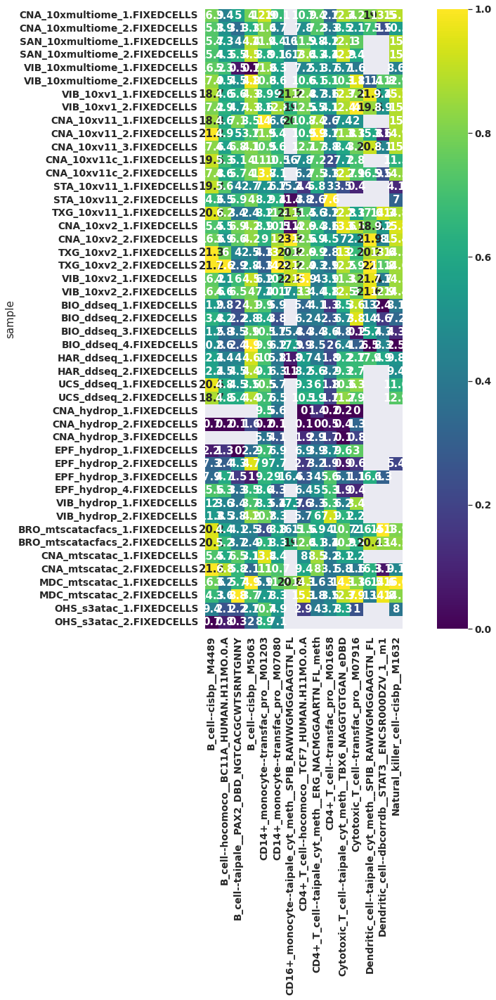

In [105]:
n_rows = len(n_dars_df)
n_cols = len(n_dars_df.columns)

f, ax = plt.subplots(figsize=(n_cols * 2, n_rows * 2))
sns.heatmap(nes_per_selectedmotif_normalized, ax=ax, square=True, cmap="viridis")
sns.heatmap(
    nes_per_selectedmotif,
    annot=True,
    ax=ax,
    fmt="g",
    square=True,
    cmap=None,
    cbar=False,
    alpha=0,
)
plt.tight_layout()
plt.savefig(
    "plots_pub/selected_motif_NES_mean_bysample.png",
    dpi=300,
    facecolor="white",
    bbox_inches="tight",
)

##  bytech

In [141]:
nes_per_selectedmotif["tech"] = [x.split("_")[1] for x in nes_per_selectedmotif.index]
nes_per_selectedmotif_bytech = nes_per_selectedmotif.groupby("tech").mean()

In [142]:
nes_per_selectedmotif_bytech

,B_cell--cisbp__M4489,B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A,B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY,B_cell--cisbp__M5063,CD14+_monocyte--transfac_pro__M01203,CD14+_monocyte--transfac_pro__M07080,CD16+_monocyte--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,CD4+_T_cell--hocomoco__TCF7_HUMAN.H11MO.0.A,CD4+_T_cell--taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth,CD4+_T_cell--transfac_pro__M01658,Cytotoxic_T_cell--taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD,Cytotoxic_T_cell--transfac_pro__M07916,Dendritic_cell--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL,Dendritic_cell--dbcorrdb__STAT3__ENCSR000DZV_1__m1,Natural_killer_cell--cisbp__M1632
tech,,,,,,,,,,,,,,,
10xmultiome,16.316667,4.283333,3.766667,3.616667,11.116667,8.700000,16.350000,10.300000,6.316667,3.900000,10.450000,2.683333,15.833333,10.266667,12.816667
10xv1,17.950000,4.750000,5.150000,4.300000,8.750000,10.900000,20.100000,12.650000,5.100000,3.850000,12.550000,3.650000,20.550000,9.150000,15.100000
10xv11,18.533333,4.866667,5.366667,3.400000,9.933333,8.850000,17.050000,8.666667,6.500000,3.983333,8.780000,2.220000,18.033333,8.666667,11.800000
10xv11c,18.650000,4.950000,5.400000,4.000000,12.400000,9.300000,16.000000,7.000000,7.350000,2.650000,10.200000,2.850000,16.900000,5.500000,12.900000
10xv2,17.900000,5.116667,5.483333,3.700000,6.683333,12.066667,19.533333,13.366667,5.316667,3.750000,11.650000,2.900000,20.950000,10.533333,14.833333
ddseq,14.000000,3.612500,3.562500,4.075000,9.700000,5.737500,14.150000,7.025000,4.562500,2.212500,8.400000,2.550000,13.260000,6.500000,8.225000
hydrop,8.214286,3.000000,2.342857,2.985714,7.866667,5.600000,17.150000,3.511111,3.300000,3.477778,3.722222,1.422222,16.100000,6.300000,5.400000
mtscatac,16.900000,4.575000,6.700000,3.450000,9.500000,9.650000,20.800000,11.650000,5.975000,3.200000,10.175000,2.750000,15.266667,10.833333,13.266667
mtscatacfacs,20.150000,4.800000,3.900000,2.450000,6.350000,8.550000,17.750000,12.000000,6.000000,3.700000,10.800000,2.250000,18.400000,14.050000,14.050000


In [108]:
cell_type_sets = [
    [
        "B_cell--cisbp__M4489",
        "B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A",
        "B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY",
        "B_cell--cisbp__M5063",
    ],
    [
        "CD14+_monocyte--transfac_pro__M01203",
        "CD14+_monocyte--transfac_pro__M07080",
    ],
    [
        "CD16+_monocyte--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL",
    ],
    [
        "CD4+_T_cell--hocomoco__TCF7_HUMAN.H11MO.0.A",
        "CD4+_T_cell--taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth",
        "CD4+_T_cell--transfac_pro__M01658",
    ],
    [
        "Cytotoxic_T_cell--taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD",
    ],
    [
        "Dendritic_cell--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL",
        "Dendritic_cell--dbcorrdb__STAT3__ENCSR000DZV_1__m1",
    ],
    [
        "Natural_killer_cell--cisbp__M1632",
    ],
]

In [109]:
motif_alias_dict = {
    "cisbp__M4489": "SPI1",
    "hocomoco__BC11A_HUMAN.H11MO.0.A": "BCL11A",
    "taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY": "PAX2",
    "cisbp__M5063": "TCF4",
    "transfac_pro__M01203": "SPI1",
    "transfac_pro__M07080": "CEBPB",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "SPIB",
    "hocomoco__TCF7_HUMAN.H11MO.0.A": "TCF7",
    "taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth": "ERG",
    "transfac_pro__M01658": "RUNX",
    "taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD": "TBX6",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "SPIB",
    "dbcorrdb__STAT3__ENCSR000DZV_1__m1": "STAT3",
    "cisbp__M1632": "EOMES",
}

In [110]:
names = nes_per_selectedmotif_bytech.columns

In [111]:
for motif in motif_alias_dict.keys():
    names = [x.replace(motif, motif_alias_dict[motif]) for x in names]

In [112]:
names = [" ".join((x.split("--"))) for x in names]

In [113]:
names

['B_cell SPI1',
 'B_cell BCL11A',
 'B_cell PAX2',
 'B_cell TCF4',
 'CD14+_monocyte SPI1',
 'CD14+_monocyte CEBPB',
 'CD16+_monocyte SPIB',
 'CD4+_T_cell TCF7',
 'CD4+_T_cell ERG',
 'CD4+_T_cell RUNX',
 'Cytotoxic_T_cell TBX6',
 'Cytotoxic_T_cell transfac_pro__M07916',
 'Dendritic_cell SPIB',
 'Dendritic_cell STAT3',
 'Natural_killer_cell EOMES']

In [114]:
for cell_type in cell_type_alias_dict.keys():
    names = [
        x.replace(cell_type.replace(" ", "_"), cell_type_alias_dict[cell_type])
        for x in names
    ]

In [115]:
nes_per_selectedmotif_bytech.columns = names

In [116]:
list(nes_per_selectedmotif_bytech.columns)

['B cell SPI1',
 'B cell BCL11A',
 'B cell PAX2',
 'B cell TCF4',
 'CD14+ monocyte SPI1',
 'CD14+ monocyte CEBPB',
 'CD16+ monocyte SPIB',
 'Naive T cell TCF7',
 'Naive T cell ERG',
 'Naive T cell RUNX',
 'Cytotoxic T cell TBX6',
 'Cytotoxic T cell transfac_pro__M07916',
 'Dendritic cell SPIB',
 'Dendritic cell STAT3',
 'Natural killer cell EOMES']

In [117]:
cols = [
    "Dendritic cell SPIB",
    "Dendritic cell STAT3",
    "CD14+ monocyte CEBPB",
    "CD16+ monocyte SPIB",
    "Natural killer cell EOMES",
    "B cell SPI1",
    "B cell BCL11A",
    "B cell PAX2",
    "B cell TCF4",
    "CD14+ monocyte SPI1",
    "Naive T cell TCF7",
    "Naive T cell ERG",
    "Naive T cell RUNX",
    "Cytotoxic T cell TBX6",
]

In [119]:
tech_order = [
    "10xv1",
    "10xv11",
    "10xv11c",
    "10xv2",
    "10xmultiome",
    "mtscatac",
    "mtscatacfacs",
    "ddseq",
    "s3atac",
    "hydrop",
]

In [120]:
nes_per_selectedmotif_bytech = nes_per_selectedmotif_bytech.loc[tech_order]

In [121]:
tech_alias_dict = {
    "10xmultiome": "10x Multiome",
    "10xv1": "10x v1",
    "10xv11": "10x v1.1",
    "10xv11c": "10x v1.1 (control)",
    "10xv2": "10x v2",
    "ddseq": "Bio-Rad ddSEQ SureCell",
    "hydrop": "HyDrop",
    "mtscatac": "mtscATAC-seq",
    "mtscatacfacs": "mtscATAC-seq (FACS)",
    "s3atac": "s3-ATAC",
}

In [122]:
nes_per_selectedmotif_bytech.index = [
    tech_alias_dict[x] for x in nes_per_selectedmotif_bytech.index
]

In [123]:
nes_per_selectedmotif_bytech_normalized = nes_per_selectedmotif_bytech.transform(
    lambda x: minmax_scale(x.astype(float))
)

In [124]:
tech_alias_order = [
    "10x v1",
    "10x v1.1",
    "10x v1.1 (control)",
    "10x v2",
    "10x Multiome",
    "mtscATAC-seq",
    "mtscATAC-seq (FACS)",
    "Bio-Rad ddSEQ SureCell",
    "s3-ATAC",
    "HyDrop",
]

In [125]:
nes_per_selectedmotif_bytech_normalized.loc[tech_alias_order]

,Dendritic cell SPIB,Dendritic cell STAT3,CD14+ monocyte CEBPB,CD16+ monocyte SPIB,Natural killer cell EOMES,B cell SPI1,B cell BCL11A,B cell PAX2,B cell TCF4,CD14+ monocyte SPI1,Naive T cell TCF7,Naive T cell ERG,Naive T cell RUNX,Cytotoxic T cell TBX6
10x v1,0.947984,0.426901,0.819588,0.894737,1.000000,0.854305,0.900000,0.715596,1.000000,0.396694,0.931529,0.444444,0.924706,1.000000
10x v1.1,0.620720,0.370370,0.502577,0.436090,0.659794,0.892936,0.931818,0.755352,0.538462,0.592287,0.550955,0.790123,1.000000,0.572939
10x v1.1 (control),0.473342,0.000000,0.572165,0.278195,0.773196,0.900662,0.954545,0.761468,0.846154,1.000000,0.391720,1.000000,0.247059,0.733795
10x v2,1.000000,0.588694,1.000000,0.809524,0.972509,0.850993,1.000000,0.776758,0.692308,0.055096,1.000000,0.497942,0.868235,0.898049
10x Multiome,0.334634,0.557505,0.479381,0.330827,0.764605,0.746137,0.772727,0.461774,0.649573,0.787879,0.707006,0.744856,0.952941,0.762115
mtscATAC-seq,0.260945,0.623782,0.626289,1.000000,0.810997,0.784768,0.852273,1.000000,0.564103,0.520661,0.835987,0.660494,0.557647,0.730963
mtscATAC-seq (FACS),0.668401,1.000000,0.456186,0.541353,0.891753,1.000000,0.913636,0.486239,0.051282,0.000000,0.869427,0.666667,0.840000,0.801762
Bio-Rad ddSEQ SureCell,0.000000,0.116959,0.021263,0.000000,0.291237,0.592715,0.589773,0.424312,0.884615,0.553719,0.394108,0.311728,0.000000,0.529893
s3-ATAC,NaN,NaN,0.293814,NaN,0.268041,0.000000,0.000000,0.000000,0.000000,0.545455,0.000000,0.172840,0.840000,0.518565
HyDrop,0.369311,0.093567,0.000000,0.451128,0.000000,0.209555,0.422727,0.200524,0.326007,0.250689,0.058386,0.000000,0.714510,0.000000


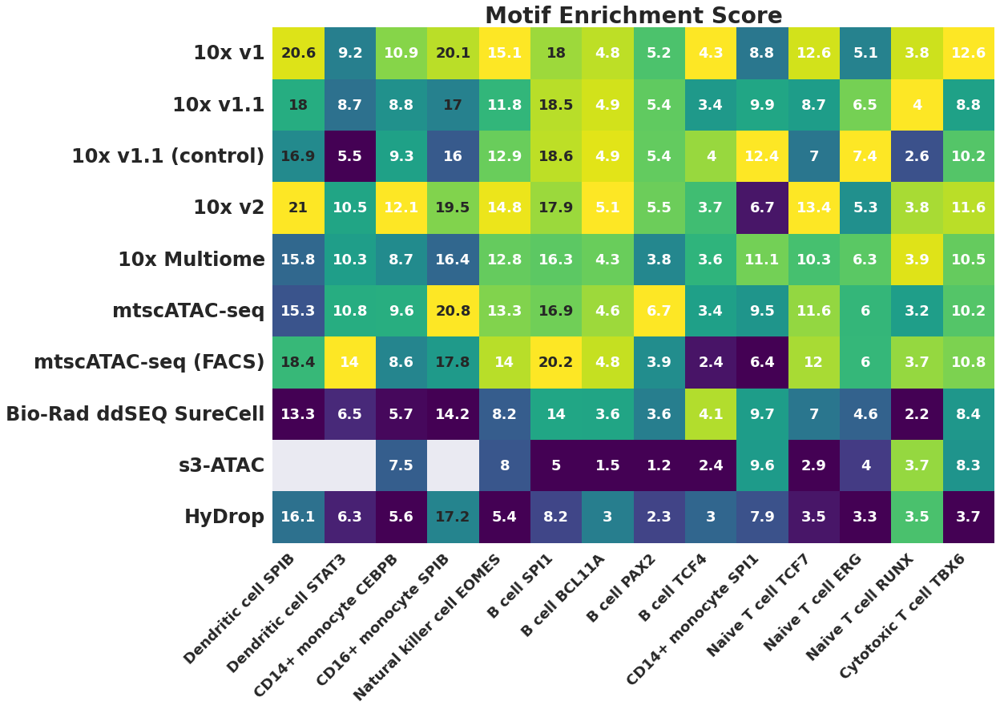

In [126]:
n_rows = len(nes_per_selectedmotif_bytech)
n_cols = len(nes_per_selectedmotif_bytech.columns)
sns.set(font_scale=1.5)
f, ax = plt.subplots(figsize=(n_cols * 1.25, n_rows * 1.25))
sns.heatmap(
    nes_per_selectedmotif_bytech_normalized.loc[tech_alias_order],
    ax=ax,
    square=True,
    cmap="viridis",
    cbar=False,
)
sns.set(font_scale=1.5)

sns.heatmap(
    nes_per_selectedmotif_bytech.loc[tech_alias_order].round(1),
    annot=True,
    ax=ax,
    fmt="g",
    square=True,
    cmap=None,
    cbar=False,
    alpha=0,
)
plt.xticks(rotation=45, fontsize=18, ha="right")
plt.yticks(fontsize=24)

plt.tight_layout()
plt.title("Motif Enrichment Score", fontsize=28, fontweight="bold")
plt.savefig("plots_pub/selected_motif_NES_mean_bytech.png", dpi=600, facecolor="white")
plt.savefig("plots_pub/selected_motif_NES_mean_bytech.svg", dpi=600, facecolor="white")

In [127]:
cols = [x.split("--")[0] for x in nes_per_selectedmotif_bytech.columns]

In [128]:
import numpy as np

In [129]:
np.unique(cols, return_index=True)

(array(['B cell BCL11A', 'B cell PAX2', 'B cell SPI1', 'B cell TCF4',
        'CD14+ monocyte CEBPB', 'CD14+ monocyte SPI1',
        'CD16+ monocyte SPIB', 'Cytotoxic T cell TBX6',
        'Dendritic cell SPIB', 'Dendritic cell STAT3', 'Naive T cell ERG',
        'Naive T cell RUNX', 'Naive T cell TCF7',
        'Natural killer cell EOMES'], dtype='<U25'),
 array([ 6,  7,  5,  8,  2,  9,  3, 13,  0,  1, 11, 12, 10,  4]))

In [130]:
cell_type_sets = [
    [
        "B_cell--cisbp__M4489",
        "B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A",
        "B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY",
        "B_cell--cisbp__M5063",
    ],
    [
        "CD14+_monocyte--transfac_pro__M01203",
        "CD14+_monocyte--transfac_pro__M07080",
    ],
    [
        "CD16+_monocyte--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL",
    ],
    [
        "CD4+_T_cell--hocomoco__TCF7_HUMAN.H11MO.0.A",
        "CD4+_T_cell--taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth",
        "CD4+_T_cell--transfac_pro__M01658",
    ],
    [
        "Cytotoxic_T_cell--taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD",
    ],
    [
        "Dendritic_cell--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL",
        "Dendritic_cell--dbcorrdb__STAT3__ENCSR000DZV_1__m1",
    ],
    [
        "Natural_killer_cell--cisbp__M1632",
    ],
]

In [131]:
motif_alias_dict = {
    "cisbp__M4489": "SPI1",
    "hocomoco__BC11A_HUMAN.H11MO.0.A": "BCL11A",
    "taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY": "PAX2",
    "cisbp__M5063": "TCF4",
    "transfac_pro__M01203": "SPI1",
    "transfac_pro__M07080": "CEBPB",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "SPIB",
    "hocomoco__TCF7_HUMAN.H11MO.0.A": "TCF7",
    "taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth": "ERG",
    "transfac_pro__M01658": "RUNX",
    "taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD": "TBX6",
    "taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL": "SPIB",
    "dbcorrdb__STAT3__ENCSR000DZV_1__m1": "STAT3",
    "cisbp__M1632": "EOMES",
}

In [132]:
motif_alias_dict

{'cisbp__M4489': 'SPI1',
 'hocomoco__BC11A_HUMAN.H11MO.0.A': 'BCL11A',
 'taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY': 'PAX2',
 'cisbp__M5063': 'TCF4',
 'transfac_pro__M01203': 'SPI1',
 'transfac_pro__M07080': 'CEBPB',
 'taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL': 'SPIB',
 'hocomoco__TCF7_HUMAN.H11MO.0.A': 'TCF7',
 'taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth': 'ERG',
 'transfac_pro__M01658': 'RUNX',
 'taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD': 'TBX6',
 'dbcorrdb__STAT3__ENCSR000DZV_1__m1': 'STAT3',
 'cisbp__M1632': 'EOMES'}

In [133]:
df_sub

FeatureAnnotations
CTCF                       2710
POLR2A                     2370
EZH2                       1466
MYC                        1239
MAX                        1196
                           ... 
NMI                           0
NR2F1,HNF4G,HNF4A,NR2F2       0
ZNF706                        0
NR3C1,ZFP42,PGR               0
ZNF302                        0
Name: Natural_killer_cell, Length: 2932, dtype: int64

In [134]:
len(cell_type_sets)

7

In [135]:
len(df_sub)

2932

In [137]:
cell_type_set

['B_cell--cisbp__M4489',
 'B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A',
 'B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY',
 'B_cell--cisbp__M5063']

In [139]:
cell_type_sets

[['B_cell--cisbp__M4489',
  'B_cell--hocomoco__BC11A_HUMAN.H11MO.0.A',
  'B_cell--taipale__PAX2_DBD_NGTCACGCWTSRNTGNNY',
  'B_cell--cisbp__M5063'],
 ['CD14+_monocyte--transfac_pro__M01203',
  'CD14+_monocyte--transfac_pro__M07080'],
 ['CD16+_monocyte--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL'],
 ['CD4+_T_cell--hocomoco__TCF7_HUMAN.H11MO.0.A',
  'CD4+_T_cell--taipale_cyt_meth__ERG_NACMGGAARTN_FL_meth',
  'CD4+_T_cell--transfac_pro__M01658'],
 ['Cytotoxic_T_cell--taipale_cyt_meth__TBX6_NAGGTGTGAN_eDBD'],
 ['Dendritic_cell--taipale_cyt_meth__SPIB_RAWWGMGGAAGTN_FL',
  'Dendritic_cell--dbcorrdb__STAT3__ENCSR000DZV_1__m1'],
 ['Natural_killer_cell--cisbp__M1632']]

In [138]:
nes_per_selectedmotif_bytech

,Dendritic cell SPIB,Dendritic cell STAT3,CD14+ monocyte CEBPB,CD16+ monocyte SPIB,Natural killer cell EOMES,B cell SPI1,B cell BCL11A,B cell PAX2,B cell TCF4,CD14+ monocyte SPI1,Naive T cell TCF7,Naive T cell ERG,Naive T cell RUNX,Cytotoxic T cell TBX6
10x v1,20.550000,9.150000,10.900000,20.100000,15.100000,17.950000,4.750000,5.150000,4.300000,8.750000,12.650000,5.100000,3.850000,12.550000
10x v1.1,18.033333,8.666667,8.850000,17.050000,11.800000,18.533333,4.866667,5.366667,3.400000,9.933333,8.666667,6.500000,3.983333,8.780000
10x v1.1 (control),16.900000,5.500000,9.300000,16.000000,12.900000,18.650000,4.950000,5.400000,4.000000,12.400000,7.000000,7.350000,2.650000,10.200000
10x v2,20.950000,10.533333,12.066667,19.533333,14.833333,17.900000,5.116667,5.483333,3.700000,6.683333,13.366667,5.316667,3.750000,11.650000
10x Multiome,15.833333,10.266667,8.700000,16.350000,12.816667,16.316667,4.283333,3.766667,3.616667,11.116667,10.300000,6.316667,3.900000,10.450000
mtscATAC-seq,15.266667,10.833333,9.650000,20.800000,13.266667,16.900000,4.575000,6.700000,3.450000,9.500000,11.650000,5.975000,3.200000,10.175000
mtscATAC-seq (FACS),18.400000,14.050000,8.550000,17.750000,14.050000,20.150000,4.800000,3.900000,2.450000,6.350000,12.000000,6.000000,3.700000,10.800000
Bio-Rad ddSEQ SureCell,13.260000,6.500000,5.737500,14.150000,8.225000,14.000000,3.612500,3.562500,4.075000,9.700000,7.025000,4.562500,2.212500,8.400000
s3-ATAC,NaN,NaN,7.500000,NaN,8.000000,5.050000,1.450000,1.250000,2.350000,9.650000,2.900000,4.000000,3.700000,8.300000
HyDrop,16.100000,6.300000,5.600000,17.150000,5.400000,8.214286,3.000000,2.342857,2.985714,7.866667,3.511111,3.300000,3.477778,3.722222


In [ ]:
sns.set(font_scale=1.5)
for cell_type_set in cell_type_sets:
    set_number = cell_type_sets.index(cell_type_set)
    cell_type = cell_type_set[0].split("--")[0]

    df_sub = nes_per_selectedmotif_bytech[cell_type_set]
    df_sub.columns = [motif_alias_dict[x.split("--")[-1]] for x in df_sub.columns]
    df_sub_normalized = df_sub.transform(lambda x: minmax_scale(x.astype(float)))

    n_rows = len(df_sub)
    n_cols = len(df_sub.columns)

    f, ax = plt.subplots()
    sns.heatmap(df_sub_normalized, ax=ax, square=True, cmap="viridis", cbar=False)
    sns.set(font_scale=1.2)

    sns.heatmap(
        df_sub.round(1),
        annot=True,
        ax=ax,
        fmt="g",
        square=True,
        cmap=None,
        cbar=False,
        alpha=0,
    )

    plt.xticks(rotation=45, fontsize=18, ha="right")
    plt.tight_layout()
    plt.title(f"{cell_type}", fontsize=18, fontweight="bold")
    plt.savefig(
        f"plots_pub/selected_motif_NES_mean_bytech_{set_number}.png",
        dpi=300,
        facecolor="white",
    )

In [ ]:
nes_per_selectedmotif_bytech

In [ ]:
n_rows = len(n_dars_df)
n_cols = len(n_dars_df.columns)

sizefactor = 1.2
f, ax = plt.subplots(figsize=(n_cols * sizefactor, n_rows * sizefactor))
plt.rcParams["font.weight"] = "bold"
sns.heatmap(n_dars_df_normalized, ax=ax, square=True, cmap="viridis", cbar=False)
sns.heatmap(
    n_dars_df.round(0),
    annot=True,
    ax=ax,
    fmt="g",
    square=True,
    cmap=None,
    cbar=False,
    alpha=0,
    annot_kws={"fontsize": 14},
)
plt.yticks(fontsize=18)
plt.xticks(rotation=45, fontsize=18, ha="right")

plt.tight_layout()
plt.title("Median # DARs detected", fontsize=22, fontweight="bold")
# plt.savefig("plots_pub/DAR_count_mean_bytech.svg", dpi=600, facecolor="white")